In [1]:
# depending on where you run this, this may have to be %matplotlib notebook
%matplotlib inline

import os
import astropy
import requests
import pandas as pd
import numpy as np
import lightkurve as lk 
from scipy.interpolate import interp1d
from astropy.modeling import models, fitting
import matplotlib.pyplot as plt
import emcee
import sys
import csv
from astropy.timeseries import LombScargle
from os.path import basename, exists

# change these paths to wherever you have the files
# sys.path.insert(1,'/Users/neisner/Documents/code/utils/')
import filters # Suzanne's functions
import norm

# change these paths to wherever you have the files
# sys.path.insert(1,'/Users/neisner/Documents/code/ETV')
import etv_functions # Nora's functions 

%matplotlib inline

In [2]:
from IPython.display import display, HTML, Javascript, clear_output

display(HTML("<style>.container { width:99% !important; }</style>"))  # Jupyter 6
display(HTML("<style>.jp-Notebook { --jp-notebook-max-width: 98%; }</style>"))  # Jupyter 7

# define the paths where the data will be stores - NEED TO CHANGE THIS TO YOUR OWN PATH
outfile_base = './etv_out'  # for ETV
lk_download_dir = 'C:/dev/_juypter/PH_TESS_LightCurveViewer/data'  

# A command from shell that can be run to notify users, e.g., fitting is finished. Use "echo" if you do not have one
NOTIFY_CMD = "win-notify.bat"

if hasattr(lk, "conf"):  # default download dir
    lk.conf.cache_dir = lk_download_dir
if hasattr(lk.search, "sr_cache"):   # PR for persistent query result cache
    lk.search.sr_cache.cache_dir = lk_download_dir  # None
    lk.search.sr_cache.expire_second = 86400

## Reproduce ETV Result for KIC 6545018, trial of using a small eclipse window to exclude T<sub>1</sub> and T<sub>4</sub>

- also known as TIC 169820995 

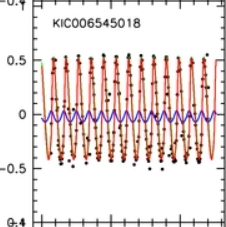

(x, time-span: ~1300 d ; y, O-C in kilosecs)

Source:  `2013ApJ...768...33R` [Triple-star Candidates among the Kepler Binaries](https://ui.adsabs.harvard.edu/abs/2013ApJ...768...33R/abstract) 


In [3]:
# define the plotting parameters

figsize = (8,4)

In [4]:
# import the data

# choose a TIC ID to analyze
ticid = 169820995 
kicid = 6545018  # ETV amplitude 1000s
# reference: 2013ApJ
# 
# TODO: consider to include Kepler data

# define the paths where the data will be stores - NEED TO CHANGE THIS TO YOUR OWN PATH
outfile_path = f"{outfile_base}/tic{ticid}_etv_primary_smallwin.csv"
outfile_path_s = f"{outfile_base}/tic{ticid}_etv_secondary_smallwin.csv"


# import data using Lightkurve
# sr = lk.search_lightcurve('TIC {}'.format(ticid), author = 'SPOC')  
if not "../.." in sys.path:
    sys.path.append("../..")
import lightkurve_ext as lke  # at ../../
import astropy.units as u



sr = lk.search_lightcurve('KIC{}'.format(kicid))
sr = sr[sr.exptime == 1800 * u.s]  # exclude 1 quarter that has both 30min and 1min cadence data
sr = lke._sort_chronologically(sr)
display(sr)
lcc_kplr = sr.download_all()
lc_kplr = lcc_kplr[:].stitch()
lc_kplr.time.format = "mjd"  # to be consistent with the paper result, also for ease of combining with TESS data
lc_kplr = lc_kplr.truncate(None, 55800)  # test with a few ETV cycles based on reference plot

# sr = lk.search_lightcurve('TIC {}'.format(ticid), )  # all available TESS sectors has only QLP data for this target
# sr = lke.filter_by_priority(sr, author_priority=['SPOC', 'TESS-SPOC'], exptime_priority=['short', 'long', 'fast'])
# sr = sr[np.isin(sr.author, ['SPOC', 'TESS-SPOC'])]  # exclude QLP to ensure for uniformity in the data
# sr = lke._sort_chronologically(sr)  # workaround lightkurve v2.4.2+ change in sort order
# display(sr)
# lc_tess = sr.download_all().stitch()
# lc_tess.time.format = "mjd"

search_result = lk.LightCurveCollection([
    lc_kplr,
    # lc_tess,
]).stitch()

time = search_result.time.value
flux = search_result.flux.value
fluxerr = search_result.flux_err.value
len(search_result)

#,mission,year,author,exptime,target_name,distance,proposal_id
,,,,s,,arcsec,
0,Kepler Quarter 01,2009,Kepler,1800,kplr006545018,0.0,EX
1,Kepler Quarter 02,2009,Kepler,1800,kplr006545018,0.0,EX
2,Kepler Quarter 03,2009,Kepler,1800,kplr006545018,0.0,EX
3,Kepler Quarter 04,2010,Kepler,1800,kplr006545018,0.0,EX
4,Kepler Quarter 05,2010,Kepler,1800,kplr006545018,0.0,EX
5,Kepler Quarter 06,2010,Kepler,1800,kplr006545018,0.0,EX
6,Kepler Quarter 07,2010,Kepler,1800,kplr006545018,0.0,EX
7,Kepler Quarter 08,2011,Kepler,1800,kplr006545018,0.0,EX
8,Kepler Quarter 09,2011,Kepler,1800,kplr006545018,0.0,EX


37582

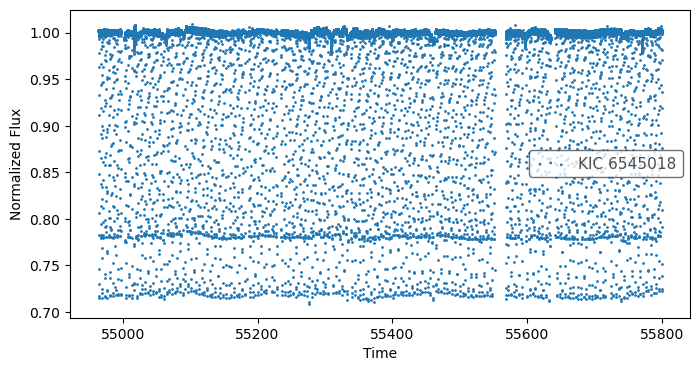

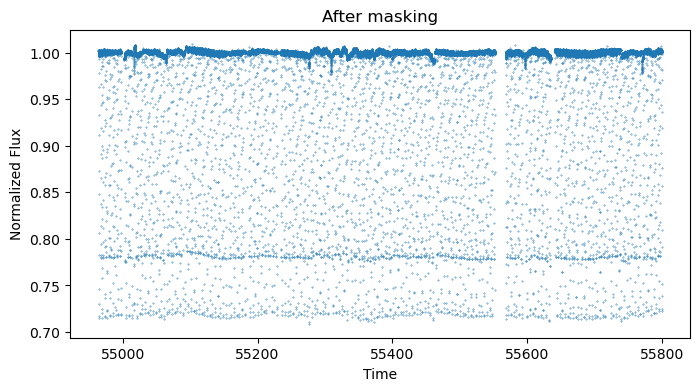

In [5]:
%matplotlib inline
# %matplotlib widget

# mask out data you don't like...

fig, ax = plt.subplots(figsize=figsize)
search_result.scatter(ax = ax)


mask = time < 0 #( time > 54950) & (time < 54963)  #  truncate weird spikes at the beginning of Kepler data  

time = time[~mask]
flux = flux[~mask]
fluxerr = fluxerr[~mask]

# make sure that therte are no nans!

finite_mask = np.isfinite(time) * np.isfinite(flux) * np.isfinite(fluxerr)

# make a dictionary of the data 

data = pd.DataFrame({'time': time[finite_mask], 'flux': flux[finite_mask], 'err': fluxerr[finite_mask]})

ax2 = plt.figure(figsize=figsize).gca()
ax2.scatter(data.time, data.flux, s=0.1);
ax2.set_ylabel(ax.get_ylabel())
ax2.set_xlabel(ax.get_xlabel())
ax2.set_title("After masking");

In [ ]:
do_bls = False

if do_bls:
    if not "../.." in sys.path:
        sys.path.append("../..")
    import lightkurve_ext_pg_runner as lke_pg_runner  # at ../../

    bls_result = lke_pg_runner.run_bls(
        search_result.remove_nans(),
        pg_kwargs=dict(
            minimum_period=1, maximum_period=20,
            frequency_factor=1,            
            duration=[3.4957 / 24 * f for f in [0.975, 1, 1.025, 1.05, 1.1, 1.15,]],  # based on observed primary eclipse duration for better fit
        ),
    )
    !$NOTIFY_CMD  "BLS Done"

In [ ]:
# Visaully compare different candidate period

# ax = search_result.normalize().fold(epoch_time=1471.4196, period=8.418132651611877).truncate(-0.1, 0.1).scatter(label="BLS period, frequency_factor=10");  # HWHM 0.001571020094789155
# ax = search_result.normalize().fold(epoch_time=1471.4196, period=8.418147).truncate(-0.1, 0.1).scatter(label="s0001-s0009:TCE1");

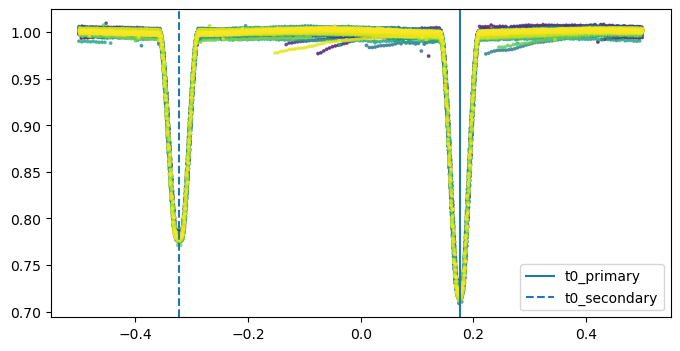

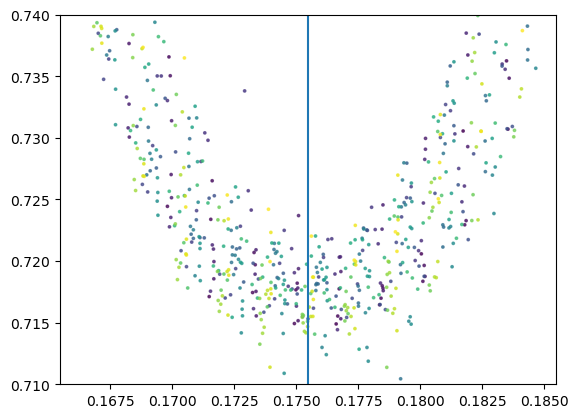

In [6]:
%matplotlib inline
# %matplotlib widget

from astropy.time import Time

# define the orbital period and the t0 

# FILL-IN THE eclipse epoch / period, 
# period = 3.9914603  # Kepler EB Period
period = 3.99146  # 2013ApJ Period


t0_primary = 54965.835642 - 0.5  # Kepler EB, the MJD there seems to be off by 0.5
t0_secondary = t0_primary + period * 0.5013


# convert epoch from BTJD to commonly mjd used here
# t0_primary = Time(t0_primary, format="btjd").to_value("mjd")
# t0_secondary = Time(t0_secondary, format="btjd").to_value("mjd")

# Move t0 to the first dip in the data (some of the subsequent codes, espically fit_each_eclipse(), assumes that)
t0_primary = t0_primary - int((t0_primary - data['time'][0]) / period) * period
t0_secondary = t0_secondary - int((t0_secondary - data['time'][0]) / period) * period

duration_hr_primary = 0.0530 * period * 24  # used for the window to cut the lighcurve around eclipses in later cells
duration_hr_secondary = 0.0571 * period * 24  

# t0_for_plotting = 0  # keep 0 for plotting purposes
t0_for_plotting = t0_primary - np.abs(t0_primary - t0_secondary) * 0.35  # use a custom one so that the eclipses are not near the edge (-0.5 or +0.5)

phase = etv_functions.phase_data(data['time'], t0_for_plotting, period)

fig, ax = plt.subplots(figsize = (8,4))

plt.scatter(phase,data['flux'], s = 3, alpha = 0.7, c = data['time'])

# add the phase to the dataframe
data['phase'] = phase

plt.axvline(etv_functions.phase_data([t0_primary], t0_for_plotting, period)[0], label="t0_primary")
if t0_secondary is not None:
    plt.axvline(etv_functions.phase_data([t0_secondary], t0_for_plotting, period)[0], linestyle="--", label="t0_secondary")
plt.legend()
# plt.ylim(0.535, 0.55)
# plt.xlim(-0.5, 0.1)
plt.show();

plt.scatter(phase,data['flux'], s = 3, alpha = 0.7, c = data['time'])
plt.axvline(etv_functions.phase_data([t0_primary], t0_for_plotting, period)[0], label="t0_primary")
plt.xlim(etv_functions.phase_data([t0_primary], t0_for_plotting, period)[0] - 0.01, etv_functions.phase_data([t0_primary], t0_for_plotting, period)[0] + 0.01);
plt.ylim(0.71, 0.74);
plt.show()

### Now that the data is ready we can start 

In [7]:
# show data to visualize what's changed in each step below
data  

,time,flux,err,phase
0,54964.011994,1.002106,0.000147,-0.156165
1,54964.032429,1.001981,0.000147,-0.151045
2,54964.052863,1.002445,0.000147,-0.145926
3,54964.073298,1.002443,0.000147,-0.140806
4,54964.093732,1.002116,0.000147,-0.135687
...,...,...,...,...
37526,55799.912289,1.001982,0.000159,0.266025
37527,55799.932723,1.002348,0.000159,0.271144
37528,55799.953156,1.002881,0.000159,0.276264
37529,55799.973590,1.001993,0.000159,0.281383


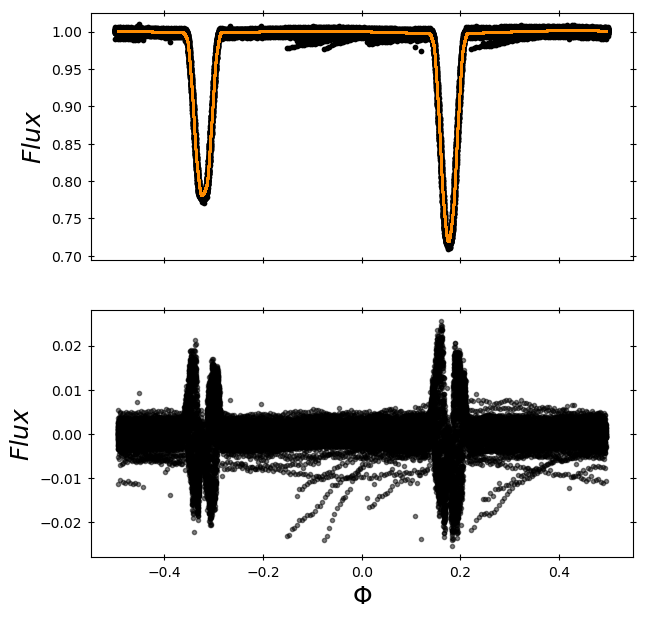

,time,flux,err,phase,flux_sub_binary,binary_model
0,54964.011994,1.002106,0.000147,-0.156165,0.001368,1.000738
1,54964.032429,1.001981,0.000147,-0.151045,0.001177,1.000803
2,54964.052863,1.002445,0.000147,-0.145926,0.001565,1.000880
3,54964.073298,1.002443,0.000147,-0.140806,0.001558,1.000884
4,54964.093732,1.002116,0.000147,-0.135687,0.001231,1.000885
...,...,...,...,...,...,...
37526,55799.912289,1.001982,0.000159,0.266025,0.002846,0.999136
37527,55799.932723,1.002348,0.000159,0.271144,0.003105,0.999243
37528,55799.953156,1.002881,0.000159,0.276264,0.003512,0.999368
37529,55799.973590,1.001993,0.000159,0.281383,0.002455,0.999538


In [8]:
# phase fold the data and create an appoximate binary model (top) and subtract it from the data (bottom)
#_, _ , flux_sub_binary, model, _, _ = etv_functions.trend_removal_interact(period, 0, data['time'], data['flux'], data['time'], data['flux'])

data = etv_functions.trend_removal_interact(period, t0_for_plotting, data)
data

10 37150 901
reached the end
10 32548 901
reached the end
10 32014 901
reached the end
10 31900 901
reached the end
10 31875 901
reached the end


,time,flux,err,phase,flux_sub_binary,binary_model,flux_detrended
0,54964.011994,1.002106,0.000147,-0.156165,0.001368,1.000738,1.000738
1,54964.032429,1.001981,0.000147,-0.151045,0.001177,1.000803,1.000620
2,54964.052863,1.002445,0.000147,-0.145926,0.001565,1.000880,1.001091
3,54964.073298,1.002443,0.000147,-0.140806,0.001558,1.000884,1.001095
4,54964.093732,1.002116,0.000147,-0.135687,0.001231,1.000885,1.000776
...,...,...,...,...,...,...,...
37526,55799.912289,1.001982,0.000159,0.266025,0.002846,0.999136,0.999200
37527,55799.932723,1.002348,0.000159,0.271144,0.003105,0.999243,0.999561
37528,55799.953156,1.002881,0.000159,0.276264,0.003512,0.999368,1.000088
37529,55799.973590,1.001993,0.000159,0.281383,0.002455,0.999538,0.999195


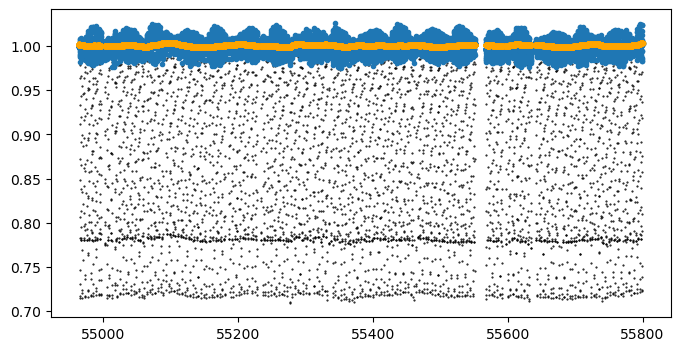

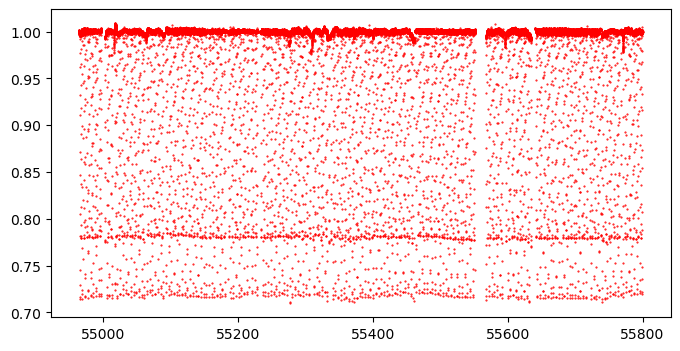

In [9]:
# if you want to detrend the data run this line!

data = etv_functions.detrend_suz(data, T_dur = 10, plot = True)
data

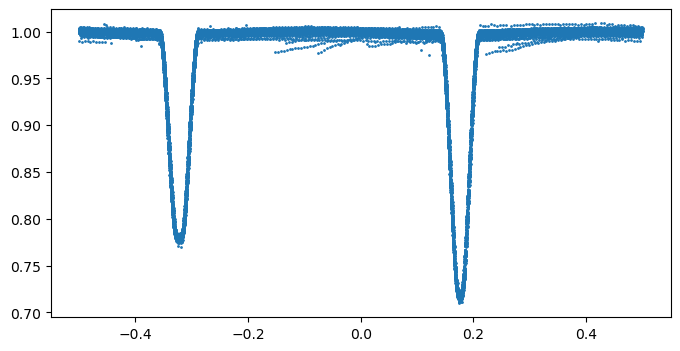

In [10]:
# plot the phase folded data here so that you know at what phase you want to cut the data to model 
fig, ax = plt.subplots(figsize = figsize)
plt.scatter(data.phase, data.flux_detrended, s = 1)
plt.show()

Primary:   54965.335642 0.17545499999961056
window_width_p (phase): 0.031799999999999995
Secondary: 54967.336560897995 -0.3232450000012417
window_width_s (phase): 0.031405


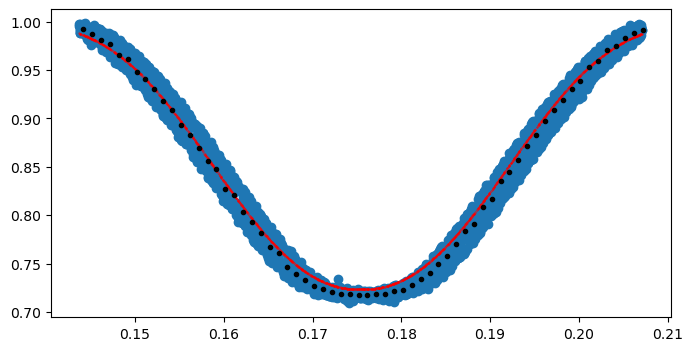

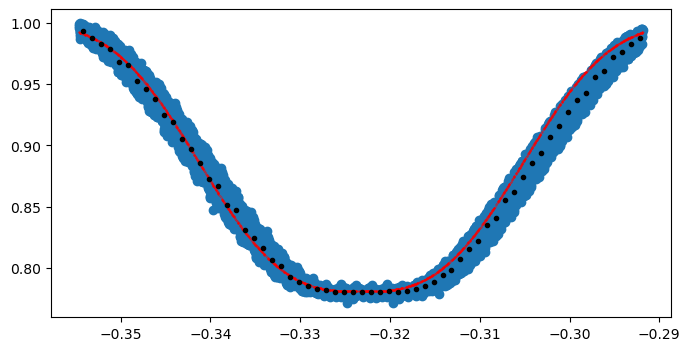

In [22]:
# define the midpoints of the primary and secondary eclipses and the window width

# if these don't look central - change them!! the eclipses should be central
midpoint_p =  etv_functions.phase_data([t0_primary], t0_for_plotting, period)[0]  # convet to time in phase
print('Primary:  ', t0_primary, midpoint_p)

# change depending on the width of the eclipses, default to be slightly larger than the primary eclipse
window_width_p = 0.6 * duration_hr_primary / 24 / period
# use a shoter duration to avoid fitting the out-of-eclipse LC, which has its own variability that the model is not equipped to hanlde
# window_width_p = 0.095
print("window_width_p (phase):", window_width_p)

data_primary = data[(data['phase'] > midpoint_p - window_width_p) & (data['phase'] < midpoint_p + window_width_p) ]
ph_binned,flux_binned,err_binned = etv_functions.run_binning_phased(data_primary.phase, data_primary.flux, yerr=data_primary.err,nbins=1000)


if t0_secondary is not None:
    midpoint_s =  etv_functions.phase_data([t0_secondary], t0_for_plotting, period)[0]
    print('Secondary:', t0_secondary, midpoint_s)
    
    window_width_s = 0.55 * duration_hr_secondary / 24 / period
    # window_width_s = window_width_p
    print("window_width_s (phase):", window_width_s)
    
    data_secondary = data[(data['phase'] > midpoint_s - window_width_s) & (data['phase'] < midpoint_s + window_width_s) ]
    ph_binned_s,flux_binned_s,err_binned_s = etv_functions.run_binning_phased(data_secondary.phase, data_secondary.flux, yerr=data_secondary.err,nbins=1000)


### # you need initial guesses!! The order is :
# alpha0, alpha1, t0, d, Tau - CHANGE THESE TO YOUR OWN INITIAL GUESSES
# median flux, -eclipse depth, t0, related to duration, related to shape (U or V) 
# t0 in normalixed phase
start_vals = [1.00, -0.2768, midpoint_p, 0.015, 1.1]
start_vals_s = [1.00, -0.2192, midpoint_s, 0.014, 1.5]

# -- -- -- -- -- -- -- -- -- 
etv_functions.plot_initial_guess(data_primary, ph_binned, flux_binned, err_binned, *start_vals)
etv_functions.plot_initial_guess(data_secondary, ph_binned_s, flux_binned_s, err_binned_s, *start_vals_s)    

100%|██████████████████████████████████████████████████████████| 1000/1000 [06:05<00:00,  2.73it/s]


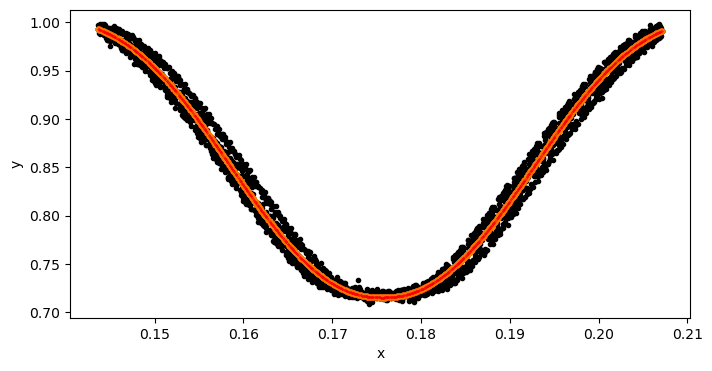

100%|██████████████████████████████████████████████████████████| 1000/1000 [02:44<00:00,  6.09it/s]


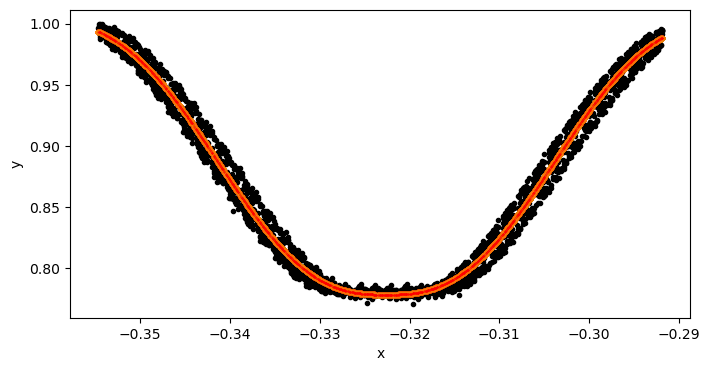

In [23]:
# run the initial model fit using MCMC for the primary and secondary eclipses 
run_init_fit = True

if run_init_fit:
    mean_alpha0, mean_alpha1, mean_t0, mean_d, mean_Tau = etv_functions.run_mcmc_initial_fit(data_primary, start_vals, nruns = 1000, plot_chains = False, plot = True)
    if t0_secondary is not None:
        mean_alpha0_s, mean_alpha1_s, mean_t0_s, mean_d_s, mean_Tau_s = etv_functions.run_mcmc_initial_fit(data_secondary, start_vals_s, nruns = 1000, plot_chains = False, plot = True)
    !$NOTIFY_CMD "Initial fit done"

In [ ]:
if not run_init_fit:  # case init fit has been previously saved and to be reussed
    print("Use pre-defined inital model params:")

    # # initial fit params from Kepler data (<MJD 55800) 2013Apj Period
    # mean_alpha0, mean_alpha1, mean_t0, mean_d, mean_Tau = 0.9992243926743156, -0.28289019141999194, 0.1756269273273081, 0.01465780655811189, 1.1695489103484835
    # mean_alpha0_s, mean_alpha1_s, mean_t0_s, mean_d_s, mean_Tau_s = 1.0000198023838813, -0.2209161523632035, -0.32261651494994603, 0.0146190296934322, 1.4343919805279435

    # initial fit params from Kepler data (<MJD 55800) 2013Apj Period, using small eclipse windows that excludes T1 and T4 from the truncated data to be modeled
    mean_alpha0, mean_alpha1, mean_t0, mean_d, mean_Tau = 1.0072524836970236, -0.29206612180435276, 0.17562742655042518, 0.01528213763212679, 1.105187854086712
    mean_alpha0_s, mean_alpha1_s, mean_t0_s, mean_d_s, mean_Tau_s = 1.006183528031924, -0.22784046100458272, -0.322614588540863, 0.015186368213815447, 1.3516835826166904

    etv_functions.plot_initial_guess(data_primary, ph_binned, flux_binned, err_binned, *[mean_alpha0, mean_alpha1, mean_t0, mean_d, mean_Tau])
    etv_functions.plot_initial_guess(data_secondary, ph_binned_s, flux_binned_s, err_binned_s, *[mean_alpha0_s, mean_alpha1_s, mean_t0_s, mean_d_s, mean_Tau_s])    

In [25]:
print("Initial model params:")  # For information, and they can be copied to the cell above for future reuse

print("mean_alpha0, mean_alpha1, mean_t0, mean_d, mean_Tau = " + ", ".join([str(v) for v in [mean_alpha0, mean_alpha1, mean_t0, mean_d, mean_Tau]]))
if t0_secondary is not None:
    print("mean_alpha0_s, mean_alpha1_s, mean_t0_s, mean_d_s, mean_Tau_s = " + ", ".join([str(v) for v in [mean_alpha0_s, mean_alpha1_s, mean_t0_s, mean_d_s, mean_Tau_s]]))

Initial model params:
mean_alpha0, mean_alpha1, mean_t0, mean_d, mean_Tau = 1.0072524836970236, -0.29206612180435276, 0.17562742655042518, 0.01528213763212679, 1.105187854086712
mean_alpha0_s, mean_alpha1_s, mean_t0_s, mean_d_s, mean_Tau_s = 1.006183528031924, -0.22784046100458272, -0.322614588540863, 0.015186368213815447, 1.3516835826166904


209

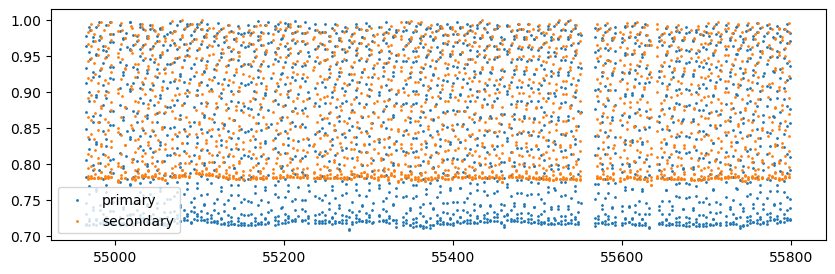

In [26]:
fig = plt.subplots(figsize=(10, 3), sharex=True)
plt.scatter(data_primary.time,data_primary.flux , s = 1, label = 'primary')
if t0_secondary is not None:
    plt.scatter(data_secondary.time,data_secondary.flux , s = 1, label = 'secondary')
plt.legend()

# calculate the number of transits there are within the data 
n_transits = int((max(data_primary.time) - min(data_primary.time)) / period)
n_transits

54965.335642 3.99146 54965.335642


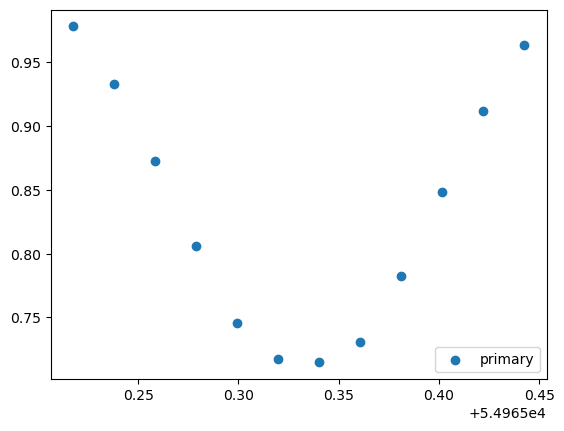

54965.335642 3.99146 54969.327101999996


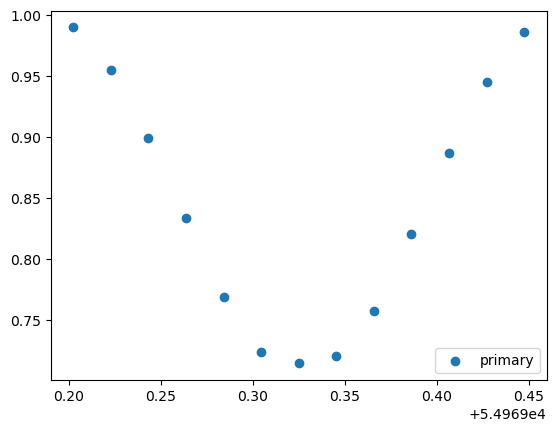

54965.335642 3.99146 54973.318562


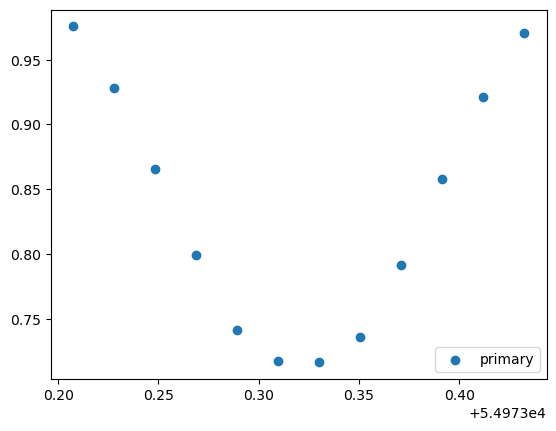

54967.336560897995 3.99146 54967.336560897995


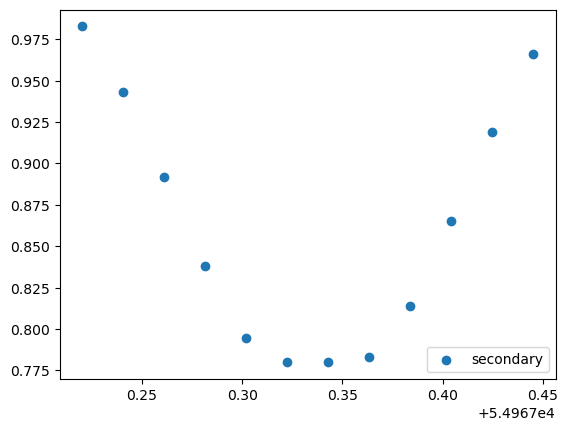

54967.336560897995 3.99146 54971.32802089799


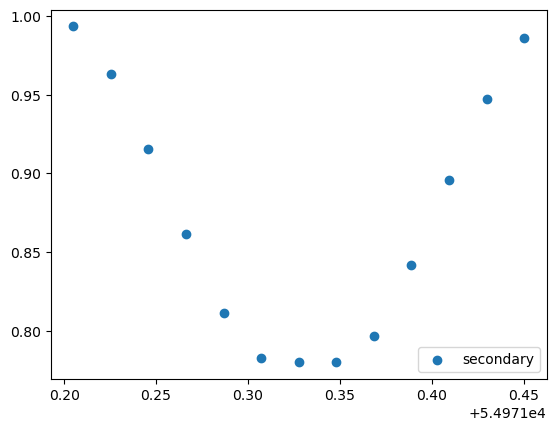

54967.336560897995 3.99146 54975.319480898


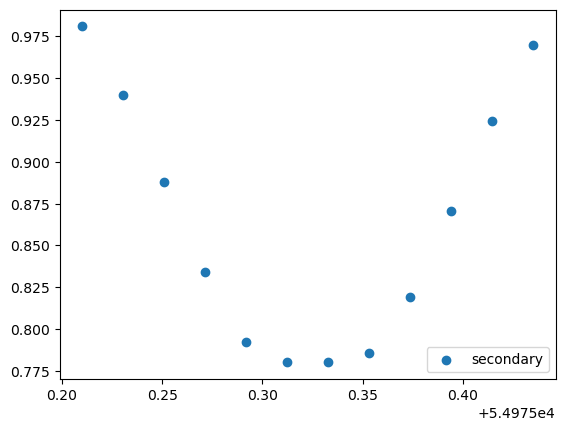

In [27]:
tr_index = range(0,n_transits)

for i in tr_index[0:3]:        
    transit_time = t0_primary+(period*i)
    x = np.array(data_primary.time)
    y = np.array(data_primary.flux) 
    yerr = np.array(data_primary.err)
    
    print (t0_primary, period, transit_time)
    
    mask = (x > (transit_time - (0.2*period))) & (x < (transit_time + (0.2*period))) 
    
    x = np.array(x[mask])
    y = np.array(y[mask]) 
    yerr = np.array(yerr[mask])
    fig, ax = plt.subplots()
    plt.scatter(x,y, label="primary")
    plt.legend(loc="lower right")
    plt.show()
    

if t0_secondary is not None:
    for i in tr_index[0:3]:        
        transit_time = t0_secondary+(period*i)
        x = np.array(data_secondary.time)
        y = np.array(data_secondary.flux) 
        yerr = np.array(data_secondary.err)
        
        print (t0_secondary, period, transit_time)
        
        mask = (x > (transit_time - (0.2*period))) & (x < (transit_time + (0.2*period))) 
        
        x = np.array(x[mask])
        y = np.array(y[mask]) 
        yerr = np.array(yerr[mask])
        fig, ax = plt.subplots()
        plt.scatter(x,y, label="secondary")
        plt.legend(loc="lower right")
        plt.show()

Fitting individual primary eclipses...
Creating new manifest file
54965.335642 1.0072524836970236 -0.29206612180435276 0.17562742655042518


  0%|                                                                    | 0/10000 [00:00<?, ?it/s]C:\pkg\_winNonPortables\miniforge3\envs\my_lk_plus\lib\site-packages\emcee\moves\red_blue.py:99: RuntimeWarning: invalid value encountered in scalar subtract
  lnpdiff = f + nlp - state.log_prob[j]
100%|██████████████████████████████████████████████████████| 10000/10000 [00:07<00:00, 1337.76it/s]


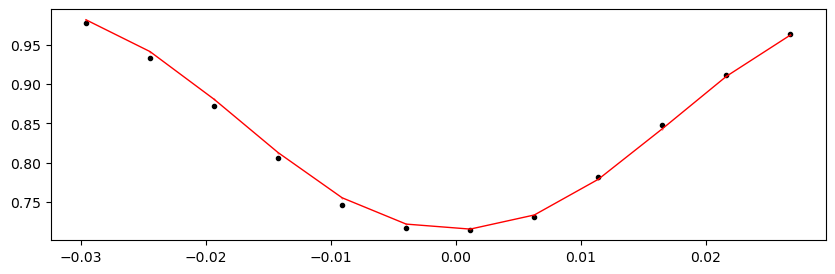

54969.327101999996 1.0072524836970236 -0.29206612180435276 0.17562742655042518


100%|██████████████████████████████████████████████████████| 10000/10000 [00:07<00:00, 1335.54it/s]


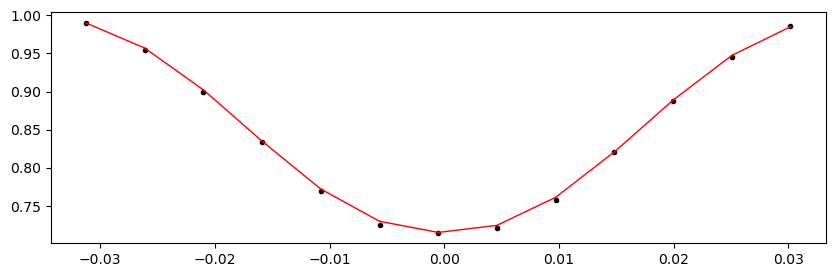

54973.318562 1.0072524836970236 -0.29206612180435276 0.17562742655042518


100%|██████████████████████████████████████████████████████| 10000/10000 [00:07<00:00, 1262.44it/s]


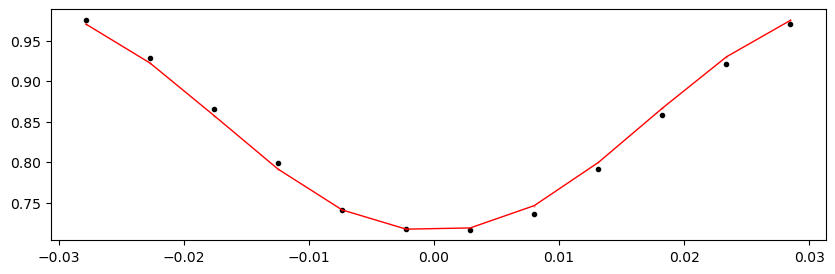

54977.310022 1.0072524836970236 -0.29206612180435276 0.17562742655042518


100%|██████████████████████████████████████████████████████| 10000/10000 [00:07<00:00, 1283.08it/s]


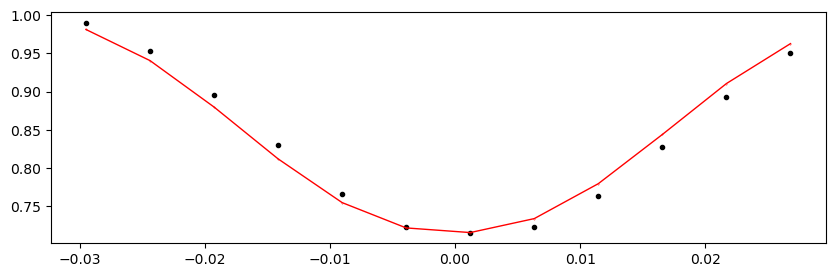

54981.301481999995 1.0072524836970236 -0.29206612180435276 0.17562742655042518


100%|██████████████████████████████████████████████████████| 10000/10000 [00:07<00:00, 1319.87it/s]


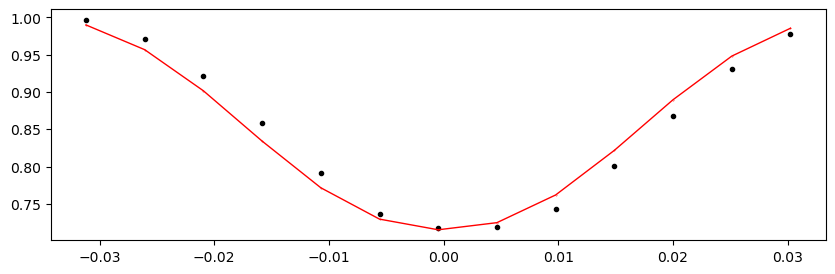

54985.292942 1.0072524836970236 -0.29206612180435276 0.17562742655042518


100%|██████████████████████████████████████████████████████| 10000/10000 [00:07<00:00, 1330.96it/s]


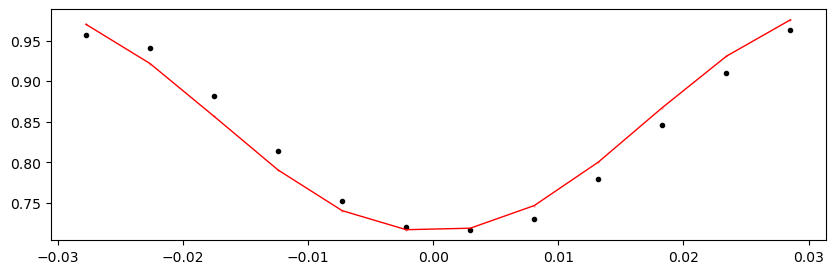

54989.284402 1.0072524836970236 -0.29206612180435276 0.17562742655042518


100%|██████████████████████████████████████████████████████| 10000/10000 [00:07<00:00, 1301.26it/s]


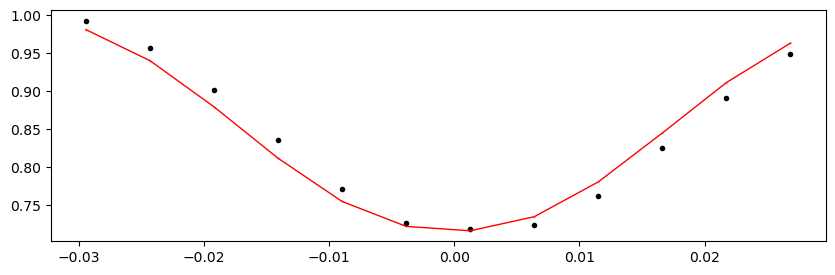

54993.275861999995 1.0072524836970236 -0.29206612180435276 0.17562742655042518


100%|██████████████████████████████████████████████████████| 10000/10000 [00:07<00:00, 1287.22it/s]


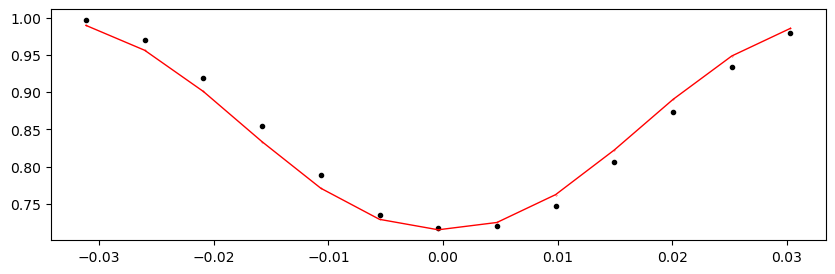

54997.267322 1.0072524836970236 -0.29206612180435276 0.17562742655042518


100%|██████████████████████████████████████████████████████| 10000/10000 [00:07<00:00, 1270.66it/s]


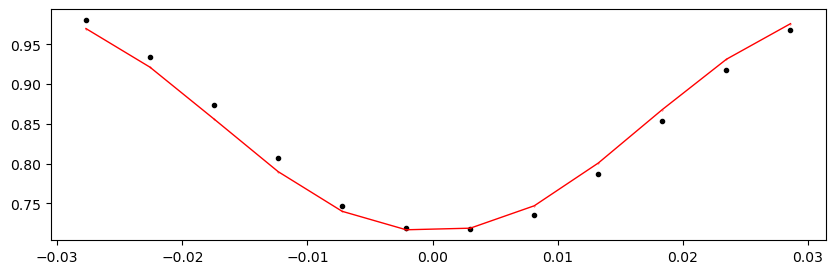

55005.250241999995 1.0072524836970236 -0.29206612180435276 0.17562742655042518


100%|██████████████████████████████████████████████████████| 10000/10000 [00:07<00:00, 1313.51it/s]


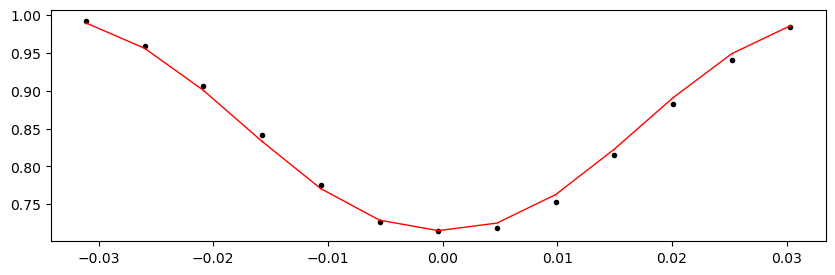

55009.241702 1.0072524836970236 -0.29206612180435276 0.17562742655042518


100%|██████████████████████████████████████████████████████| 10000/10000 [00:07<00:00, 1296.99it/s]


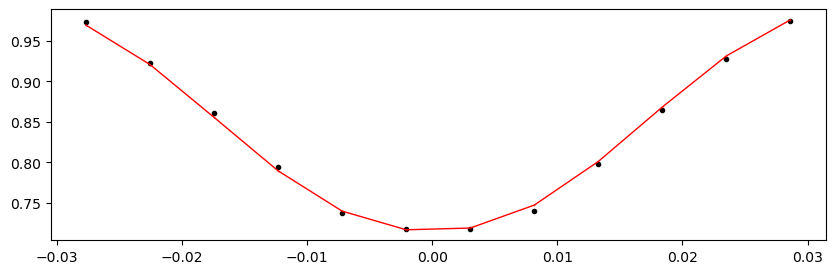

55013.233162 1.0072524836970236 -0.29206612180435276 0.17562742655042518


100%|██████████████████████████████████████████████████████| 10000/10000 [00:07<00:00, 1322.73it/s]


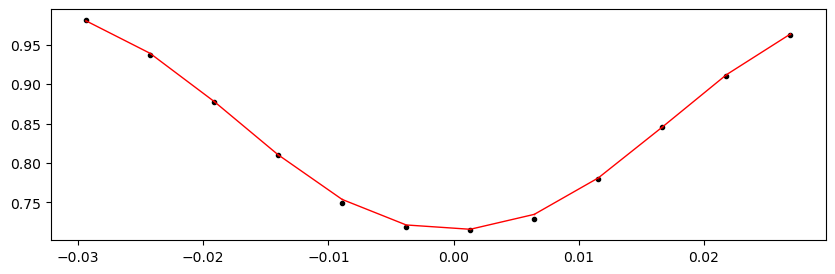

55017.224622 1.0072524836970236 -0.29206612180435276 0.17562742655042518


100%|██████████████████████████████████████████████████████| 10000/10000 [00:07<00:00, 1309.68it/s]


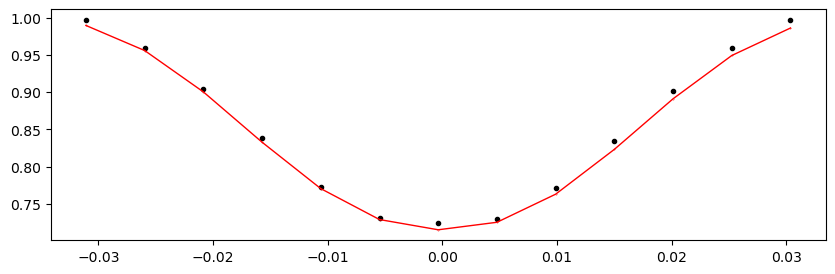

55021.216082 1.0072524836970236 -0.29206612180435276 0.17562742655042518


100%|██████████████████████████████████████████████████████| 10000/10000 [00:07<00:00, 1280.44it/s]


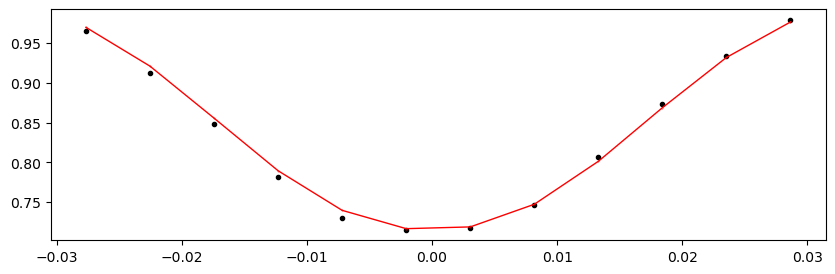

55025.207542 1.0072524836970236 -0.29206612180435276 0.17562742655042518


100%|██████████████████████████████████████████████████████| 10000/10000 [00:07<00:00, 1310.64it/s]


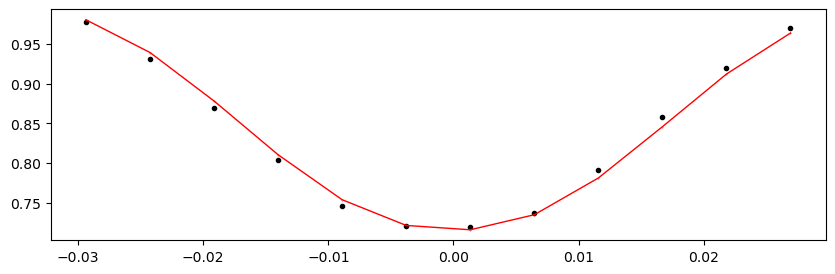

55029.199002 1.0072524836970236 -0.29206612180435276 0.17562742655042518


100%|██████████████████████████████████████████████████████| 10000/10000 [00:07<00:00, 1294.50it/s]


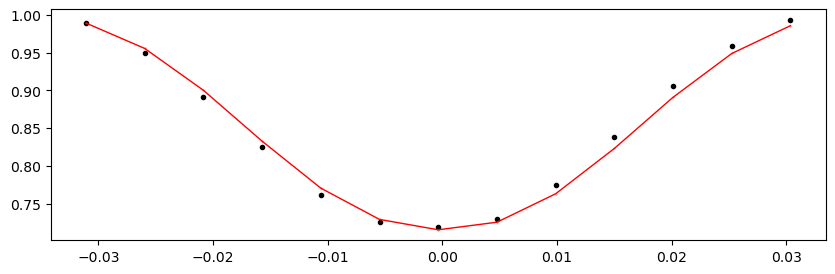

55033.190462 1.0072524836970236 -0.29206612180435276 0.17562742655042518


100%|██████████████████████████████████████████████████████| 10000/10000 [00:07<00:00, 1298.80it/s]


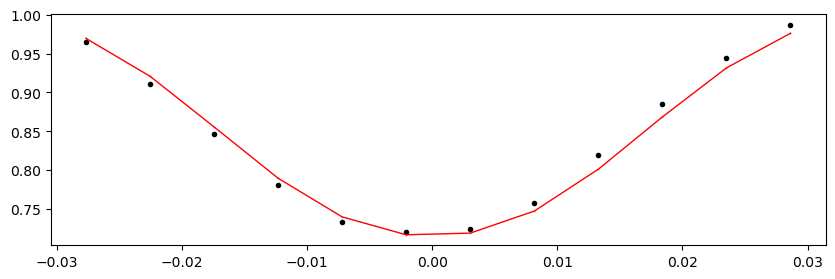

55037.181921999996 1.0072524836970236 -0.29206612180435276 0.17562742655042518


100%|██████████████████████████████████████████████████████| 10000/10000 [00:07<00:00, 1323.04it/s]


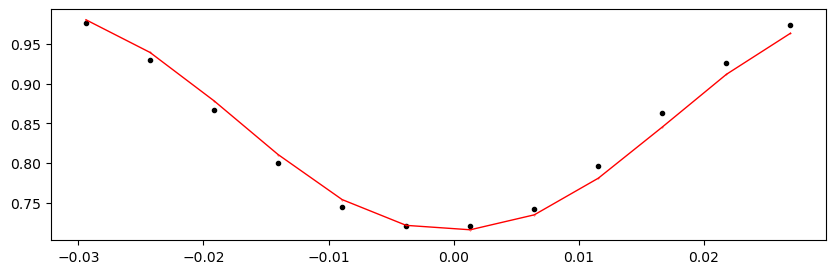

55041.173382 1.0072524836970236 -0.29206612180435276 0.17562742655042518


100%|██████████████████████████████████████████████████████| 10000/10000 [00:07<00:00, 1296.59it/s]


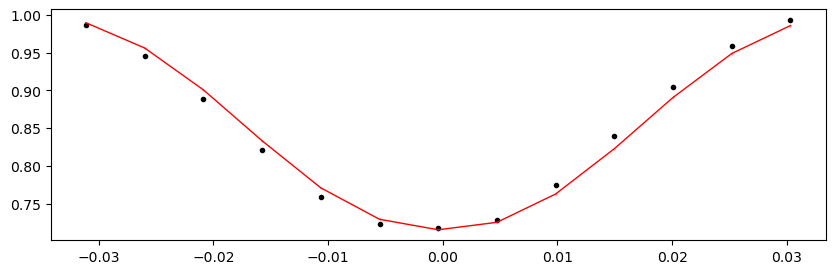

55045.164842 1.0072524836970236 -0.29206612180435276 0.17562742655042518


100%|██████████████████████████████████████████████████████| 10000/10000 [00:07<00:00, 1314.91it/s]


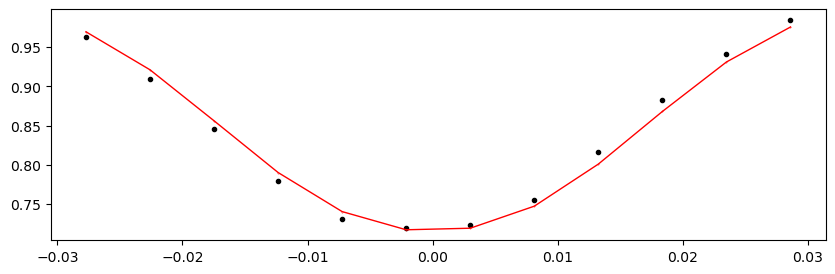

55049.156301999996 1.0072524836970236 -0.29206612180435276 0.17562742655042518


100%|██████████████████████████████████████████████████████| 10000/10000 [00:07<00:00, 1333.81it/s]


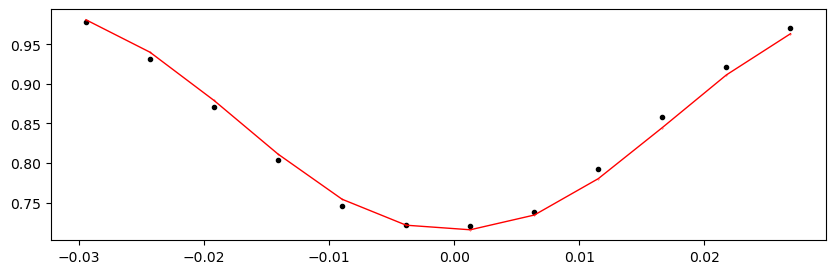

55053.147762 1.0072524836970236 -0.29206612180435276 0.17562742655042518


100%|██████████████████████████████████████████████████████| 10000/10000 [00:07<00:00, 1280.40it/s]


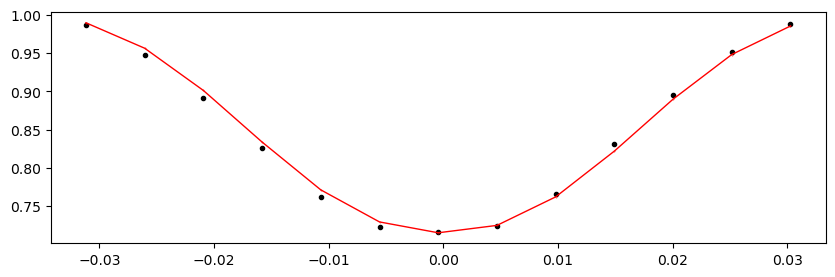

55057.139222 1.0072524836970236 -0.29206612180435276 0.17562742655042518


100%|██████████████████████████████████████████████████████| 10000/10000 [00:07<00:00, 1350.59it/s]


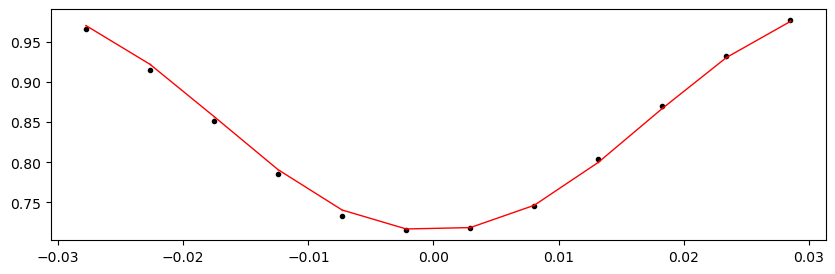

55061.130681999995 1.0072524836970236 -0.29206612180435276 0.17562742655042518


100%|██████████████████████████████████████████████████████| 10000/10000 [00:07<00:00, 1333.55it/s]


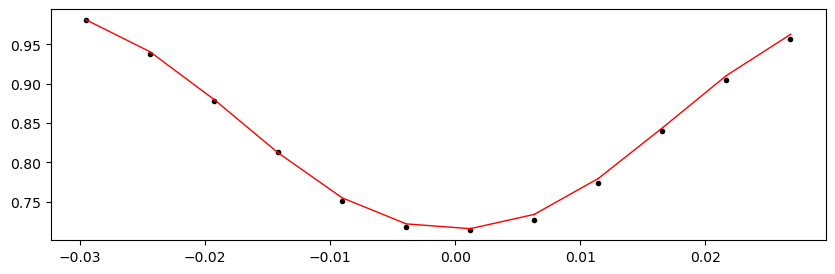

55065.122142 1.0072524836970236 -0.29206612180435276 0.17562742655042518


100%|██████████████████████████████████████████████████████| 10000/10000 [00:07<00:00, 1319.23it/s]


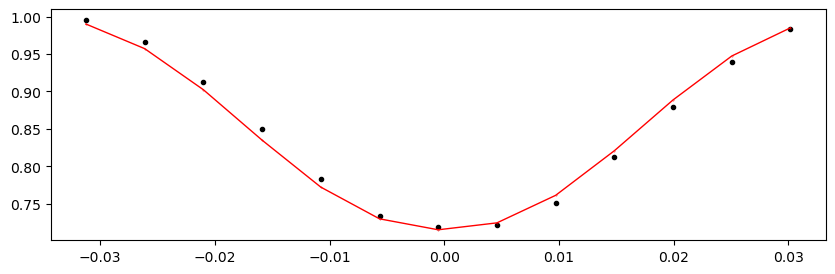

55069.113602 1.0072524836970236 -0.29206612180435276 0.17562742655042518


100%|██████████████████████████████████████████████████████| 10000/10000 [00:07<00:00, 1353.14it/s]


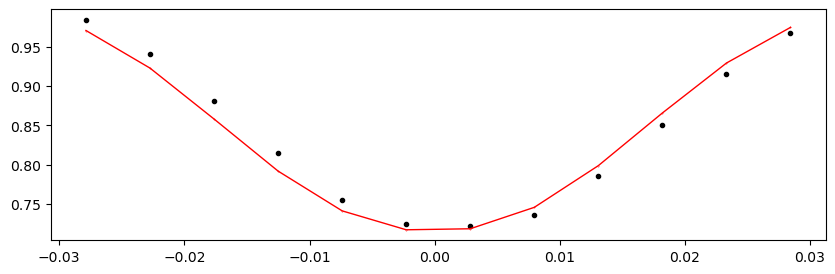

55073.105061999995 1.0072524836970236 -0.29206612180435276 0.17562742655042518


100%|██████████████████████████████████████████████████████| 10000/10000 [00:07<00:00, 1364.29it/s]


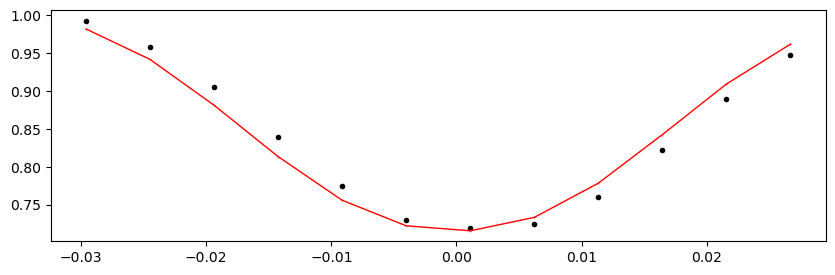

55077.096522 1.0072524836970236 -0.29206612180435276 0.17562742655042518


100%|██████████████████████████████████████████████████████| 10000/10000 [00:07<00:00, 1341.43it/s]


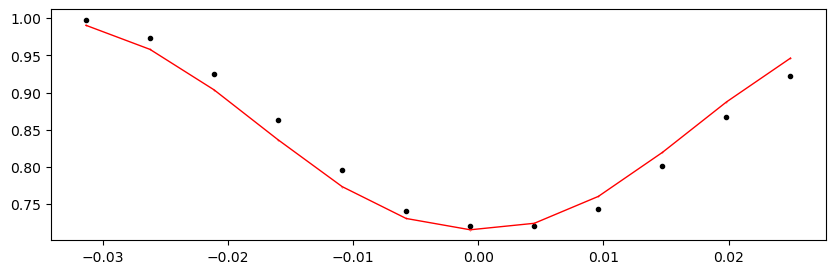

55081.087982 1.0072524836970236 -0.29206612180435276 0.17562742655042518


100%|██████████████████████████████████████████████████████| 10000/10000 [00:07<00:00, 1305.49it/s]


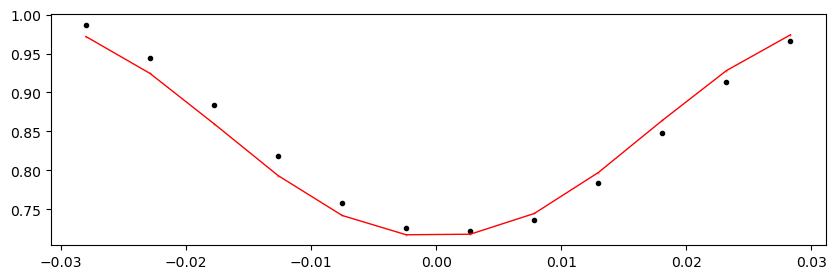

55085.079441999995 1.0072524836970236 -0.29206612180435276 0.17562742655042518


100%|██████████████████████████████████████████████████████| 10000/10000 [00:07<00:00, 1323.90it/s]


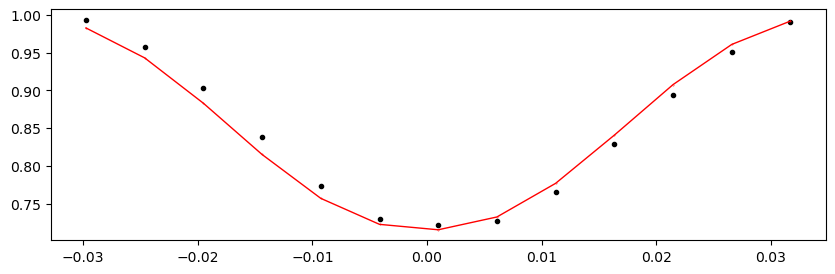

55089.070902 1.0072524836970236 -0.29206612180435276 0.17562742655042518


100%|██████████████████████████████████████████████████████| 10000/10000 [00:07<00:00, 1319.58it/s]


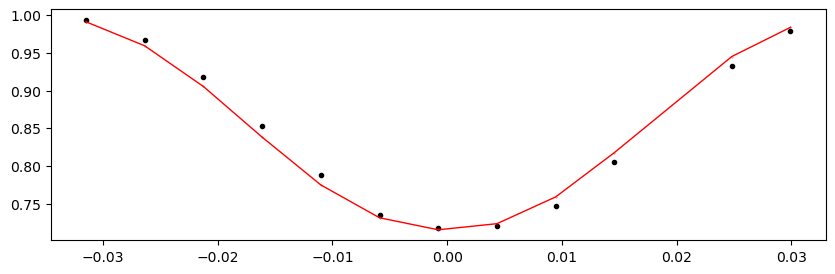

55093.062362 1.0072524836970236 -0.29206612180435276 0.17562742655042518


100%|██████████████████████████████████████████████████████| 10000/10000 [00:07<00:00, 1315.79it/s]


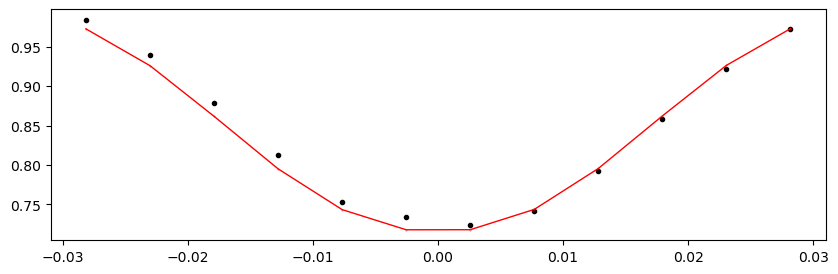

55097.053822 1.0072524836970236 -0.29206612180435276 0.17562742655042518


100%|██████████████████████████████████████████████████████| 10000/10000 [00:07<00:00, 1292.00it/s]


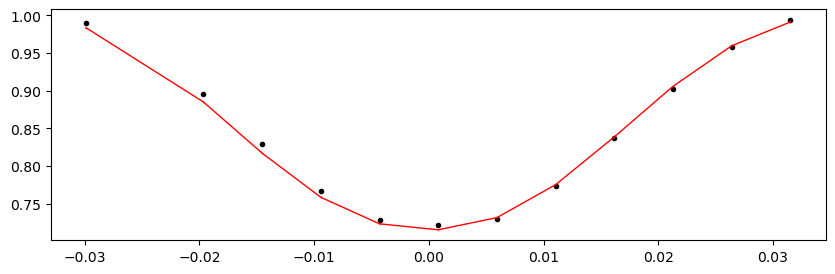

55101.045282 1.0072524836970236 -0.29206612180435276 0.17562742655042518


100%|██████████████████████████████████████████████████████| 10000/10000 [00:07<00:00, 1305.21it/s]


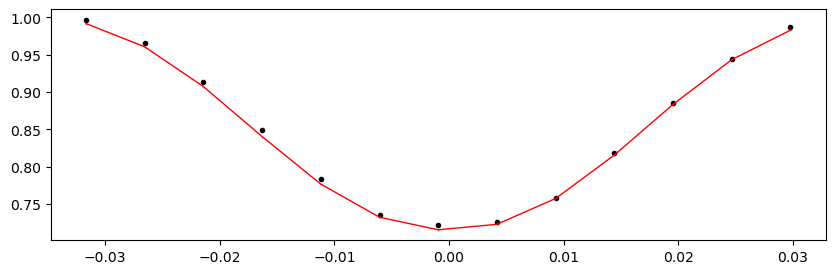

55105.036742 1.0072524836970236 -0.29206612180435276 0.17562742655042518


100%|██████████████████████████████████████████████████████| 10000/10000 [00:07<00:00, 1338.52it/s]


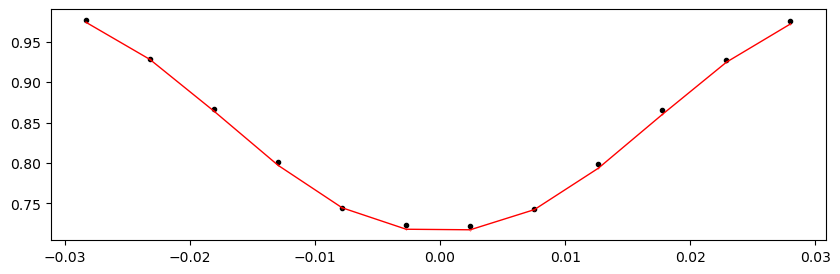

55109.028202 1.0072524836970236 -0.29206612180435276 0.17562742655042518


100%|██████████████████████████████████████████████████████| 10000/10000 [00:07<00:00, 1344.05it/s]


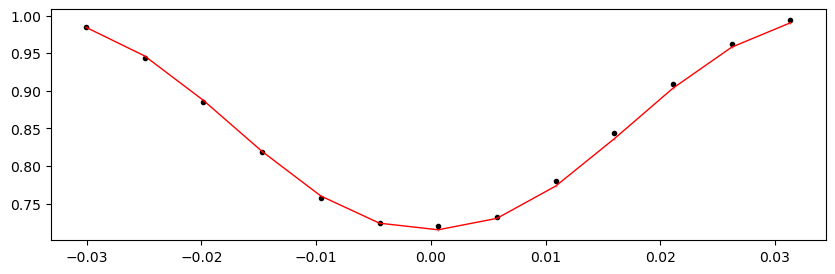

Time 55113.019662 does not have enough data points: 6
55117.011121999996 1.0072524836970236 -0.29206612180435276 0.17562742655042518


100%|██████████████████████████████████████████████████████| 10000/10000 [00:07<00:00, 1353.14it/s]


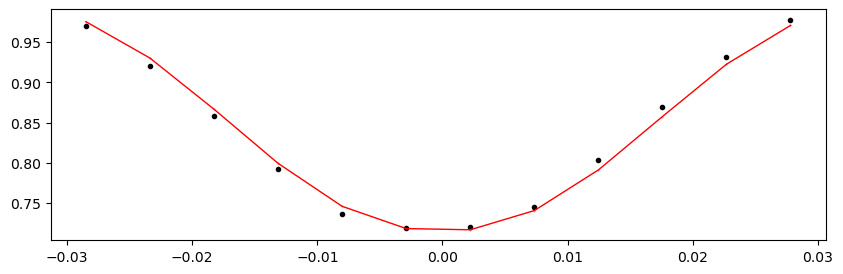

55121.002582 1.0072524836970236 -0.29206612180435276 0.17562742655042518


100%|██████████████████████████████████████████████████████| 10000/10000 [00:07<00:00, 1356.54it/s]


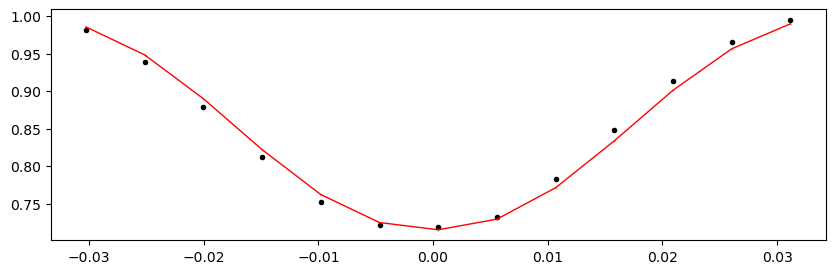

55124.994042 1.0072524836970236 -0.29206612180435276 0.17562742655042518


100%|██████████████████████████████████████████████████████| 10000/10000 [00:07<00:00, 1352.80it/s]


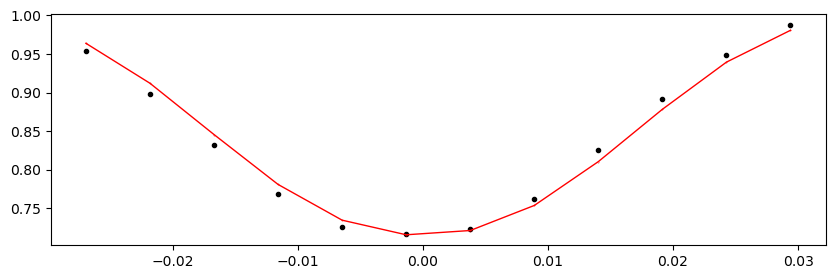

55128.985501999996 1.0072524836970236 -0.29206612180435276 0.17562742655042518


100%|██████████████████████████████████████████████████████| 10000/10000 [00:07<00:00, 1360.84it/s]


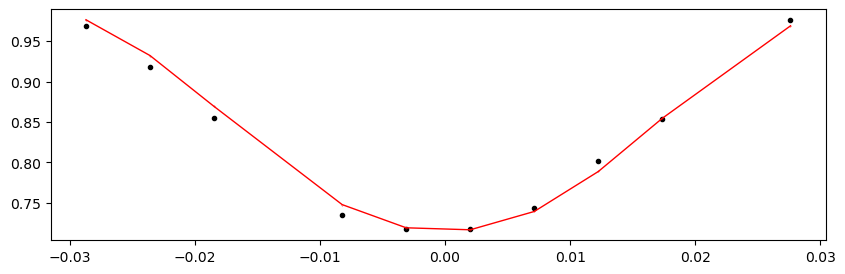

55132.976962 1.0072524836970236 -0.29206612180435276 0.17562742655042518


100%|██████████████████████████████████████████████████████| 10000/10000 [00:07<00:00, 1346.84it/s]


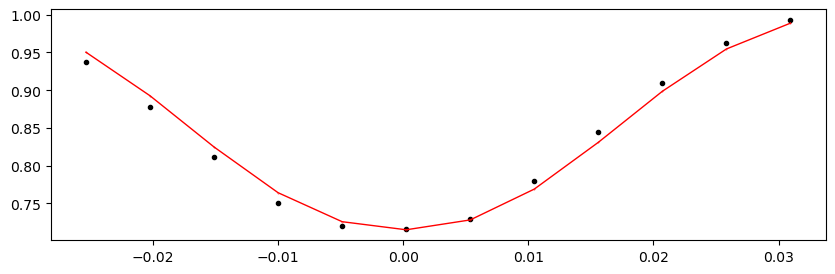

55136.968422 1.0072524836970236 -0.29206612180435276 0.17562742655042518


100%|██████████████████████████████████████████████████████| 10000/10000 [00:07<00:00, 1317.49it/s]


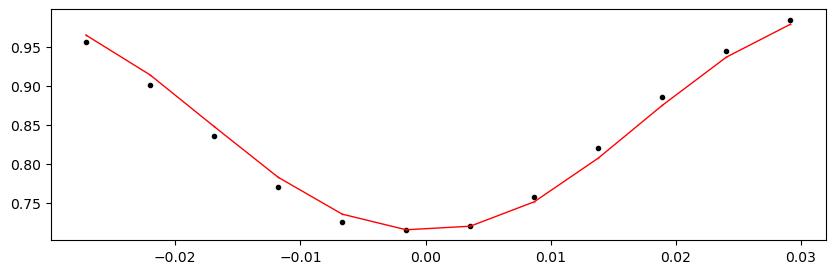

55140.959881999996 1.0072524836970236 -0.29206612180435276 0.17562742655042518


100%|██████████████████████████████████████████████████████| 10000/10000 [00:07<00:00, 1280.45it/s]


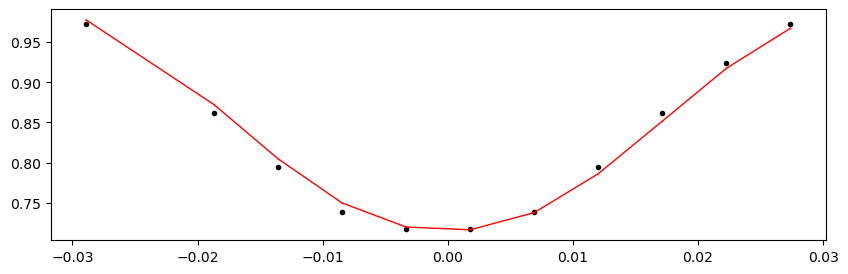

55144.951342 1.0072524836970236 -0.29206612180435276 0.17562742655042518


100%|██████████████████████████████████████████████████████| 10000/10000 [00:07<00:00, 1287.80it/s]


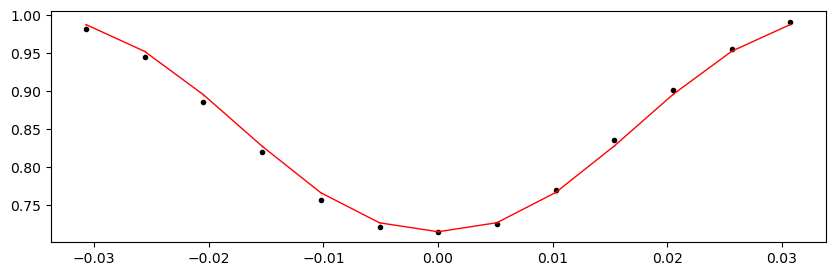

55148.942802 1.0072524836970236 -0.29206612180435276 0.17562742655042518


100%|██████████████████████████████████████████████████████| 10000/10000 [00:07<00:00, 1282.05it/s]


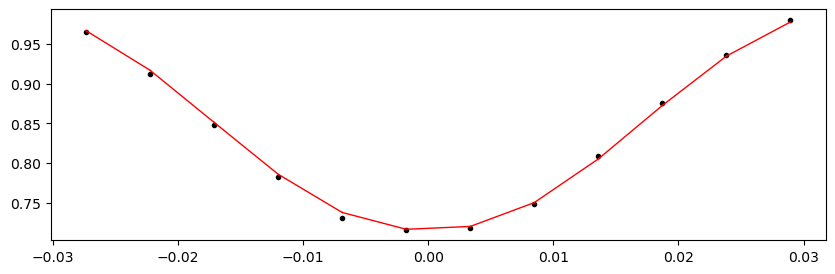

55152.934261999995 1.0072524836970236 -0.29206612180435276 0.17562742655042518


100%|██████████████████████████████████████████████████████| 10000/10000 [00:07<00:00, 1309.74it/s]


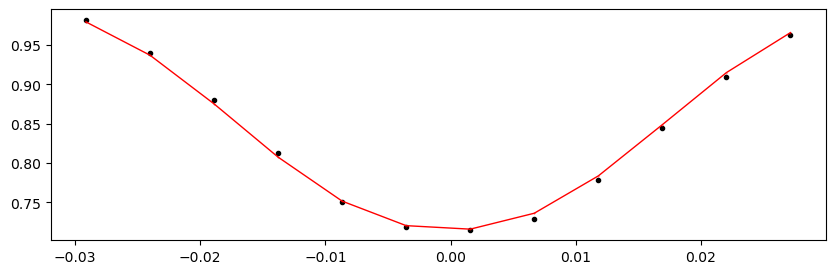

55156.925722 1.0072524836970236 -0.29206612180435276 0.17562742655042518


100%|██████████████████████████████████████████████████████| 10000/10000 [00:07<00:00, 1325.66it/s]


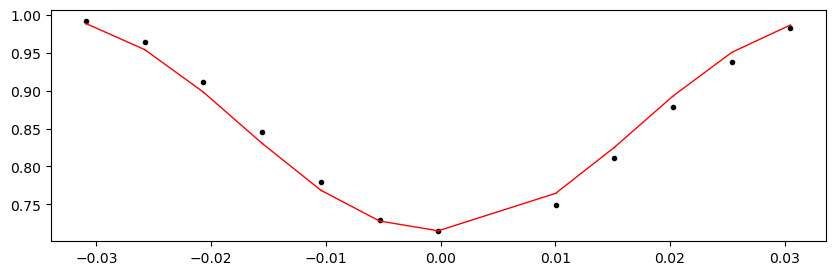

55160.917182 1.0072524836970236 -0.29206612180435276 0.17562742655042518


100%|██████████████████████████████████████████████████████| 10000/10000 [00:07<00:00, 1308.15it/s]


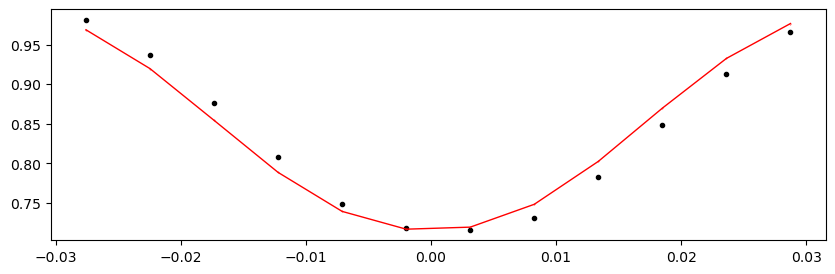

55164.908641999995 1.0072524836970236 -0.29206612180435276 0.17562742655042518


100%|██████████████████████████████████████████████████████| 10000/10000 [00:07<00:00, 1312.36it/s]


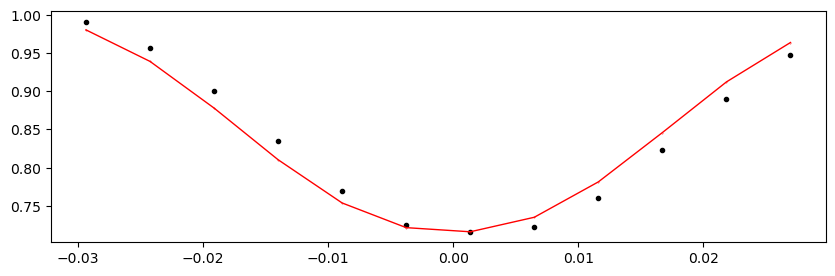

55168.900102 1.0072524836970236 -0.29206612180435276 0.17562742655042518


100%|██████████████████████████████████████████████████████| 10000/10000 [00:07<00:00, 1293.67it/s]


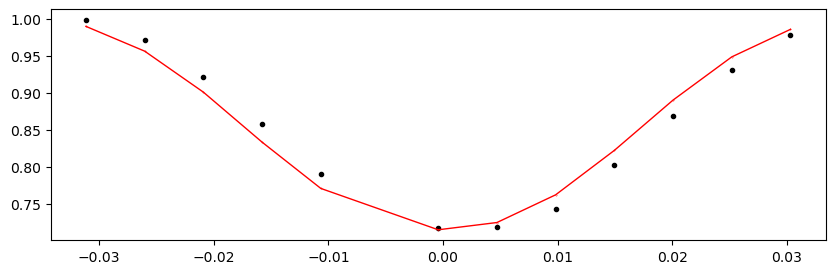

55172.891562 1.0072524836970236 -0.29206612180435276 0.17562742655042518


100%|██████████████████████████████████████████████████████| 10000/10000 [00:07<00:00, 1304.60it/s]


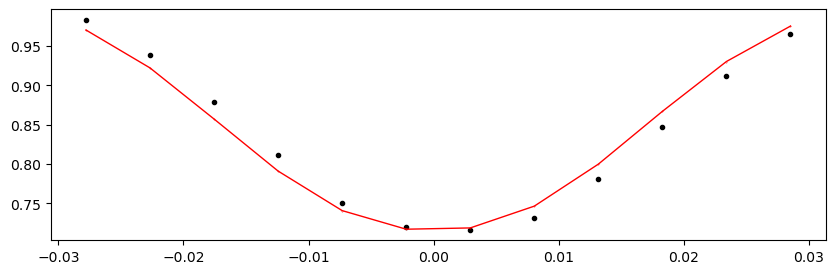

55176.883022 1.0072524836970236 -0.29206612180435276 0.17562742655042518


100%|██████████████████████████████████████████████████████| 10000/10000 [00:07<00:00, 1363.16it/s]


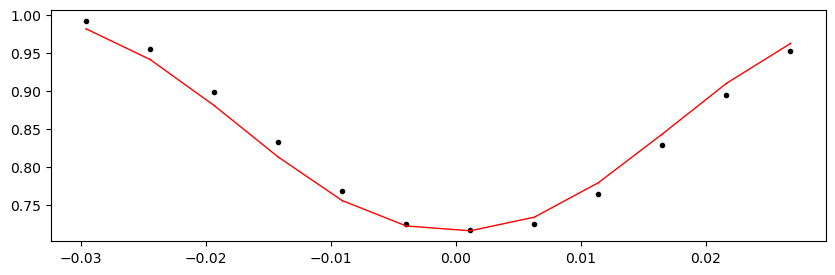

55180.874482 1.0072524836970236 -0.29206612180435276 0.17562742655042518


100%|██████████████████████████████████████████████████████| 10000/10000 [00:07<00:00, 1347.82it/s]


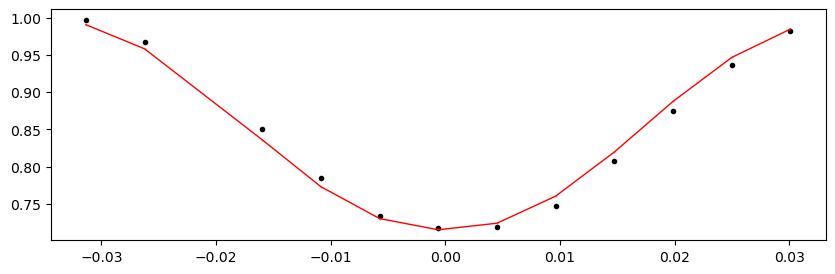

Time 55184.865942 does not have enough data points: 4
55188.857402 1.0072524836970236 -0.29206612180435276 0.17562742655042518


100%|██████████████████████████████████████████████████████| 10000/10000 [00:07<00:00, 1335.27it/s]


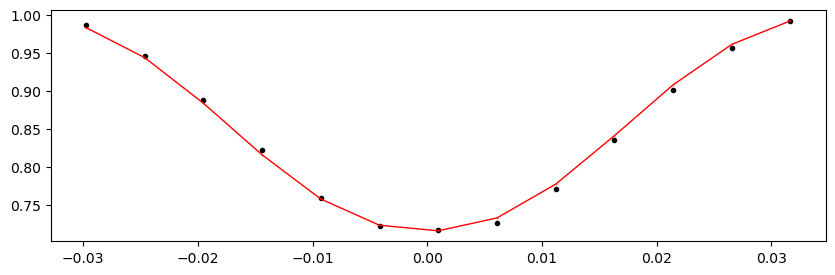

55192.848862 1.0072524836970236 -0.29206612180435276 0.17562742655042518


100%|██████████████████████████████████████████████████████| 10000/10000 [00:07<00:00, 1320.41it/s]


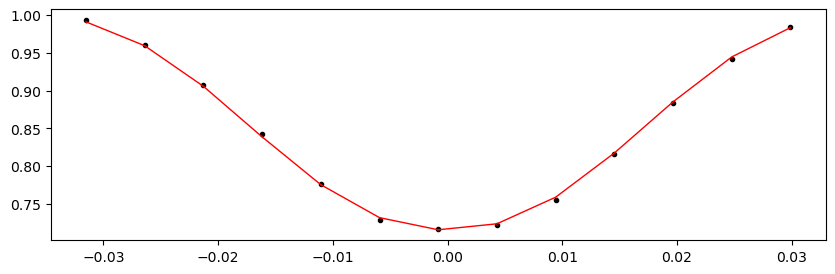

55196.840322 1.0072524836970236 -0.29206612180435276 0.17562742655042518


100%|██████████████████████████████████████████████████████| 10000/10000 [00:07<00:00, 1313.24it/s]


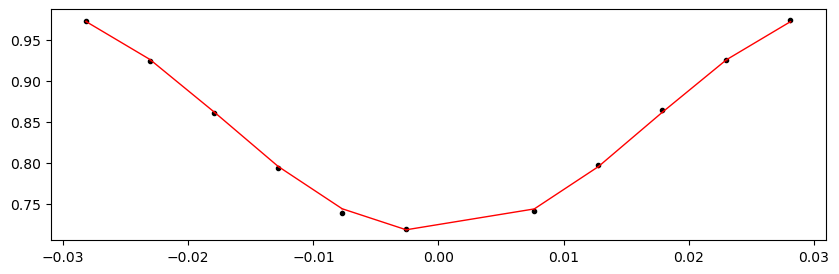

55200.831782 1.0072524836970236 -0.29206612180435276 0.17562742655042518


100%|██████████████████████████████████████████████████████| 10000/10000 [00:07<00:00, 1303.22it/s]


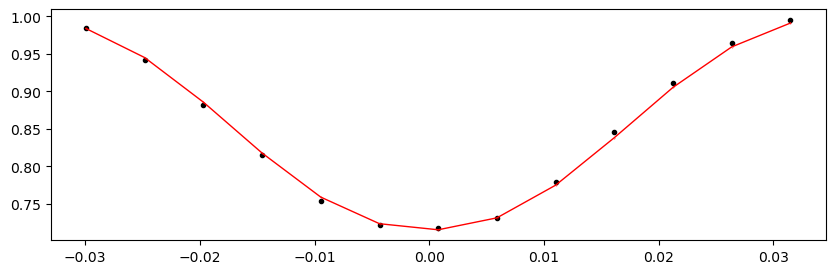

55204.823242 1.0072524836970236 -0.29206612180435276 0.17562742655042518


100%|██████████████████████████████████████████████████████| 10000/10000 [00:07<00:00, 1326.42it/s]


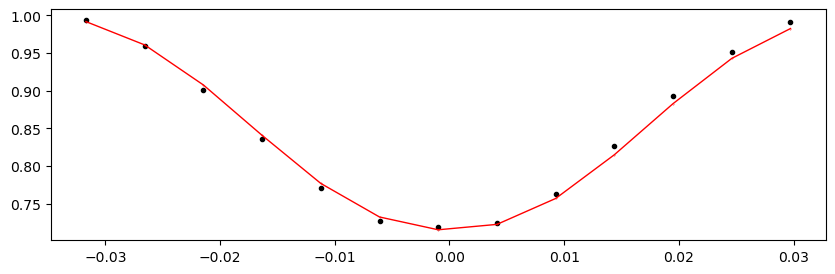

55208.814701999996 1.0072524836970236 -0.29206612180435276 0.17562742655042518


100%|██████████████████████████████████████████████████████| 10000/10000 [00:07<00:00, 1314.07it/s]


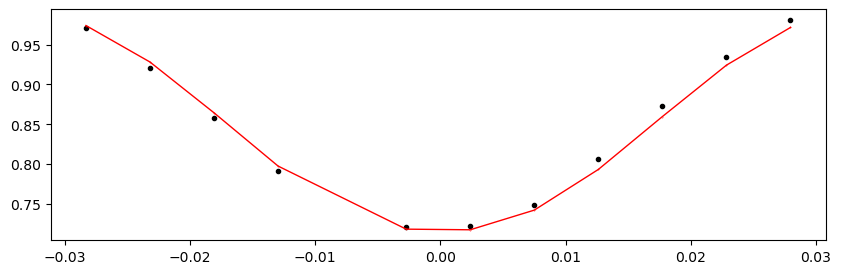

55212.806162 1.0072524836970236 -0.29206612180435276 0.17562742655042518


100%|██████████████████████████████████████████████████████| 10000/10000 [00:07<00:00, 1322.78it/s]


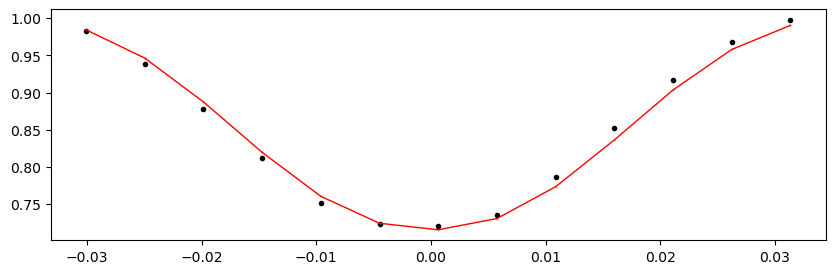

Time 55216.797622 does not have enough data points: 6
55220.789081999996 1.0072524836970236 -0.29206612180435276 0.17562742655042518


100%|██████████████████████████████████████████████████████| 10000/10000 [00:07<00:00, 1324.51it/s]


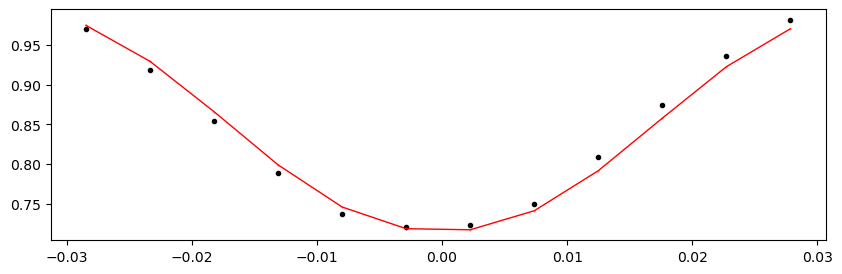

55224.780542 1.0072524836970236 -0.29206612180435276 0.17562742655042518


100%|██████████████████████████████████████████████████████| 10000/10000 [00:07<00:00, 1331.48it/s]


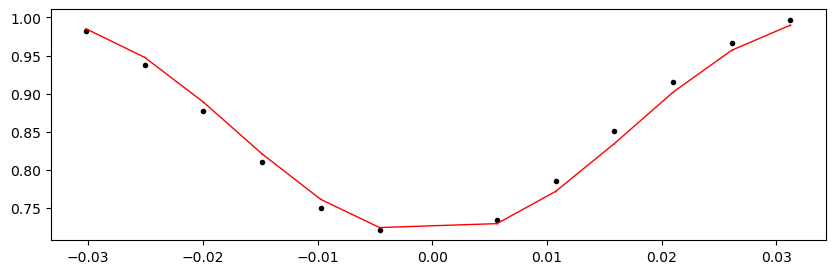

55228.772002 1.0072524836970236 -0.29206612180435276 0.17562742655042518


100%|██████████████████████████████████████████████████████| 10000/10000 [00:07<00:00, 1307.19it/s]


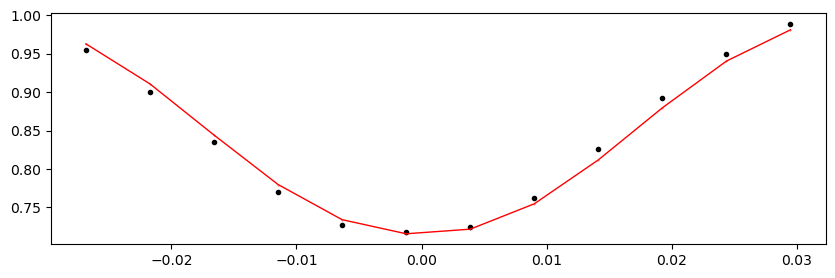

55236.754922 1.0072524836970236 -0.29206612180435276 0.17562742655042518


100%|██████████████████████████████████████████████████████| 10000/10000 [00:07<00:00, 1292.06it/s]


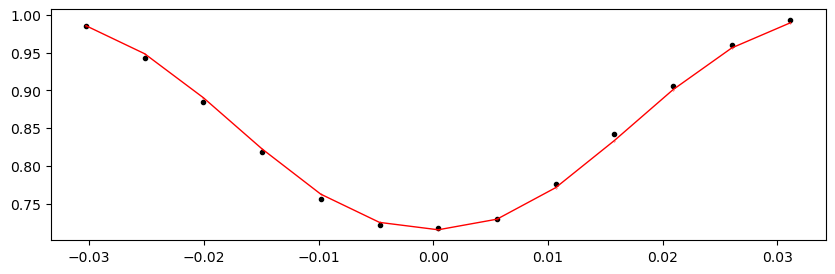

55240.746382 1.0072524836970236 -0.29206612180435276 0.17562742655042518


100%|██████████████████████████████████████████████████████| 10000/10000 [00:07<00:00, 1356.60it/s]


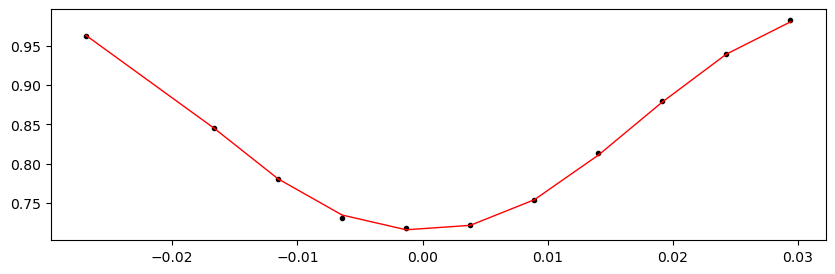

55244.737841999995 1.0072524836970236 -0.29206612180435276 0.17562742655042518


100%|██████████████████████████████████████████████████████| 10000/10000 [00:07<00:00, 1336.17it/s]


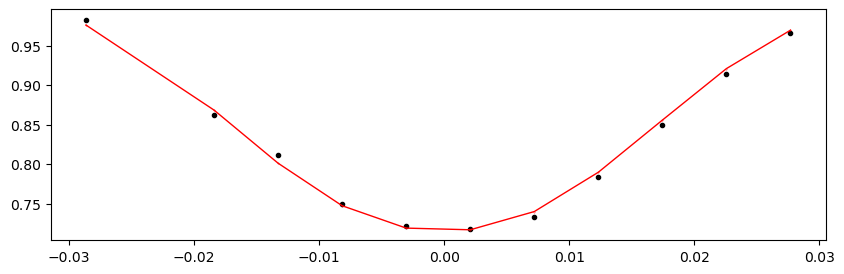

55248.729302 1.0072524836970236 -0.29206612180435276 0.17562742655042518


100%|██████████████████████████████████████████████████████| 10000/10000 [00:07<00:00, 1317.58it/s]


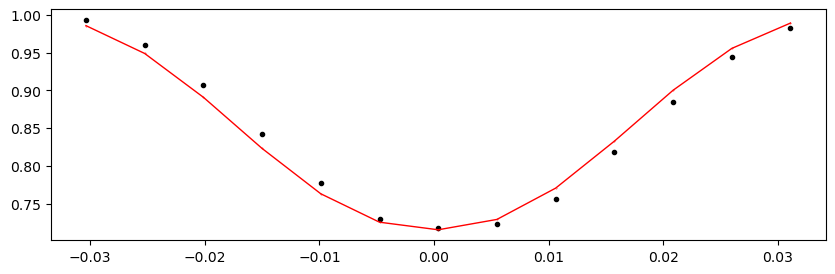

55252.720762 1.0072524836970236 -0.29206612180435276 0.17562742655042518


100%|██████████████████████████████████████████████████████| 10000/10000 [00:07<00:00, 1317.58it/s]


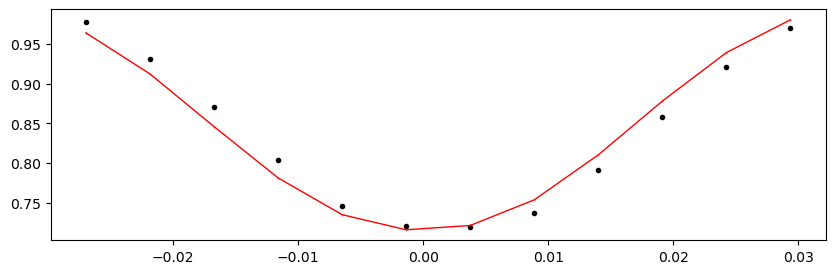

55256.712221999995 1.0072524836970236 -0.29206612180435276 0.17562742655042518


100%|██████████████████████████████████████████████████████| 10000/10000 [00:07<00:00, 1344.03it/s]


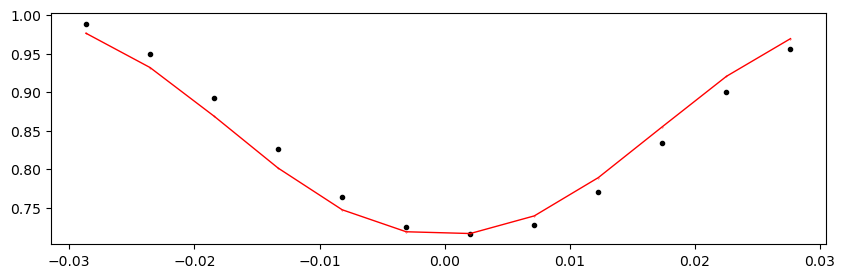

55260.703682 1.0072524836970236 -0.29206612180435276 0.17562742655042518


100%|██████████████████████████████████████████████████████| 10000/10000 [00:07<00:00, 1328.21it/s]


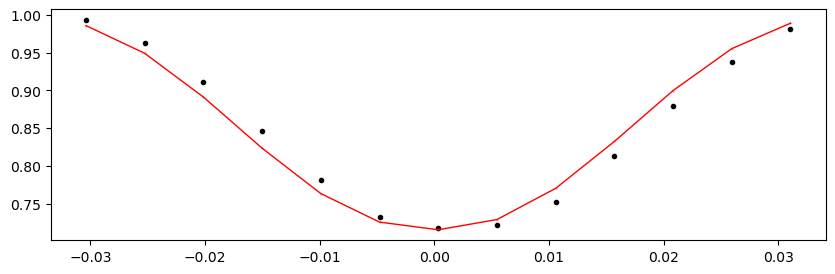

55264.695142 1.0072524836970236 -0.29206612180435276 0.17562742655042518


100%|██████████████████████████████████████████████████████| 10000/10000 [00:07<00:00, 1315.73it/s]


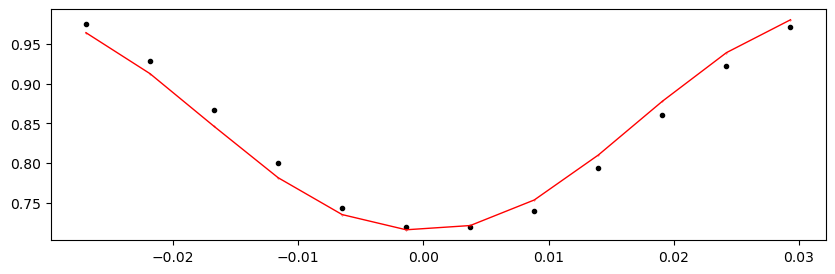

55268.686602 1.0072524836970236 -0.29206612180435276 0.17562742655042518


100%|██████████████████████████████████████████████████████| 10000/10000 [00:07<00:00, 1321.75it/s]


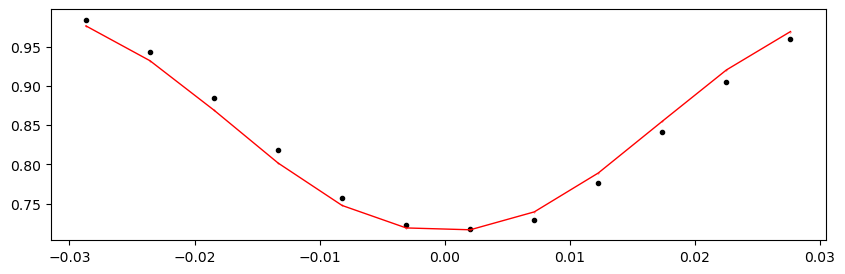

55272.678062 1.0072524836970236 -0.29206612180435276 0.17562742655042518


100%|██████████████████████████████████████████████████████| 10000/10000 [00:07<00:00, 1320.95it/s]


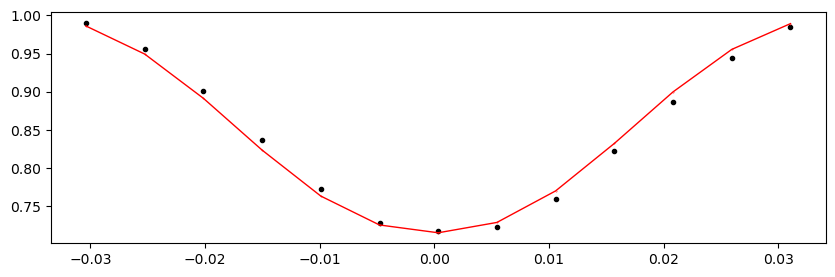

55276.669522 1.0072524836970236 -0.29206612180435276 0.17562742655042518


100%|██████████████████████████████████████████████████████| 10000/10000 [00:07<00:00, 1303.82it/s]


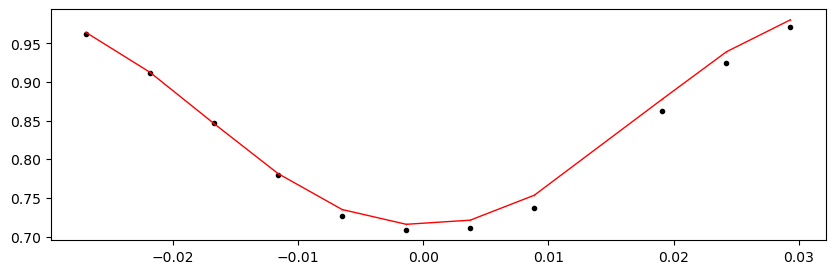

55280.660982 1.0072524836970236 -0.29206612180435276 0.17562742655042518


100%|██████████████████████████████████████████████████████| 10000/10000 [00:07<00:00, 1299.85it/s]


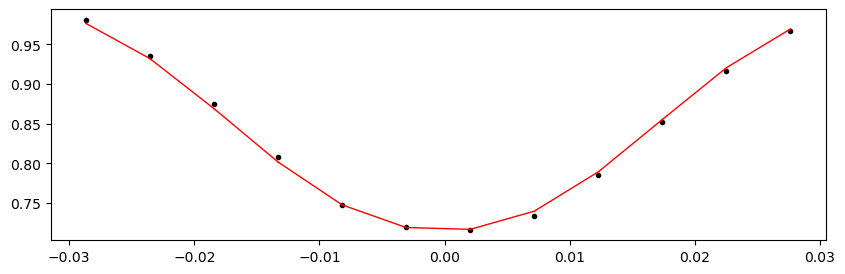

55284.652442 1.0072524836970236 -0.29206612180435276 0.17562742655042518


100%|██████████████████████████████████████████████████████| 10000/10000 [00:07<00:00, 1308.85it/s]


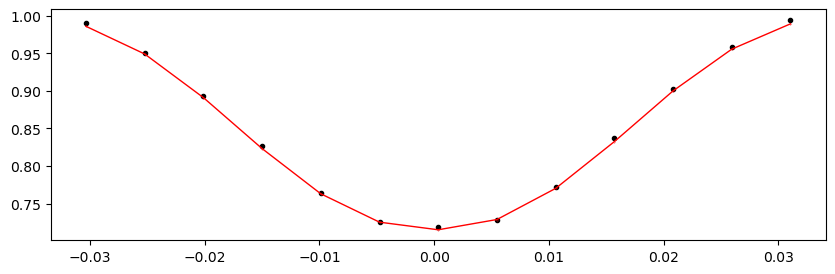

55288.643901999996 1.0072524836970236 -0.29206612180435276 0.17562742655042518


100%|██████████████████████████████████████████████████████| 10000/10000 [00:07<00:00, 1312.34it/s]


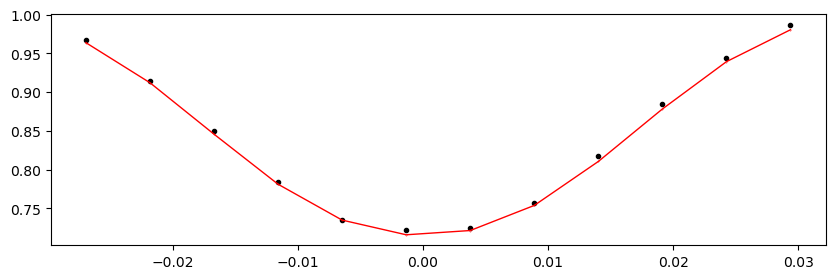

55292.635362 1.0072524836970236 -0.29206612180435276 0.17562742655042518


100%|██████████████████████████████████████████████████████| 10000/10000 [00:07<00:00, 1322.78it/s]


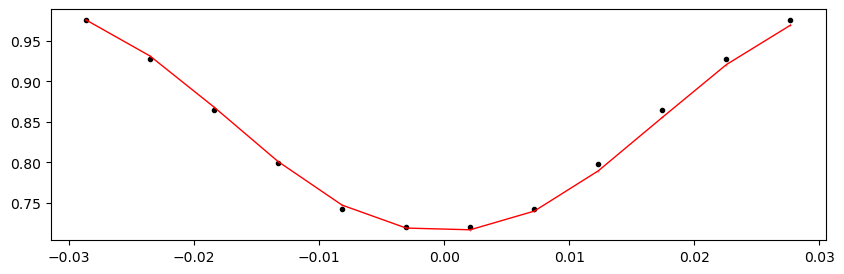

55296.626822 1.0072524836970236 -0.29206612180435276 0.17562742655042518


100%|██████████████████████████████████████████████████████| 10000/10000 [00:07<00:00, 1358.71it/s]


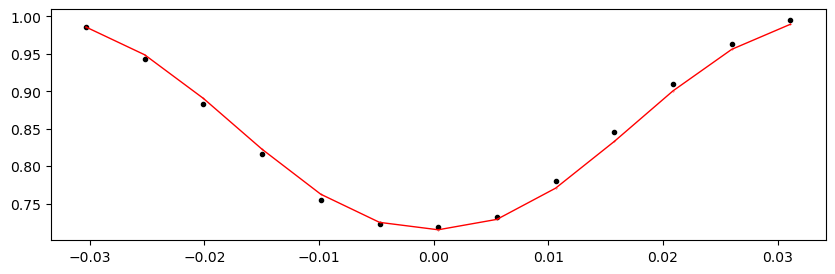

55300.618281999996 1.0072524836970236 -0.29206612180435276 0.17562742655042518


100%|██████████████████████████████████████████████████████| 10000/10000 [00:07<00:00, 1354.77it/s]


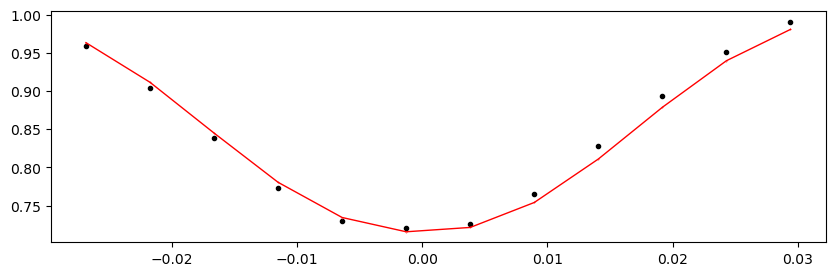

55304.609742 1.0072524836970236 -0.29206612180435276 0.17562742655042518


100%|██████████████████████████████████████████████████████| 10000/10000 [00:07<00:00, 1296.99it/s]


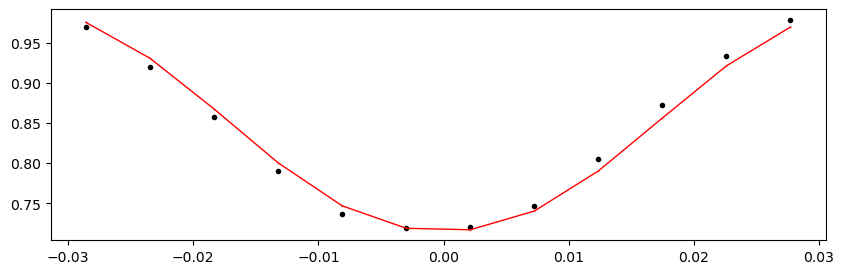

55312.592661999995 1.0072524836970236 -0.29206612180435276 0.17562742655042518


100%|██████████████████████████████████████████████████████| 10000/10000 [00:07<00:00, 1303.76it/s]


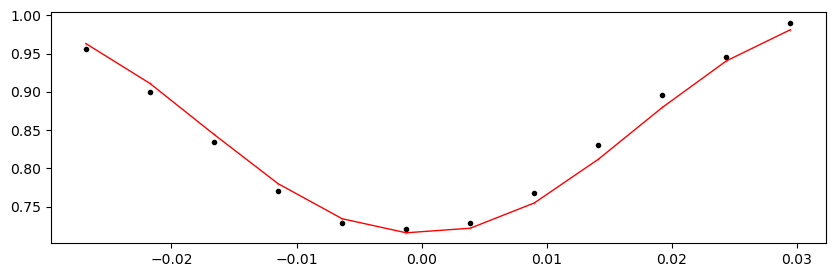

55316.584122 1.0072524836970236 -0.29206612180435276 0.17562742655042518


100%|██████████████████████████████████████████████████████| 10000/10000 [00:07<00:00, 1326.30it/s]


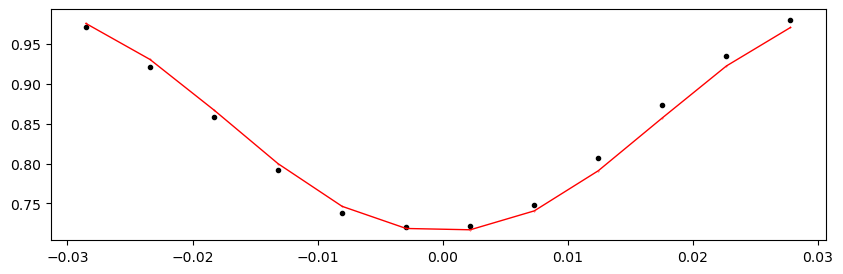

55320.575582 1.0072524836970236 -0.29206612180435276 0.17562742655042518


100%|██████████████████████████████████████████████████████| 10000/10000 [00:07<00:00, 1337.29it/s]


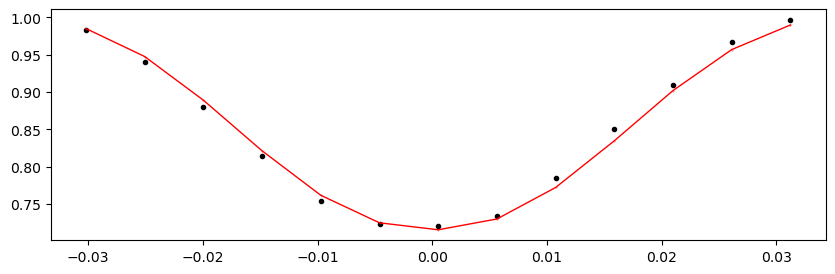

55324.567041999995 1.0072524836970236 -0.29206612180435276 0.17562742655042518


100%|██████████████████████████████████████████████████████| 10000/10000 [00:07<00:00, 1308.29it/s]


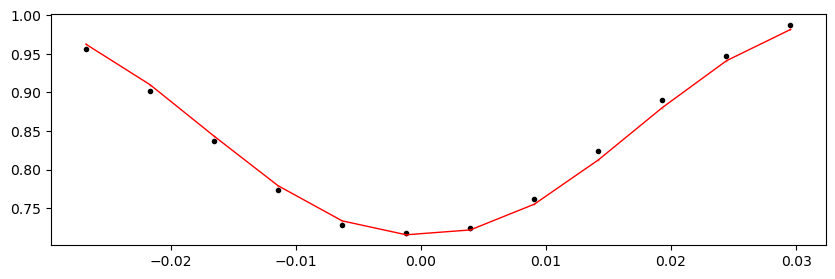

55328.558502 1.0072524836970236 -0.29206612180435276 0.17562742655042518


100%|██████████████████████████████████████████████████████| 10000/10000 [00:07<00:00, 1348.64it/s]


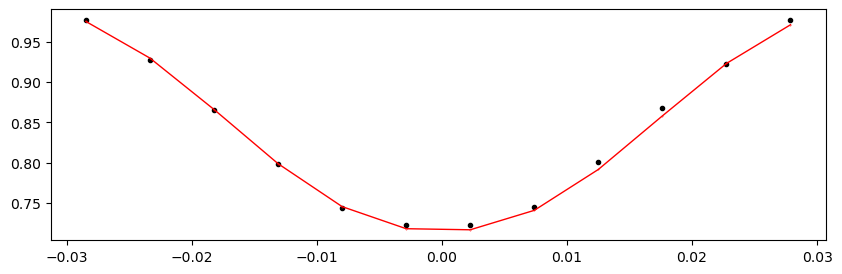

55332.549962 1.0072524836970236 -0.29206612180435276 0.17562742655042518


100%|██████████████████████████████████████████████████████| 10000/10000 [00:07<00:00, 1336.89it/s]


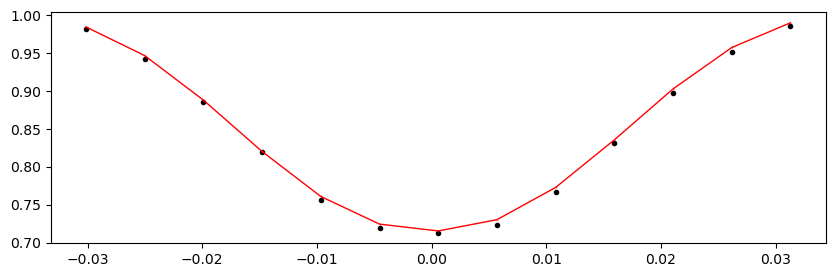

55340.532882 1.0072524836970236 -0.29206612180435276 0.17562742655042518


100%|██████████████████████████████████████████████████████| 10000/10000 [00:07<00:00, 1334.83it/s]


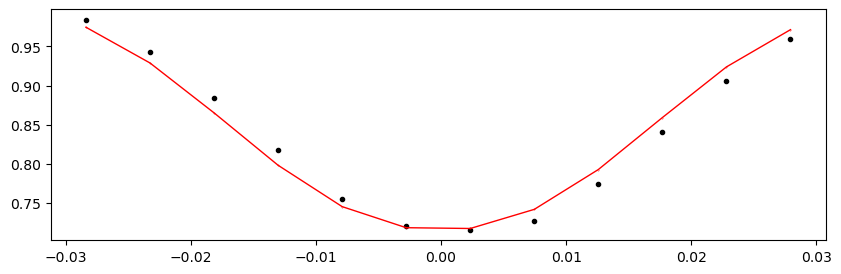

55344.524342 1.0072524836970236 -0.29206612180435276 0.17562742655042518


100%|██████████████████████████████████████████████████████| 10000/10000 [00:07<00:00, 1305.46it/s]


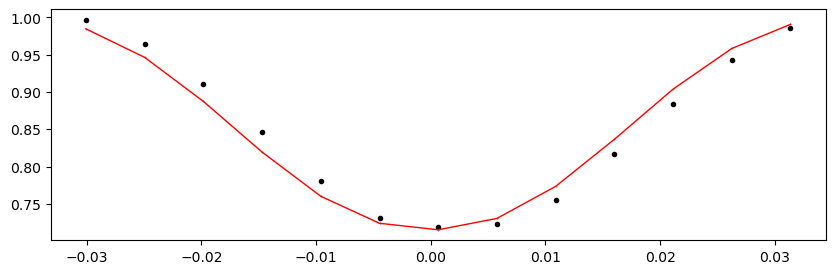

55348.515802 1.0072524836970236 -0.29206612180435276 0.17562742655042518


100%|██████████████████████████████████████████████████████| 10000/10000 [00:07<00:00, 1340.49it/s]


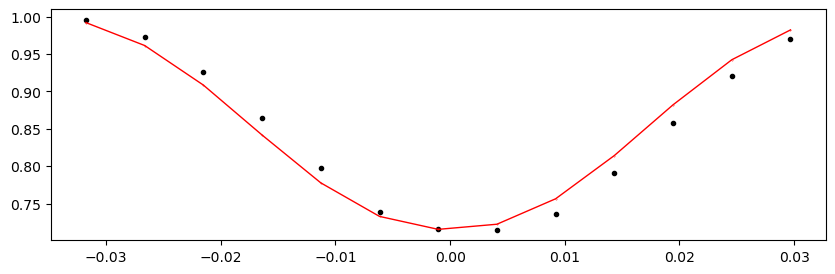

55352.507262 1.0072524836970236 -0.29206612180435276 0.17562742655042518


100%|██████████████████████████████████████████████████████| 10000/10000 [00:07<00:00, 1312.41it/s]


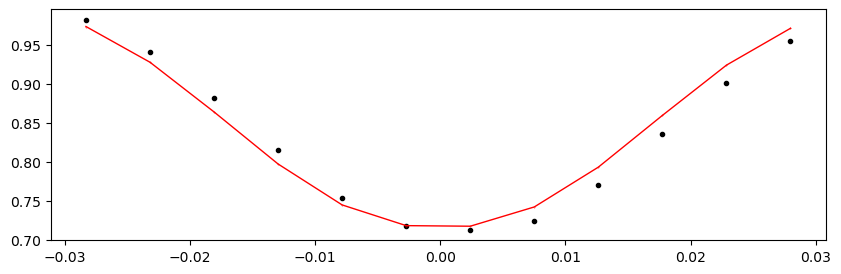

55356.498722 1.0072524836970236 -0.29206612180435276 0.17562742655042518


100%|██████████████████████████████████████████████████████| 10000/10000 [00:07<00:00, 1310.60it/s]


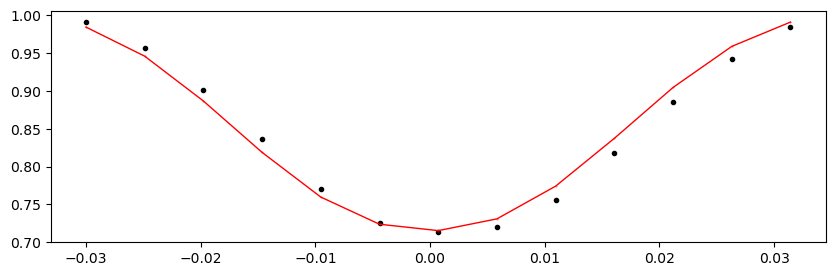

55360.490182 1.0072524836970236 -0.29206612180435276 0.17562742655042518


100%|██████████████████████████████████████████████████████| 10000/10000 [00:07<00:00, 1345.91it/s]


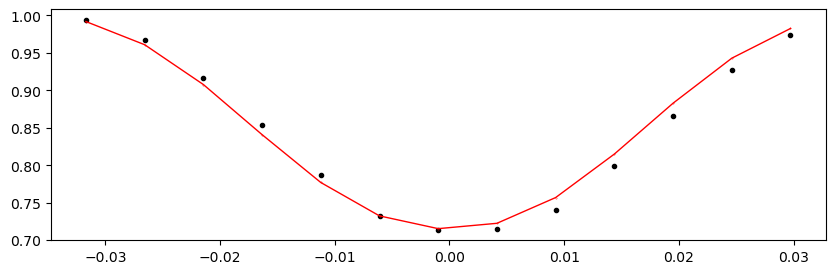

55364.481642 1.0072524836970236 -0.29206612180435276 0.17562742655042518


100%|██████████████████████████████████████████████████████| 10000/10000 [00:07<00:00, 1347.30it/s]


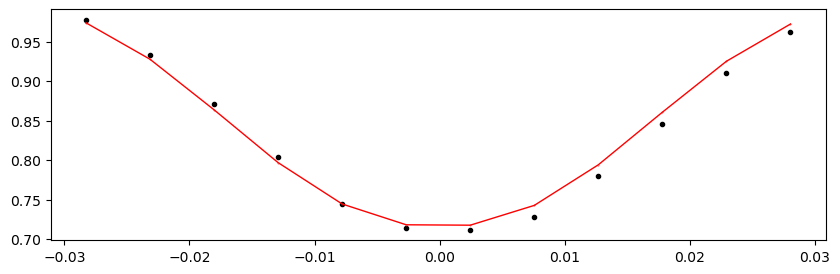

55368.473101999996 1.0072524836970236 -0.29206612180435276 0.17562742655042518


100%|██████████████████████████████████████████████████████| 10000/10000 [00:07<00:00, 1347.72it/s]


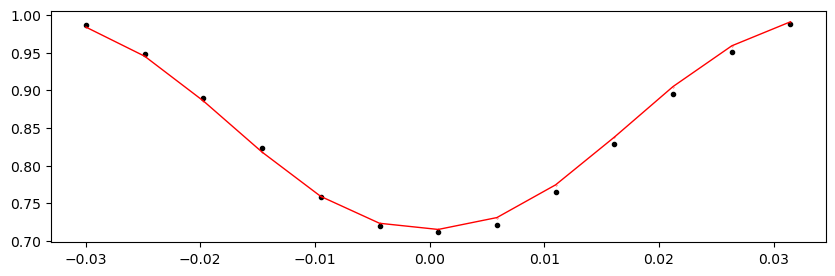

55372.464562 1.0072524836970236 -0.29206612180435276 0.17562742655042518


100%|██████████████████████████████████████████████████████| 10000/10000 [00:07<00:00, 1348.95it/s]


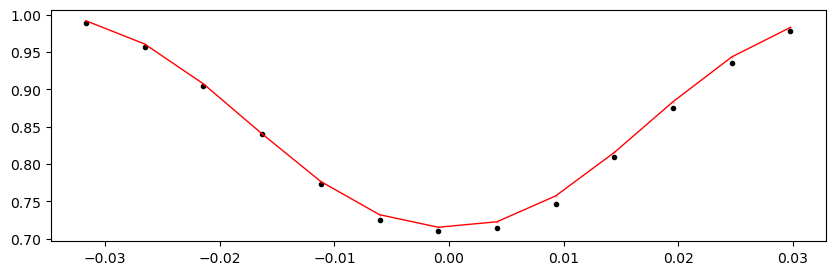

55376.456022 1.0072524836970236 -0.29206612180435276 0.17562742655042518


100%|██████████████████████████████████████████████████████| 10000/10000 [00:07<00:00, 1344.04it/s]


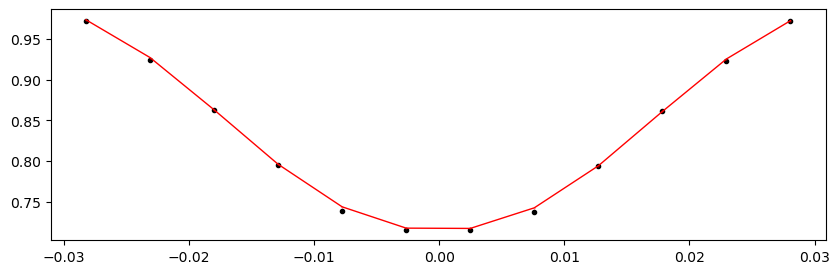

55380.447481999996 1.0072524836970236 -0.29206612180435276 0.17562742655042518


100%|██████████████████████████████████████████████████████| 10000/10000 [00:07<00:00, 1321.76it/s]


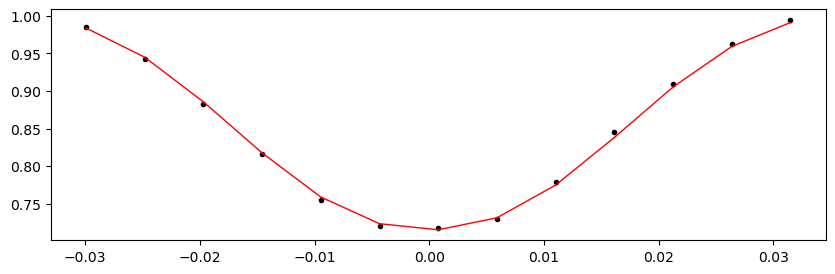

55384.438942 1.0072524836970236 -0.29206612180435276 0.17562742655042518


100%|██████████████████████████████████████████████████████| 10000/10000 [00:07<00:00, 1265.62it/s]


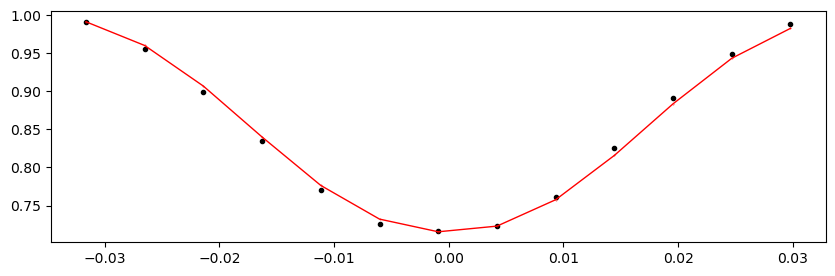

55388.430402 1.0072524836970236 -0.29206612180435276 0.17562742655042518


100%|██████████████████████████████████████████████████████| 10000/10000 [00:07<00:00, 1320.14it/s]


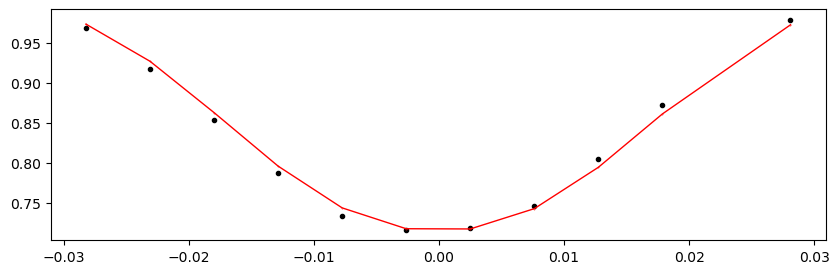

55392.421861999996 1.0072524836970236 -0.29206612180435276 0.17562742655042518


100%|██████████████████████████████████████████████████████| 10000/10000 [00:07<00:00, 1300.32it/s]


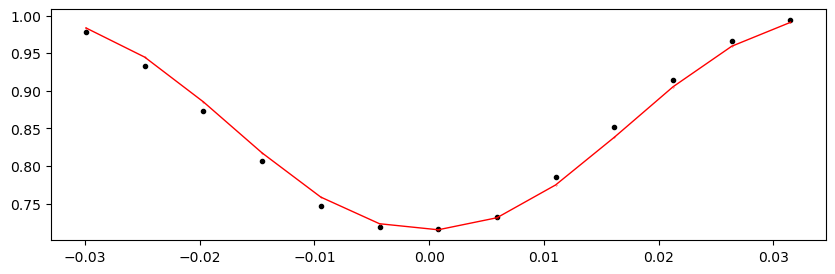

55396.413322 1.0072524836970236 -0.29206612180435276 0.17562742655042518


100%|██████████████████████████████████████████████████████| 10000/10000 [00:07<00:00, 1308.60it/s]


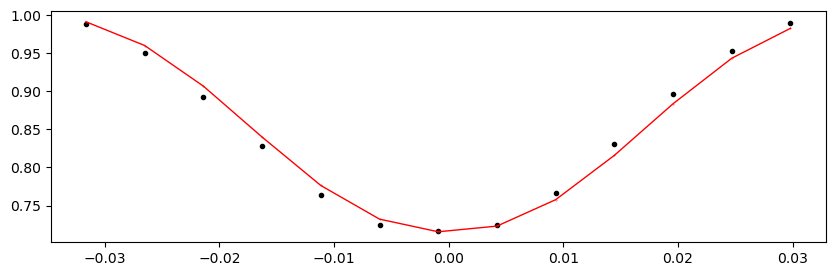

55400.404782 1.0072524836970236 -0.29206612180435276 0.17562742655042518


100%|██████████████████████████████████████████████████████| 10000/10000 [00:07<00:00, 1313.99it/s]


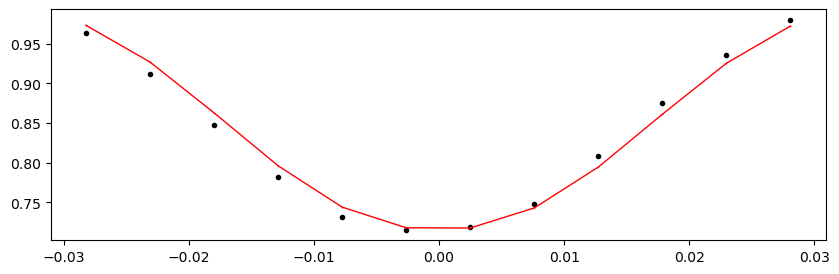

55404.396241999995 1.0072524836970236 -0.29206612180435276 0.17562742655042518


100%|██████████████████████████████████████████████████████| 10000/10000 [00:07<00:00, 1326.29it/s]


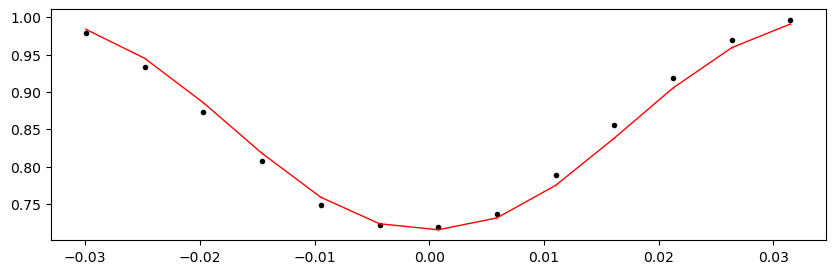

55408.387702 1.0072524836970236 -0.29206612180435276 0.17562742655042518


100%|██████████████████████████████████████████████████████| 10000/10000 [00:07<00:00, 1326.27it/s]


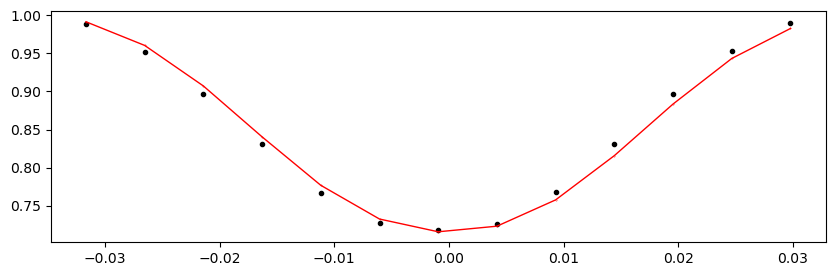

55412.379162 1.0072524836970236 -0.29206612180435276 0.17562742655042518


100%|██████████████████████████████████████████████████████| 10000/10000 [00:07<00:00, 1318.68it/s]


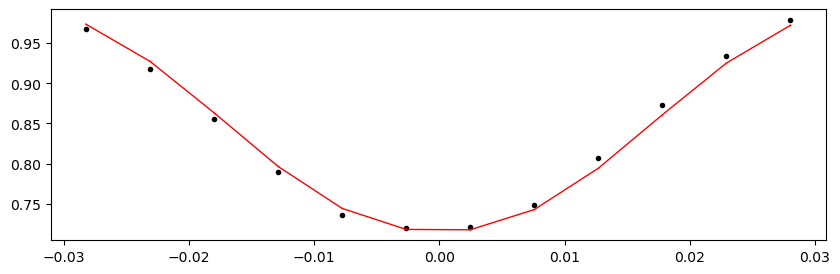

55416.370621999995 1.0072524836970236 -0.29206612180435276 0.17562742655042518


100%|██████████████████████████████████████████████████████| 10000/10000 [00:07<00:00, 1322.92it/s]


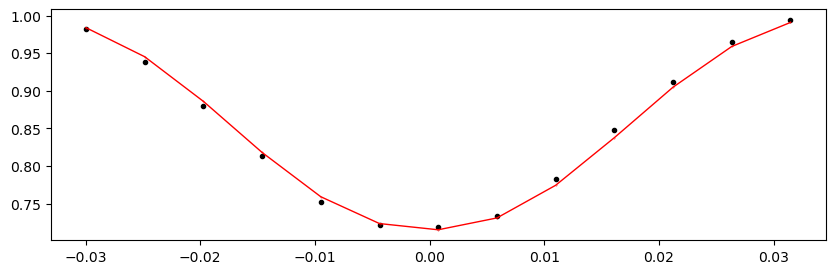

55420.362082 1.0072524836970236 -0.29206612180435276 0.17562742655042518


100%|██████████████████████████████████████████████████████| 10000/10000 [00:07<00:00, 1304.88it/s]


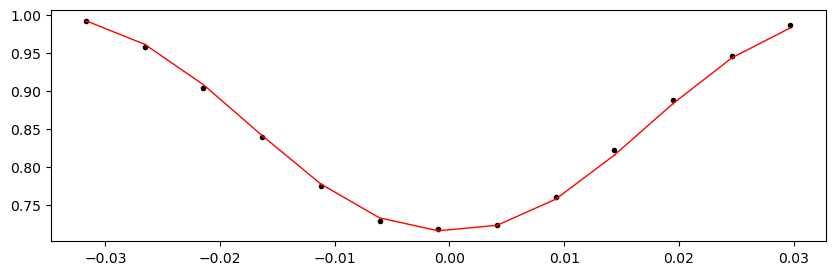

55424.353542 1.0072524836970236 -0.29206612180435276 0.17562742655042518


100%|██████████████████████████████████████████████████████| 10000/10000 [00:07<00:00, 1323.09it/s]


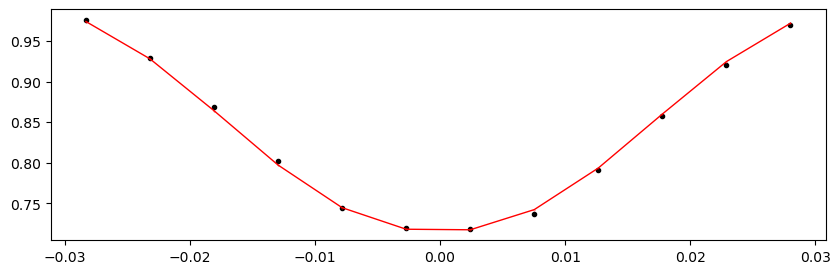

55428.345002 1.0072524836970236 -0.29206612180435276 0.17562742655042518


100%|██████████████████████████████████████████████████████| 10000/10000 [00:07<00:00, 1315.78it/s]


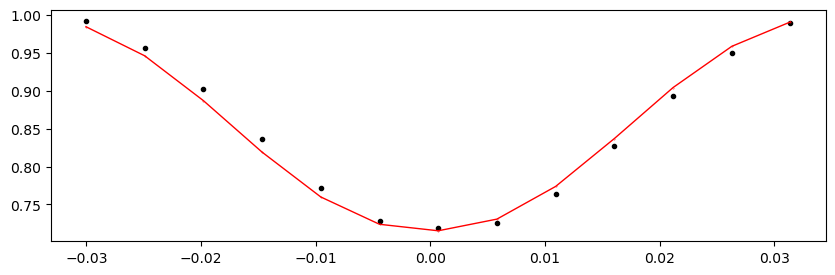

55432.336462 1.0072524836970236 -0.29206612180435276 0.17562742655042518


100%|██████████████████████████████████████████████████████| 10000/10000 [00:07<00:00, 1335.11it/s]


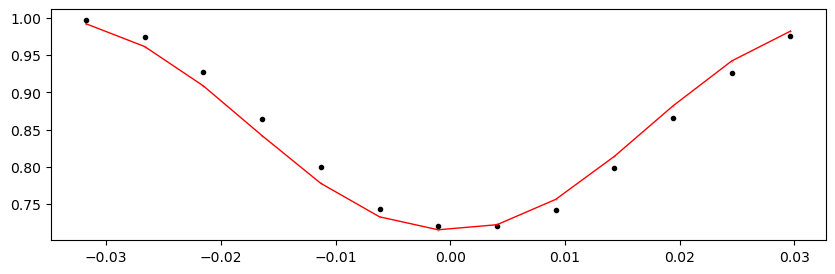

55436.327922 1.0072524836970236 -0.29206612180435276 0.17562742655042518


100%|██████████████████████████████████████████████████████| 10000/10000 [00:07<00:00, 1286.16it/s]


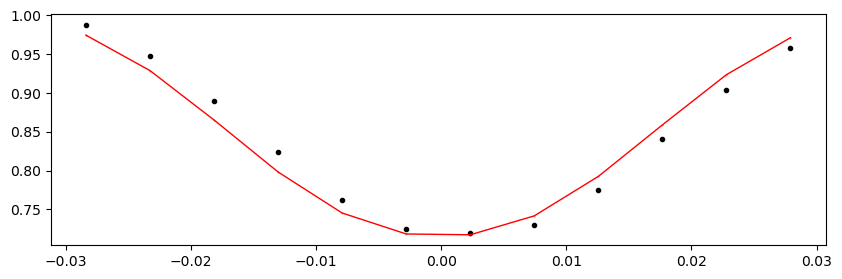

55440.319382 1.0072524836970236 -0.29206612180435276 0.17562742655042518


100%|██████████████████████████████████████████████████████| 10000/10000 [00:07<00:00, 1283.54it/s]


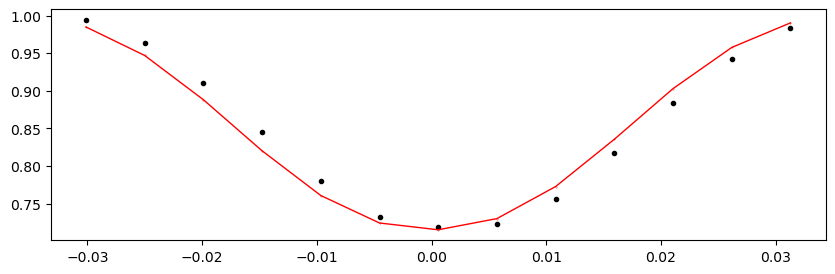

55444.310842 1.0072524836970236 -0.29206612180435276 0.17562742655042518


100%|██████████████████████████████████████████████████████| 10000/10000 [00:07<00:00, 1317.54it/s]


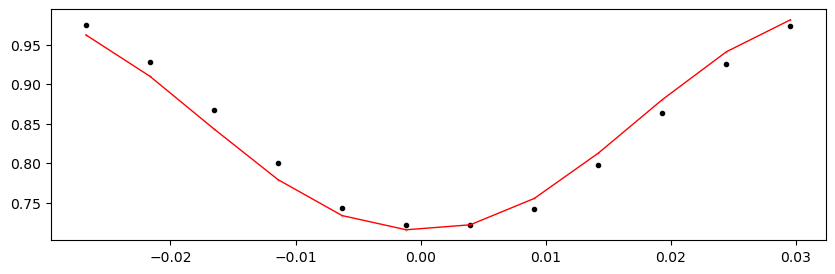

55448.302302 1.0072524836970236 -0.29206612180435276 0.17562742655042518


100%|██████████████████████████████████████████████████████| 10000/10000 [00:07<00:00, 1331.55it/s]


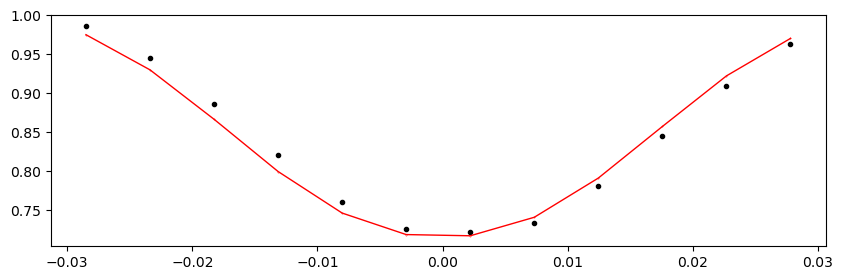

55452.293762 1.0072524836970236 -0.29206612180435276 0.17562742655042518


100%|██████████████████████████████████████████████████████| 10000/10000 [00:07<00:00, 1317.56it/s]


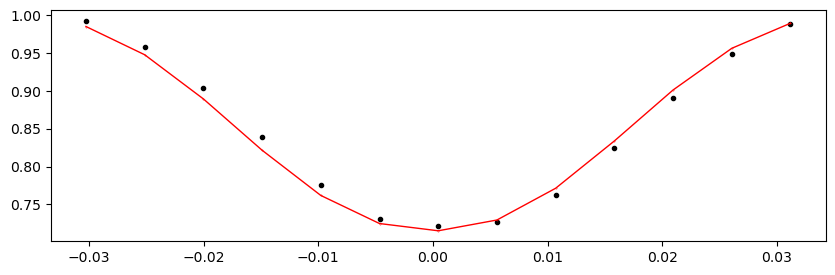

55456.285222 1.0072524836970236 -0.29206612180435276 0.17562742655042518


100%|██████████████████████████████████████████████████████| 10000/10000 [00:07<00:00, 1321.00it/s]


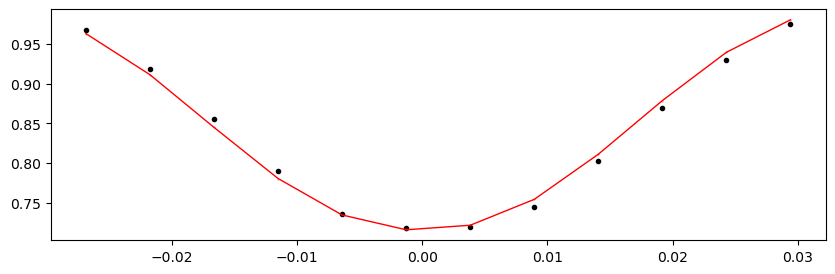

55460.276681999996 1.0072524836970236 -0.29206612180435276 0.17562742655042518


100%|██████████████████████████████████████████████████████| 10000/10000 [00:07<00:00, 1318.91it/s]


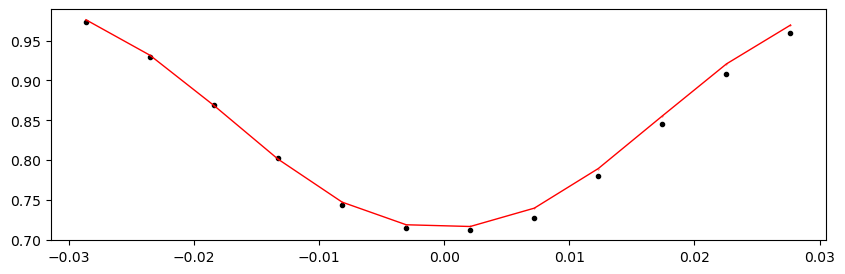

55464.268142 1.0072524836970236 -0.29206612180435276 0.17562742655042518


100%|██████████████████████████████████████████████████████| 10000/10000 [00:07<00:00, 1317.19it/s]


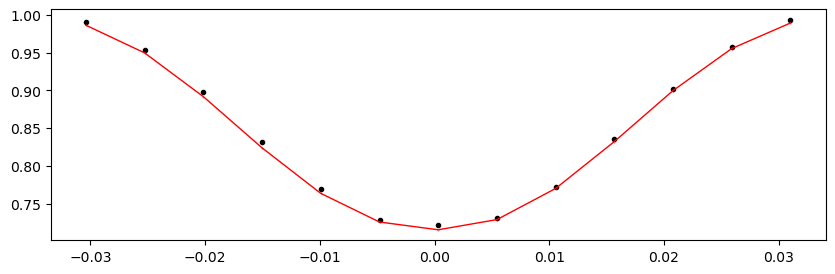

55468.259602 1.0072524836970236 -0.29206612180435276 0.17562742655042518


100%|██████████████████████████████████████████████████████| 10000/10000 [00:07<00:00, 1345.08it/s]


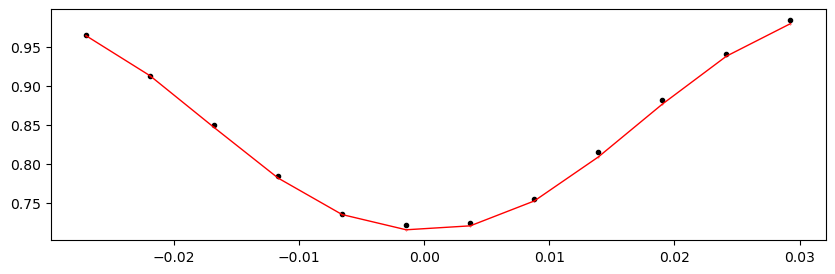

55472.251061999996 1.0072524836970236 -0.29206612180435276 0.17562742655042518


100%|██████████████████████████████████████████████████████| 10000/10000 [00:07<00:00, 1360.24it/s]


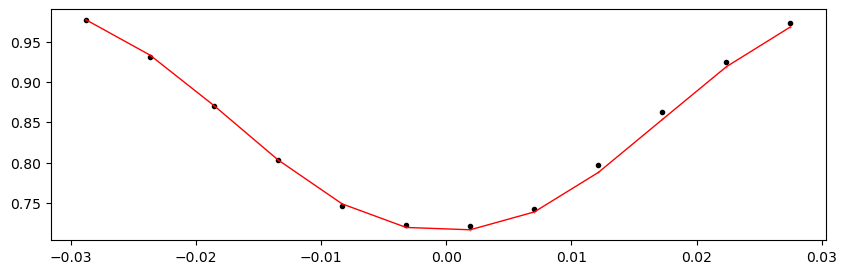

55476.242522 1.0072524836970236 -0.29206612180435276 0.17562742655042518


100%|██████████████████████████████████████████████████████| 10000/10000 [00:07<00:00, 1344.05it/s]


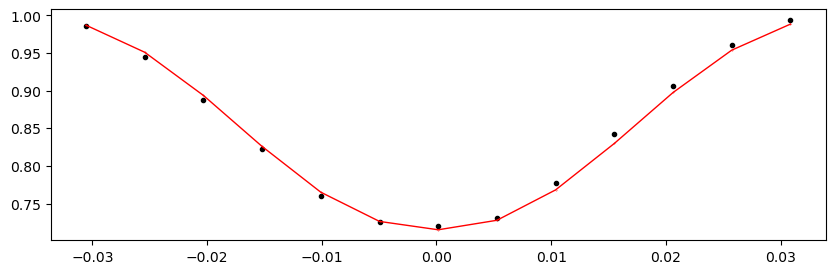

55480.233982 1.0072524836970236 -0.29206612180435276 0.17562742655042518


100%|██████████████████████████████████████████████████████| 10000/10000 [00:07<00:00, 1349.52it/s]


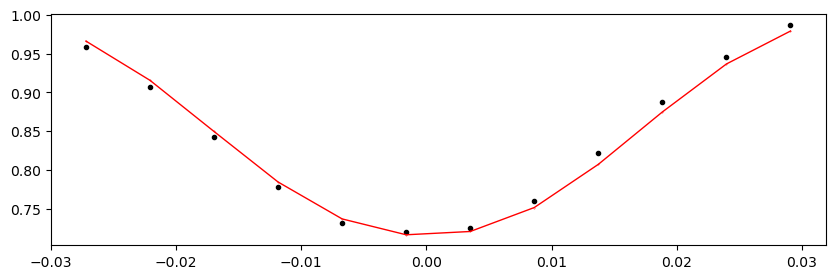

55484.225441999995 1.0072524836970236 -0.29206612180435276 0.17562742655042518


100%|██████████████████████████████████████████████████████| 10000/10000 [00:07<00:00, 1351.10it/s]


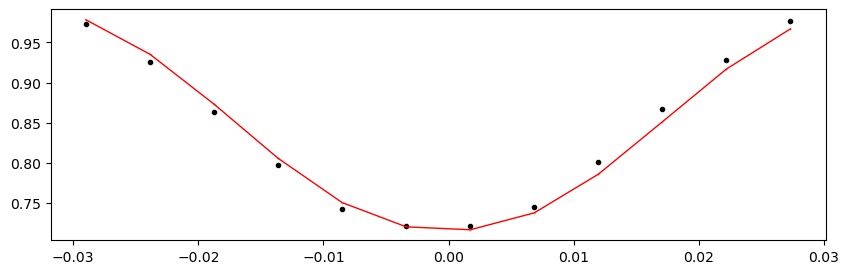

55488.216902 1.0072524836970236 -0.29206612180435276 0.17562742655042518


100%|██████████████████████████████████████████████████████| 10000/10000 [00:07<00:00, 1353.25it/s]


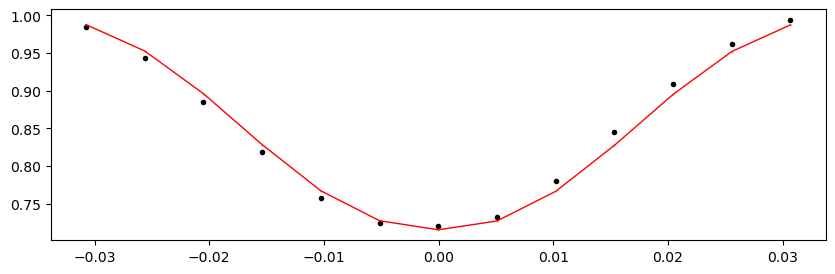

55492.208362 1.0072524836970236 -0.29206612180435276 0.17562742655042518


100%|██████████████████████████████████████████████████████| 10000/10000 [00:07<00:00, 1353.24it/s]


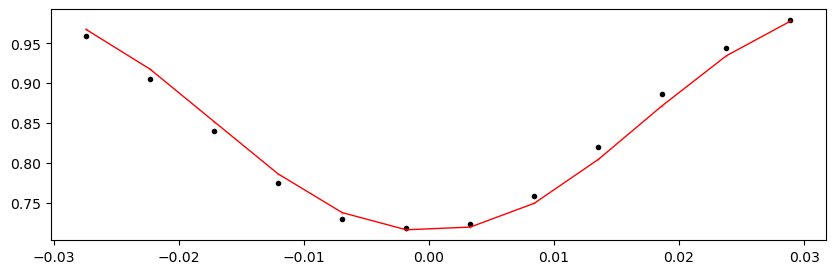

55496.199821999995 1.0072524836970236 -0.29206612180435276 0.17562742655042518


100%|██████████████████████████████████████████████████████| 10000/10000 [00:07<00:00, 1369.93it/s]


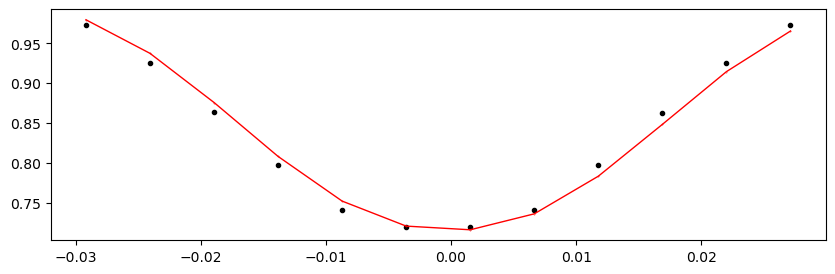

55500.191282 1.0072524836970236 -0.29206612180435276 0.17562742655042518


100%|██████████████████████████████████████████████████████| 10000/10000 [00:07<00:00, 1349.56it/s]


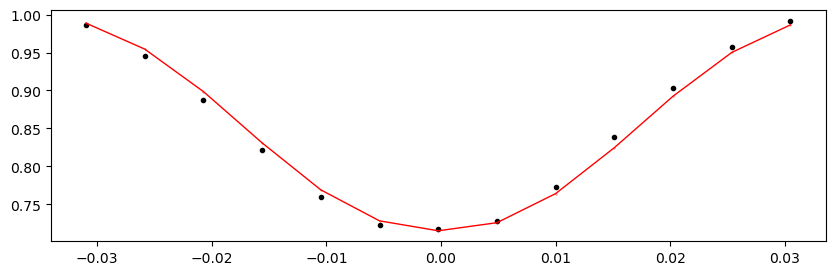

55504.182742 1.0072524836970236 -0.29206612180435276 0.17562742655042518


100%|██████████████████████████████████████████████████████| 10000/10000 [00:07<00:00, 1347.72it/s]


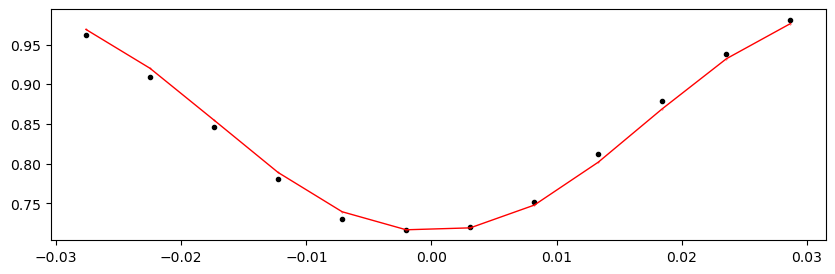

55508.174201999995 1.0072524836970236 -0.29206612180435276 0.17562742655042518


100%|██████████████████████████████████████████████████████| 10000/10000 [00:07<00:00, 1355.00it/s]


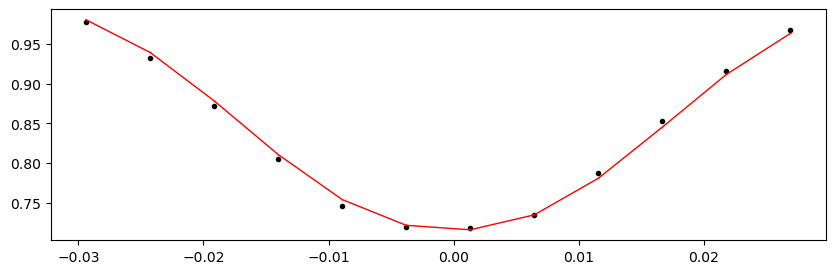

55512.165662 1.0072524836970236 -0.29206612180435276 0.17562742655042518


100%|██████████████████████████████████████████████████████| 10000/10000 [00:07<00:00, 1349.52it/s]


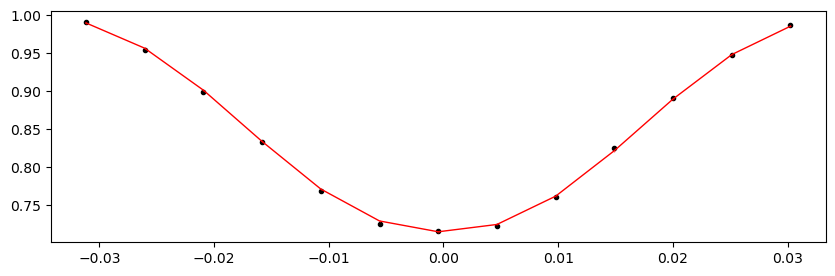

55516.157122 1.0072524836970236 -0.29206612180435276 0.17562742655042518


100%|██████████████████████████████████████████████████████| 10000/10000 [00:07<00:00, 1354.61it/s]


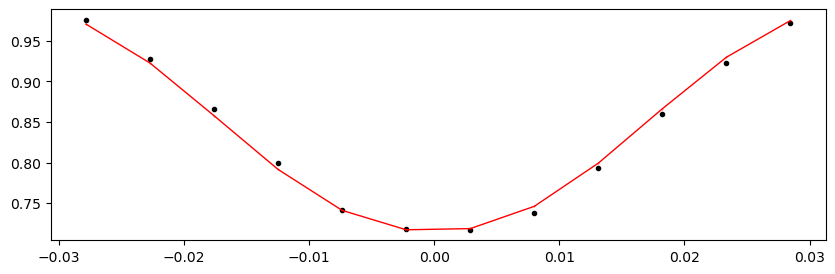

55520.148582 1.0072524836970236 -0.29206612180435276 0.17562742655042518


100%|██████████████████████████████████████████████████████| 10000/10000 [00:07<00:00, 1355.04it/s]


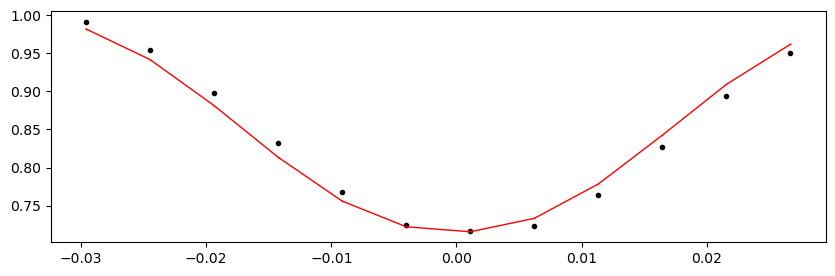

55524.140042 1.0072524836970236 -0.29206612180435276 0.17562742655042518


100%|██████████████████████████████████████████████████████| 10000/10000 [00:07<00:00, 1350.60it/s]


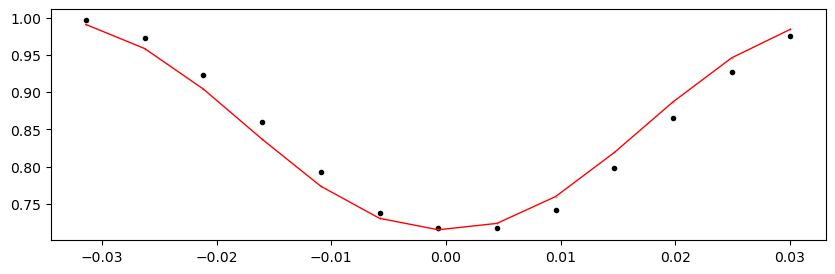

55528.131502 1.0072524836970236 -0.29206612180435276 0.17562742655042518


100%|██████████████████████████████████████████████████████| 10000/10000 [00:07<00:00, 1351.74it/s]


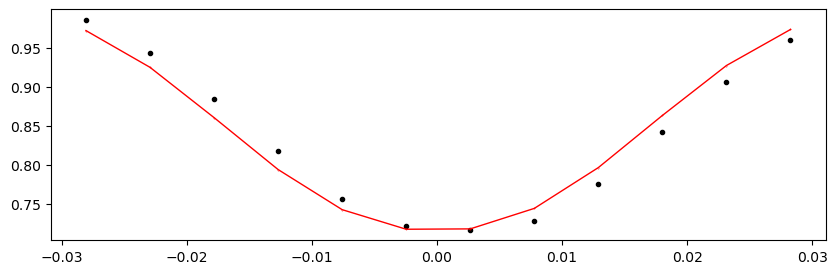

55532.122962 1.0072524836970236 -0.29206612180435276 0.17562742655042518


100%|██████████████████████████████████████████████████████| 10000/10000 [00:07<00:00, 1356.82it/s]


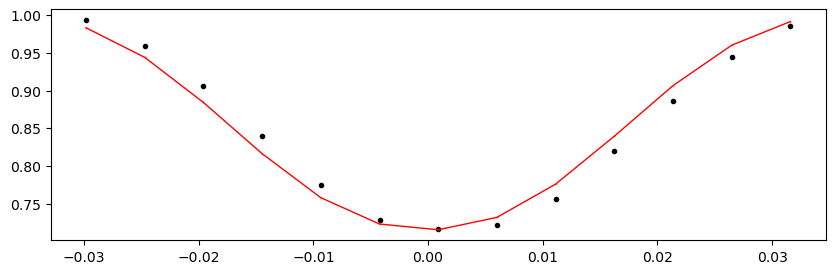

55536.114422 1.0072524836970236 -0.29206612180435276 0.17562742655042518


100%|██████████████████████████████████████████████████████| 10000/10000 [00:07<00:00, 1354.11it/s]


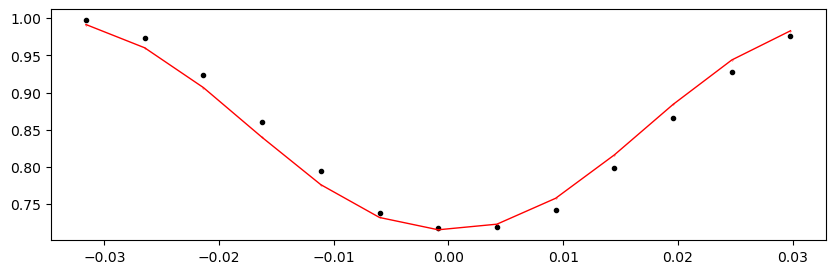

55540.105881999996 1.0072524836970236 -0.29206612180435276 0.17562742655042518


100%|██████████████████████████████████████████████████████| 10000/10000 [00:07<00:00, 1367.85it/s]


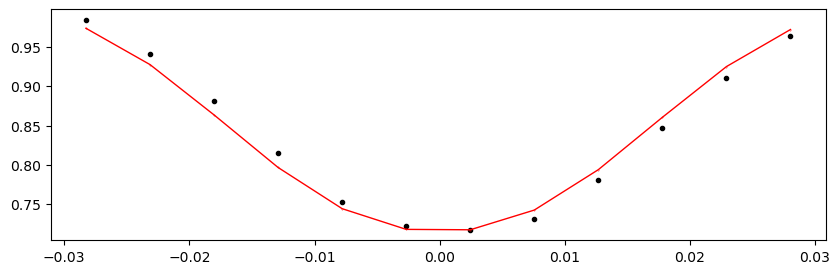

55544.097342 1.0072524836970236 -0.29206612180435276 0.17562742655042518


100%|██████████████████████████████████████████████████████| 10000/10000 [00:07<00:00, 1358.24it/s]


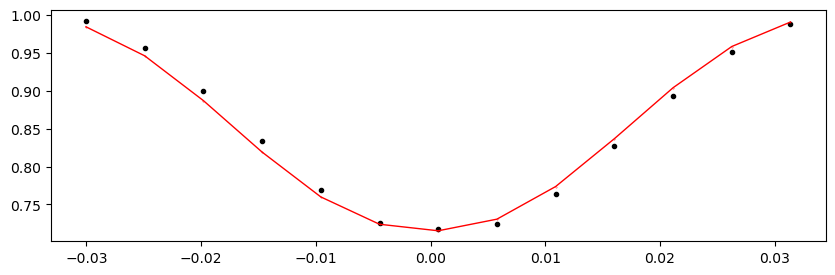

55548.088802 1.0072524836970236 -0.29206612180435276 0.17562742655042518


100%|██████████████████████████████████████████████████████| 10000/10000 [00:07<00:00, 1340.50it/s]


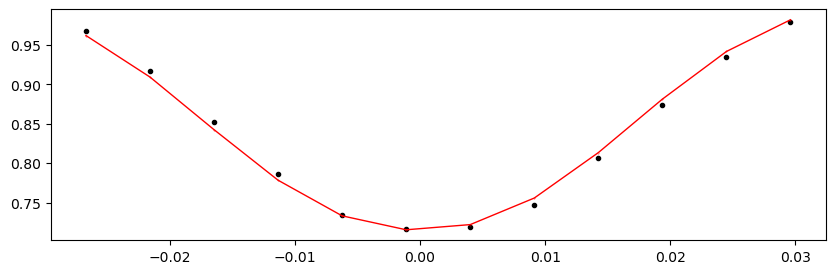

Time 55552.080261999996 does not have enough data points: 4
55568.046102 1.0072524836970236 -0.29206612180435276 0.17562742655042518


100%|██████████████████████████████████████████████████████| 10000/10000 [00:07<00:00, 1279.42it/s]


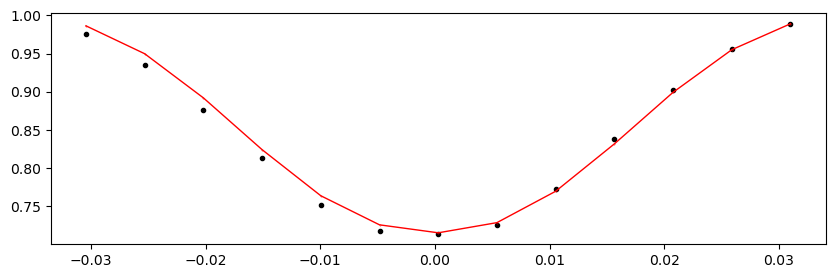

55572.037562 1.0072524836970236 -0.29206612180435276 0.17562742655042518


100%|██████████████████████████████████████████████████████| 10000/10000 [00:07<00:00, 1326.26it/s]


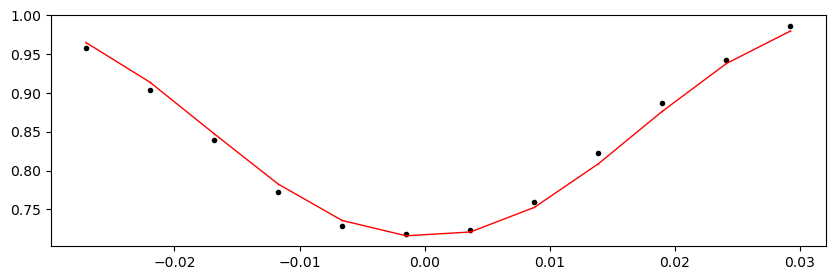

55576.029021999995 1.0072524836970236 -0.29206612180435276 0.17562742655042518


100%|██████████████████████████████████████████████████████| 10000/10000 [00:07<00:00, 1345.88it/s]


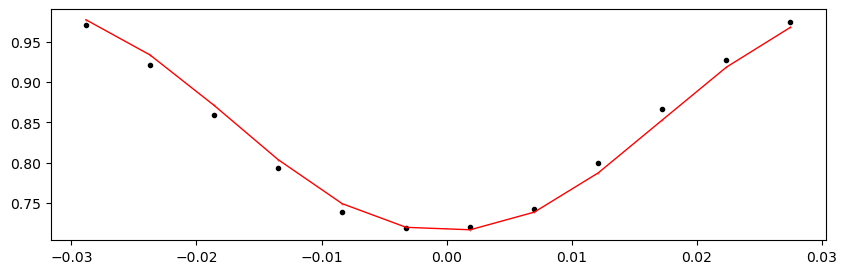

55580.020482 1.0072524836970236 -0.29206612180435276 0.17562742655042518


100%|██████████████████████████████████████████████████████| 10000/10000 [00:07<00:00, 1351.31it/s]


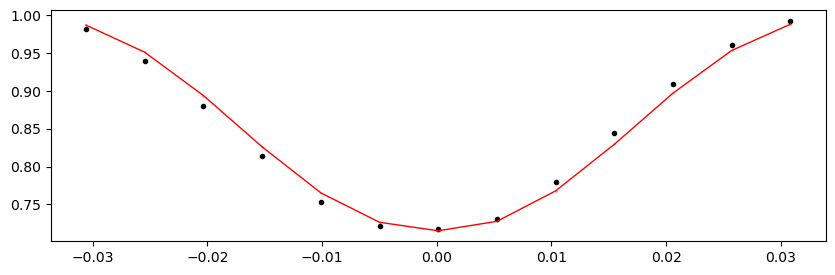

55584.011942 1.0072524836970236 -0.29206612180435276 0.17562742655042518


100%|██████████████████████████████████████████████████████| 10000/10000 [00:07<00:00, 1339.15it/s]


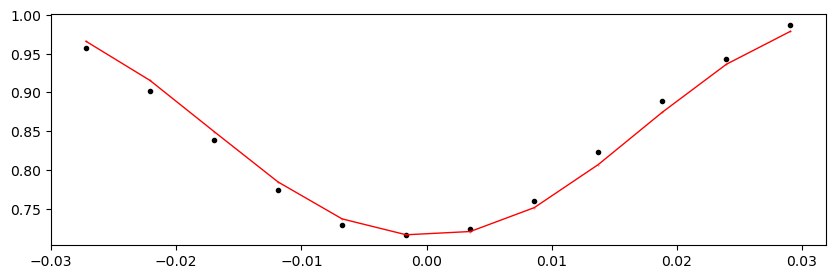

55588.003401999995 1.0072524836970236 -0.29206612180435276 0.17562742655042518


100%|██████████████████████████████████████████████████████| 10000/10000 [00:07<00:00, 1349.60it/s]


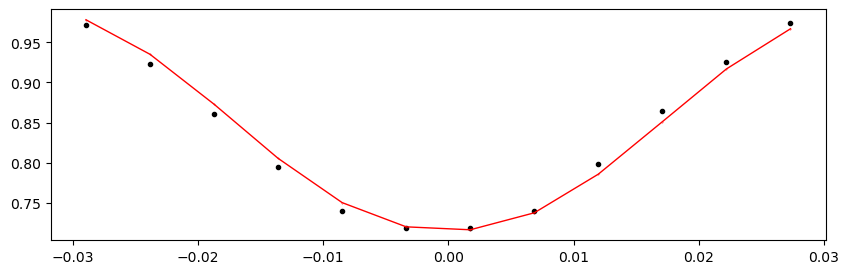

55591.994862 1.0072524836970236 -0.29206612180435276 0.17562742655042518


100%|██████████████████████████████████████████████████████| 10000/10000 [00:07<00:00, 1342.29it/s]


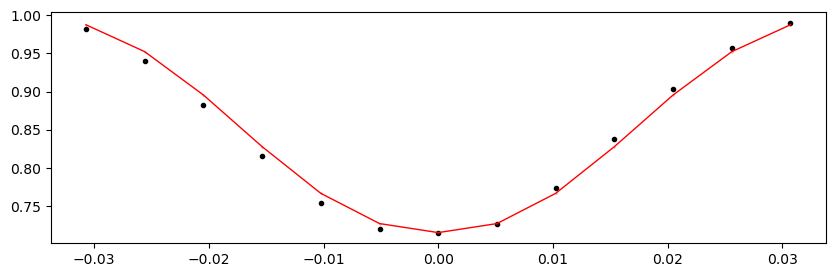

55599.977782 1.0072524836970236 -0.29206612180435276 0.17562742655042518


100%|██████████████████████████████████████████████████████| 10000/10000 [00:08<00:00, 1221.75it/s]


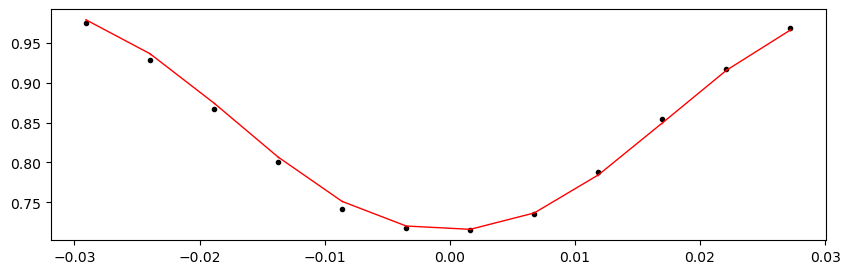

55603.969242 1.0072524836970236 -0.29206612180435276 0.17562742655042518


100%|██████████████████████████████████████████████████████| 10000/10000 [00:07<00:00, 1301.22it/s]


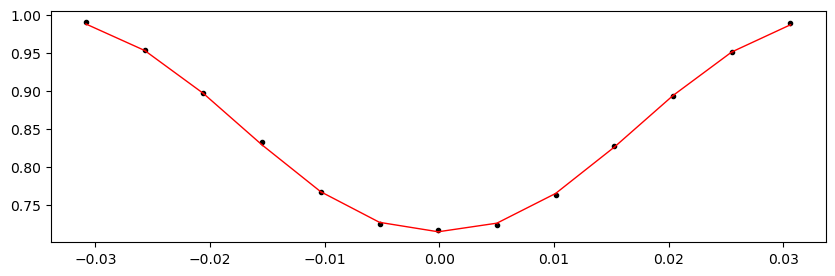

55607.960702 1.0072524836970236 -0.29206612180435276 0.17562742655042518


100%|██████████████████████████████████████████████████████| 10000/10000 [00:07<00:00, 1286.39it/s]


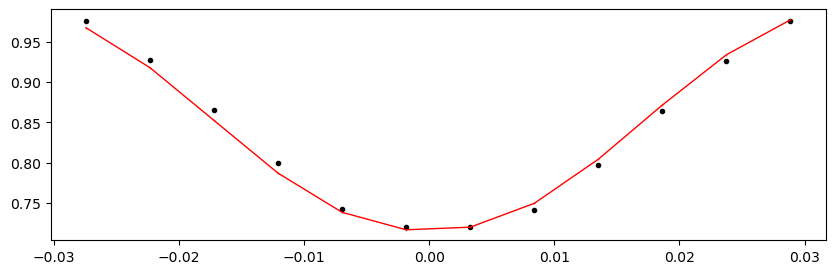

55611.952162 1.0072524836970236 -0.29206612180435276 0.17562742655042518


100%|██████████████████████████████████████████████████████| 10000/10000 [00:07<00:00, 1308.92it/s]


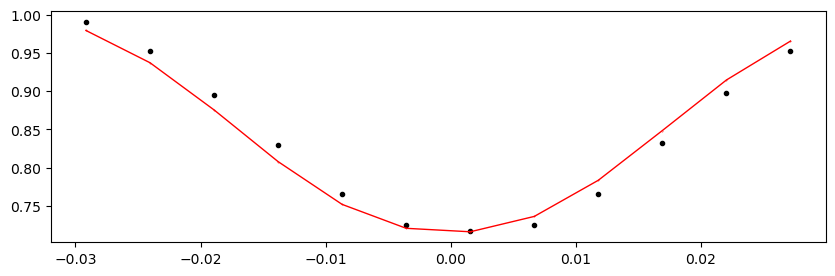

55615.943622 1.0072524836970236 -0.29206612180435276 0.17562742655042518


100%|██████████████████████████████████████████████████████| 10000/10000 [00:07<00:00, 1312.66it/s]


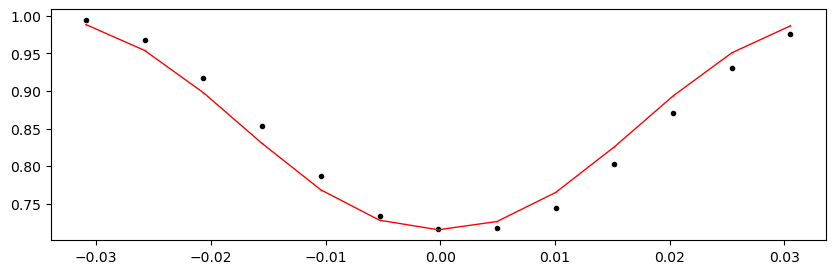

55619.935081999996 1.0072524836970236 -0.29206612180435276 0.17562742655042518


100%|██████████████████████████████████████████████████████| 10000/10000 [00:07<00:00, 1290.36it/s]


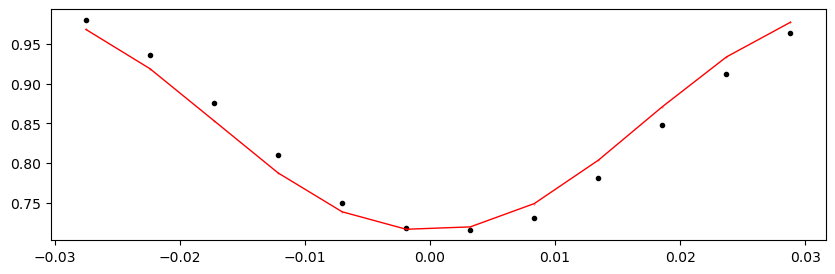

55623.926542 1.0072524836970236 -0.29206612180435276 0.17562742655042518


100%|██████████████████████████████████████████████████████| 10000/10000 [00:08<00:00, 1222.23it/s]


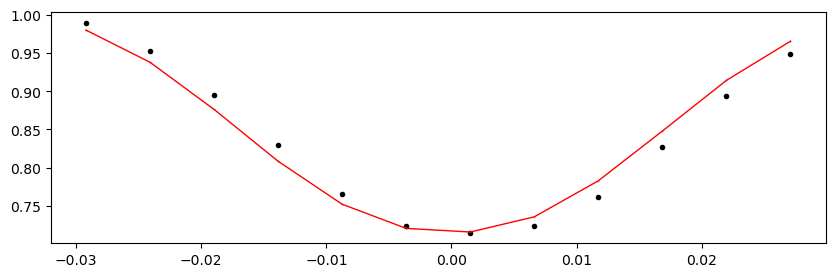

55627.918002 1.0072524836970236 -0.29206612180435276 0.17562742655042518


100%|██████████████████████████████████████████████████████| 10000/10000 [00:07<00:00, 1262.61it/s]


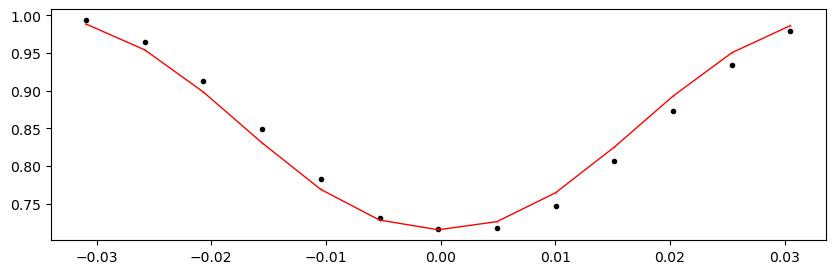

55631.909461999996 1.0072524836970236 -0.29206612180435276 0.17562742655042518


100%|██████████████████████████████████████████████████████| 10000/10000 [00:07<00:00, 1302.01it/s]


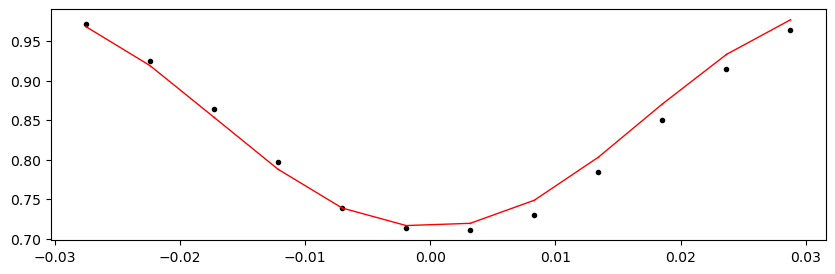

55643.883841999996 1.0072524836970236 -0.29206612180435276 0.17562742655042518


100%|██████████████████████████████████████████████████████| 10000/10000 [00:07<00:00, 1293.67it/s]


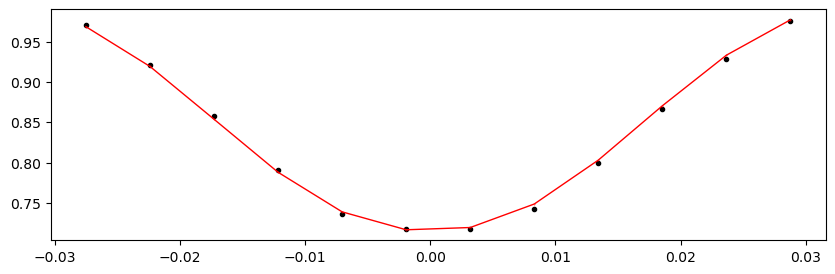

55647.875302 1.0072524836970236 -0.29206612180435276 0.17562742655042518


100%|██████████████████████████████████████████████████████| 10000/10000 [00:07<00:00, 1305.44it/s]


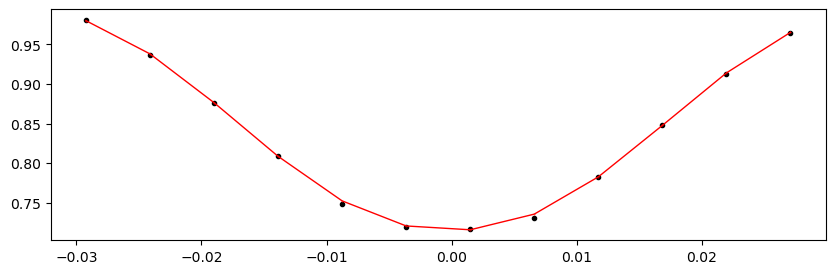

55651.866762 1.0072524836970236 -0.29206612180435276 0.17562742655042518


100%|██████████████████████████████████████████████████████| 10000/10000 [00:07<00:00, 1327.95it/s]


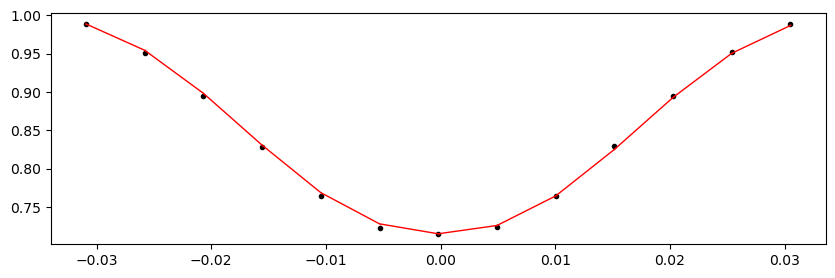

55655.858221999995 1.0072524836970236 -0.29206612180435276 0.17562742655042518


100%|██████████████████████████████████████████████████████| 10000/10000 [00:07<00:00, 1349.51it/s]


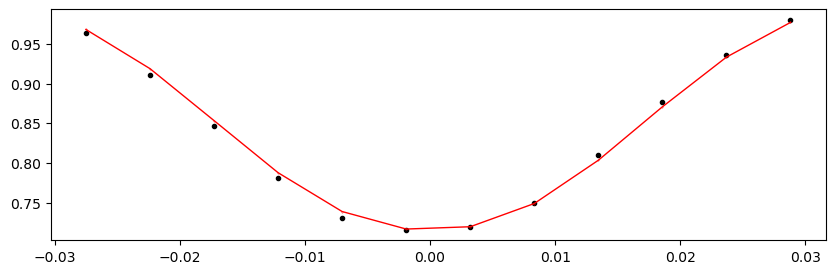

55659.849682 1.0072524836970236 -0.29206612180435276 0.17562742655042518


100%|██████████████████████████████████████████████████████| 10000/10000 [00:07<00:00, 1353.21it/s]


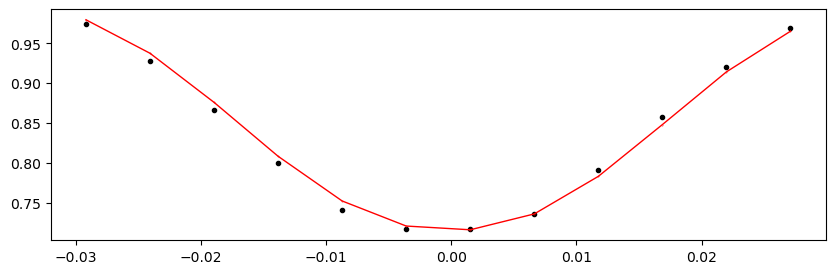

55663.841142 1.0072524836970236 -0.29206612180435276 0.17562742655042518


100%|██████████████████████████████████████████████████████| 10000/10000 [00:07<00:00, 1305.41it/s]


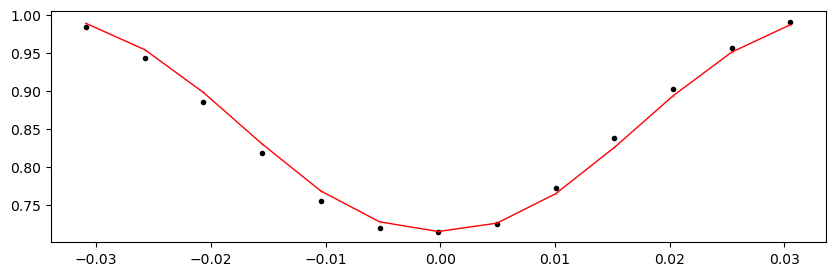

55667.832601999995 1.0072524836970236 -0.29206612180435276 0.17562742655042518


100%|██████████████████████████████████████████████████████| 10000/10000 [00:07<00:00, 1308.58it/s]


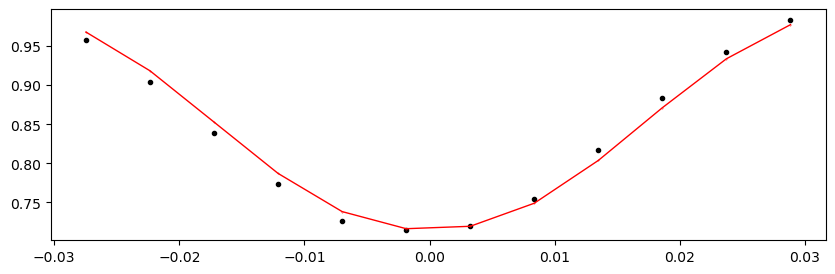

55671.824062 1.0072524836970236 -0.29206612180435276 0.17562742655042518


100%|██████████████████████████████████████████████████████| 10000/10000 [00:07<00:00, 1344.71it/s]


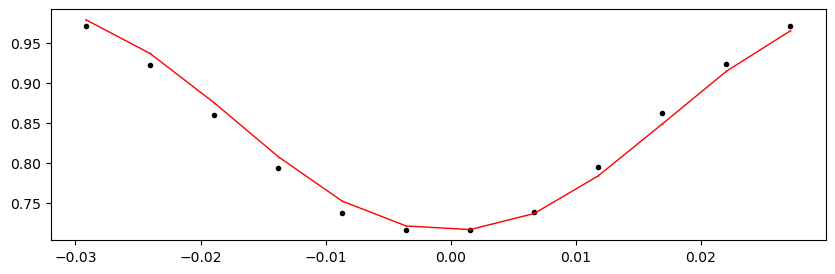

55675.815522 1.0072524836970236 -0.29206612180435276 0.17562742655042518


100%|██████████████████████████████████████████████████████| 10000/10000 [00:07<00:00, 1278.11it/s]


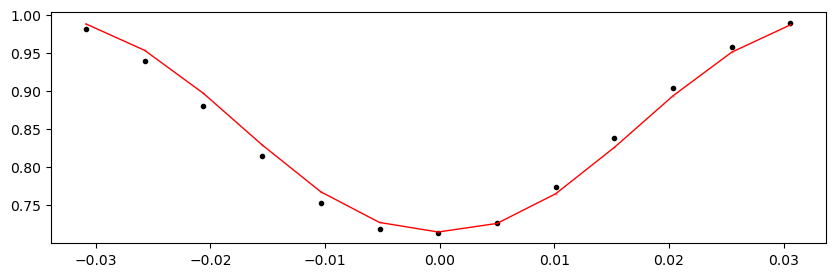

55679.806981999995 1.0072524836970236 -0.29206612180435276 0.17562742655042518


100%|██████████████████████████████████████████████████████| 10000/10000 [00:07<00:00, 1328.95it/s]


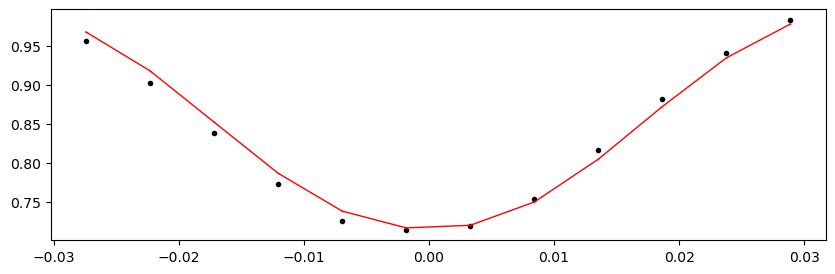

55683.798442 1.0072524836970236 -0.29206612180435276 0.17562742655042518


100%|██████████████████████████████████████████████████████| 10000/10000 [00:07<00:00, 1336.86it/s]


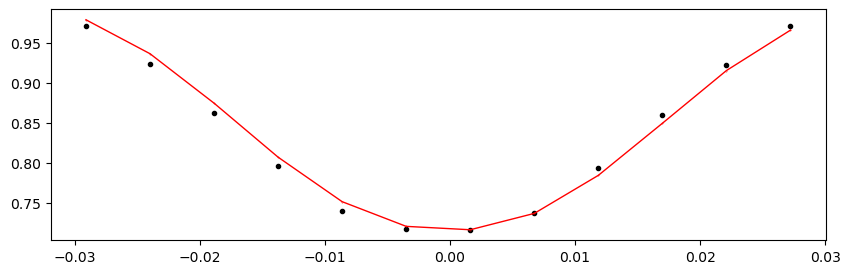

55687.789902 1.0072524836970236 -0.29206612180435276 0.17562742655042518


100%|██████████████████████████████████████████████████████| 10000/10000 [00:07<00:00, 1332.11it/s]


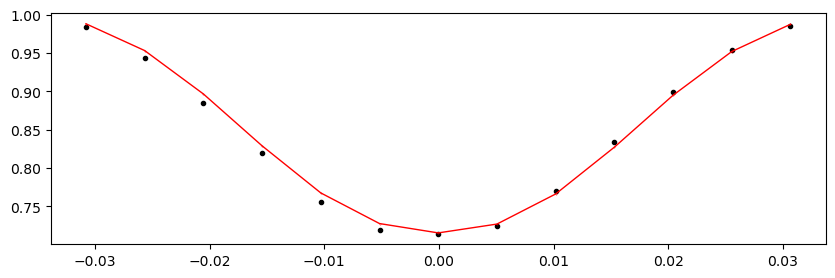

55691.781362 1.0072524836970236 -0.29206612180435276 0.17562742655042518


100%|██████████████████████████████████████████████████████| 10000/10000 [00:07<00:00, 1321.61it/s]


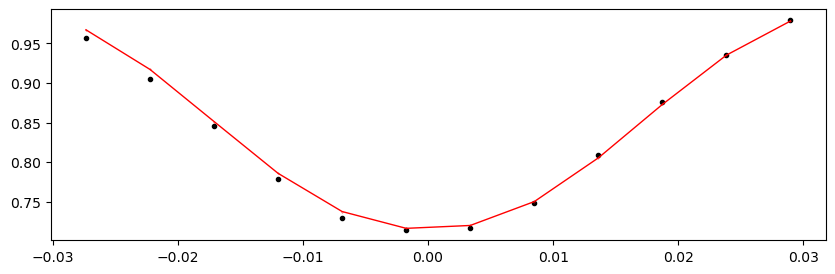

55695.772822 1.0072524836970236 -0.29206612180435276 0.17562742655042518


100%|██████████████████████████████████████████████████████| 10000/10000 [00:07<00:00, 1334.18it/s]


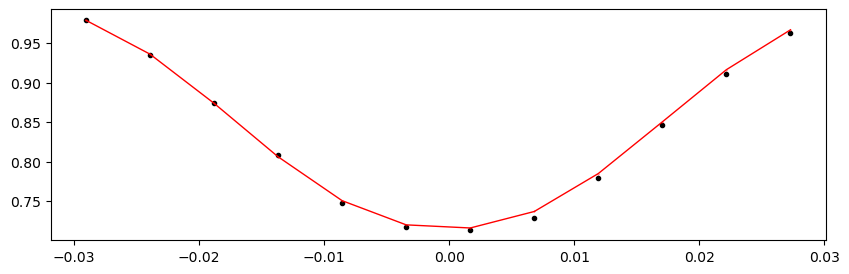

55699.764282 1.0072524836970236 -0.29206612180435276 0.17562742655042518


100%|██████████████████████████████████████████████████████| 10000/10000 [00:07<00:00, 1350.40it/s]


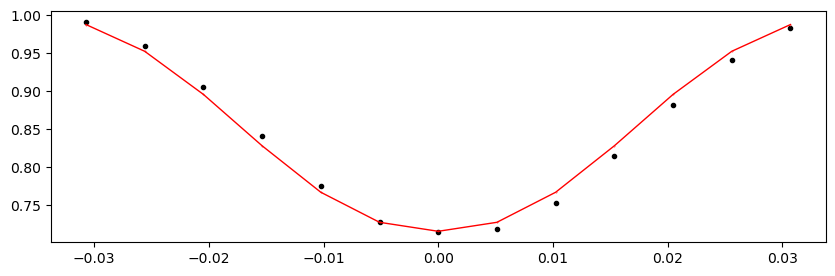

55703.755742 1.0072524836970236 -0.29206612180435276 0.17562742655042518


100%|██████████████████████████████████████████████████████| 10000/10000 [00:07<00:00, 1351.26it/s]


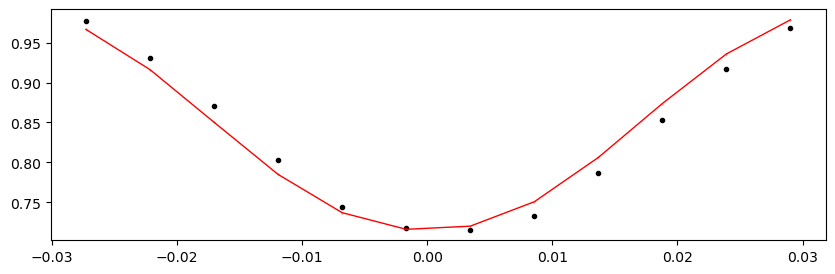

55707.747202 1.0072524836970236 -0.29206612180435276 0.17562742655042518


100%|██████████████████████████████████████████████████████| 10000/10000 [00:07<00:00, 1350.79it/s]


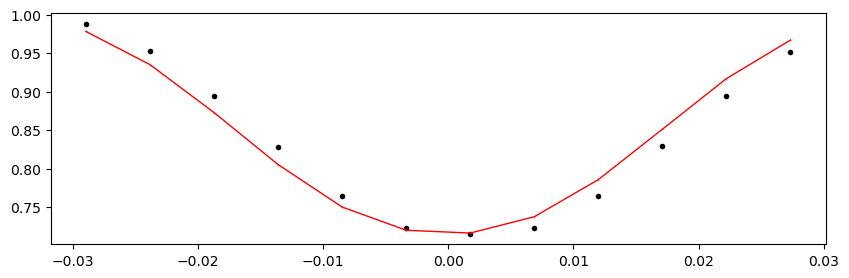

55711.738661999996 1.0072524836970236 -0.29206612180435276 0.17562742655042518


100%|██████████████████████████████████████████████████████| 10000/10000 [00:07<00:00, 1342.69it/s]


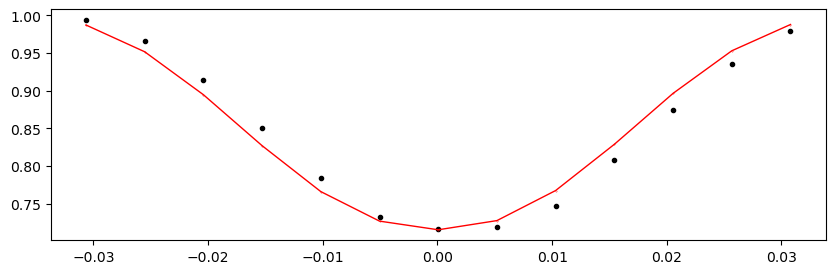

55715.730122 1.0072524836970236 -0.29206612180435276 0.17562742655042518


100%|██████████████████████████████████████████████████████| 10000/10000 [00:07<00:00, 1352.10it/s]


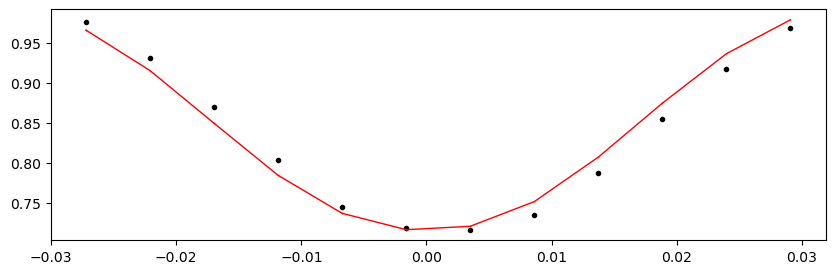

55723.713041999996 1.0072524836970236 -0.29206612180435276 0.17562742655042518


100%|██████████████████████████████████████████████████████| 10000/10000 [00:07<00:00, 1348.61it/s]


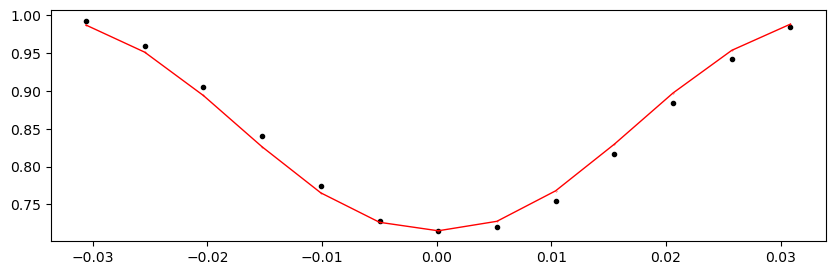

55727.704502 1.0072524836970236 -0.29206612180435276 0.17562742655042518


100%|██████████████████████████████████████████████████████| 10000/10000 [00:07<00:00, 1342.12it/s]


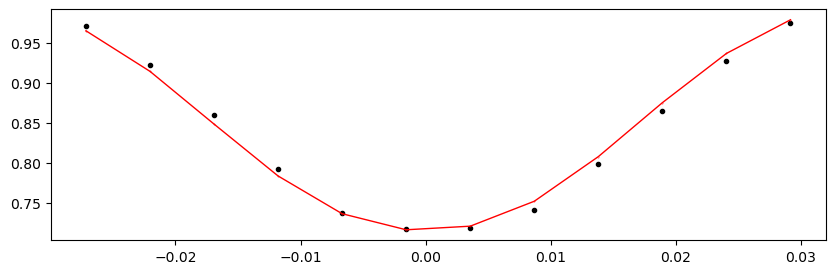

55731.695962 1.0072524836970236 -0.29206612180435276 0.17562742655042518


100%|██████████████████████████████████████████████████████| 10000/10000 [00:07<00:00, 1359.59it/s]


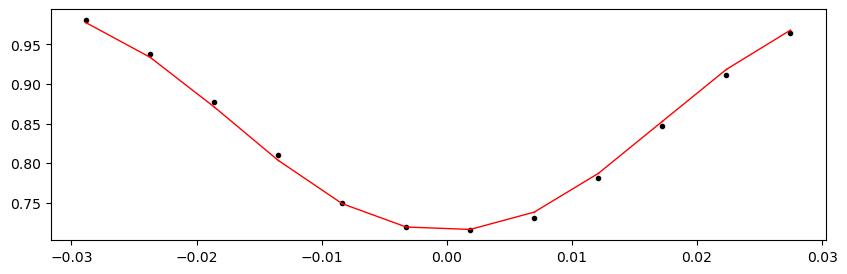

55735.687421999995 1.0072524836970236 -0.29206612180435276 0.17562742655042518


100%|██████████████████████████████████████████████████████| 10000/10000 [00:07<00:00, 1344.07it/s]


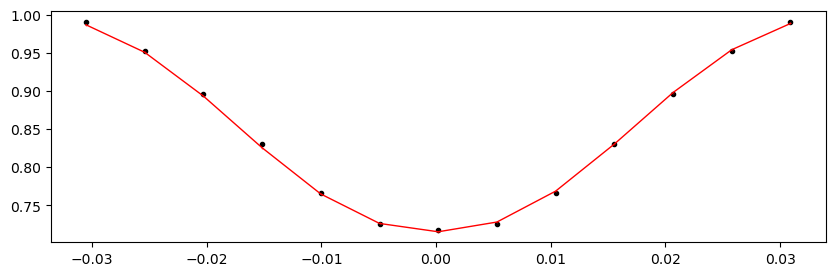

55739.678882 1.0072524836970236 -0.29206612180435276 0.17562742655042518


100%|██████████████████████████████████████████████████████| 10000/10000 [00:07<00:00, 1268.94it/s]


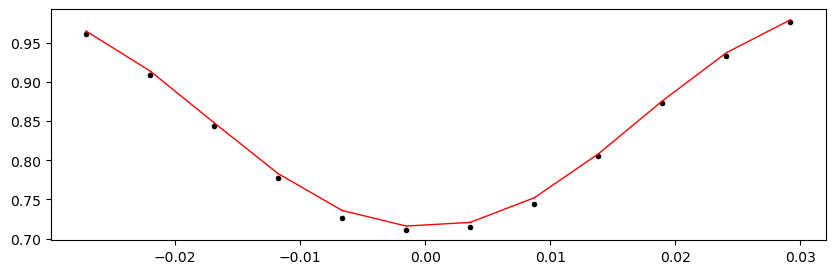

55743.670342 1.0072524836970236 -0.29206612180435276 0.17562742655042518


100%|██████████████████████████████████████████████████████| 10000/10000 [00:07<00:00, 1316.25it/s]


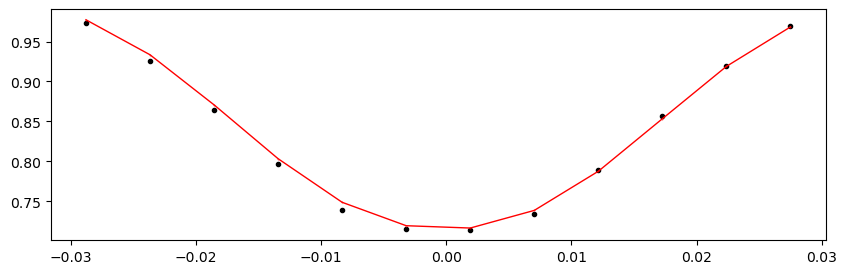

55747.661801999995 1.0072524836970236 -0.29206612180435276 0.17562742655042518


100%|██████████████████████████████████████████████████████| 10000/10000 [00:07<00:00, 1323.48it/s]


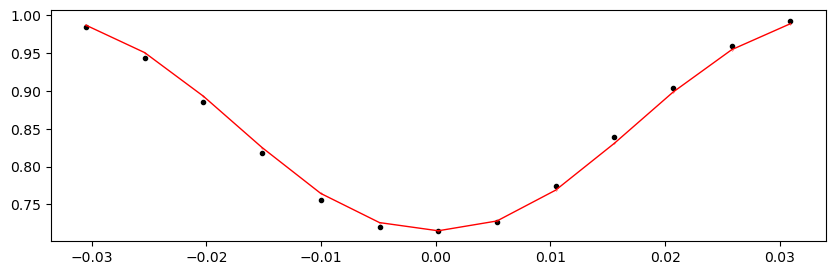

55751.653262 1.0072524836970236 -0.29206612180435276 0.17562742655042518


100%|██████████████████████████████████████████████████████| 10000/10000 [00:07<00:00, 1350.23it/s]


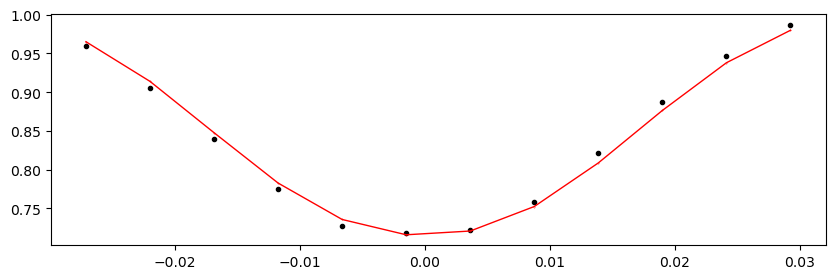

55755.644722 1.0072524836970236 -0.29206612180435276 0.17562742655042518


100%|██████████████████████████████████████████████████████| 10000/10000 [00:07<00:00, 1343.28it/s]


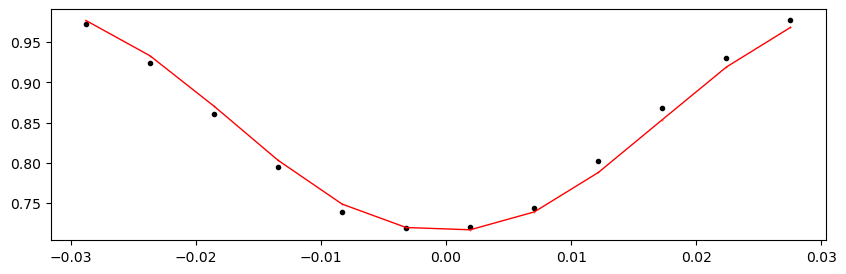

55759.636181999995 1.0072524836970236 -0.29206612180435276 0.17562742655042518


100%|██████████████████████████████████████████████████████| 10000/10000 [00:07<00:00, 1315.94it/s]


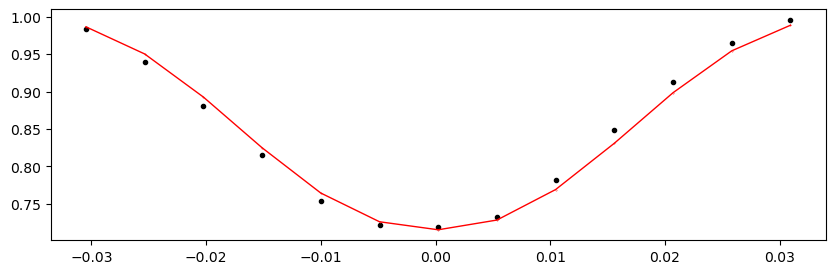

55763.627642 1.0072524836970236 -0.29206612180435276 0.17562742655042518


100%|██████████████████████████████████████████████████████| 10000/10000 [00:07<00:00, 1351.92it/s]


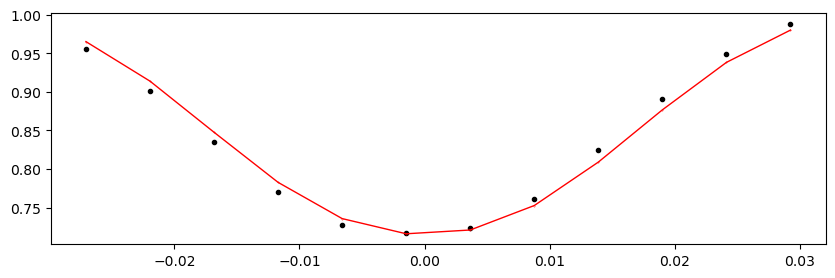

55767.619102 1.0072524836970236 -0.29206612180435276 0.17562742655042518


100%|██████████████████████████████████████████████████████| 10000/10000 [00:07<00:00, 1343.14it/s]


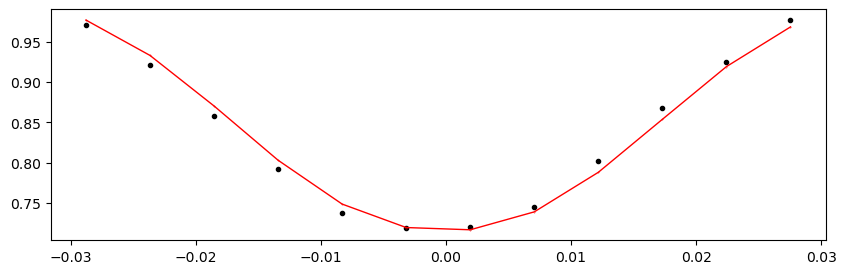

55771.610562 1.0072524836970236 -0.29206612180435276 0.17562742655042518


100%|██████████████████████████████████████████████████████| 10000/10000 [00:07<00:00, 1355.02it/s]


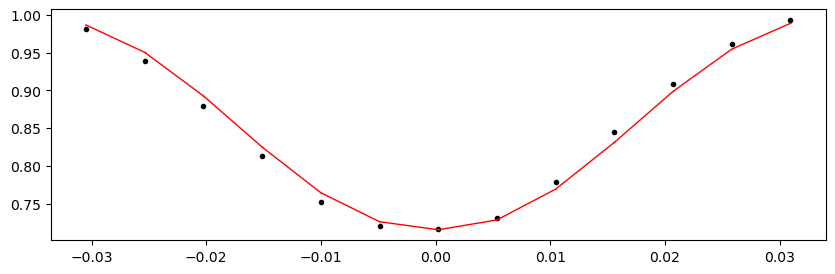

55775.602022 1.0072524836970236 -0.29206612180435276 0.17562742655042518


100%|██████████████████████████████████████████████████████| 10000/10000 [00:07<00:00, 1342.31it/s]


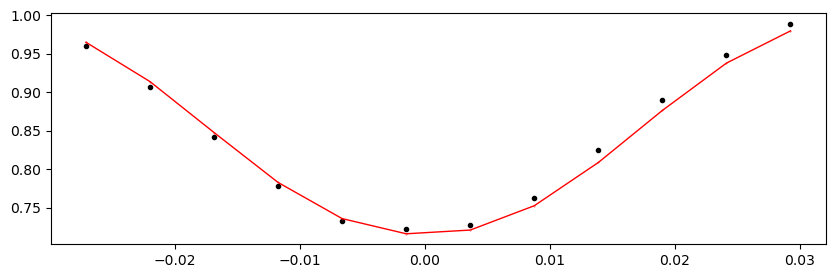

55779.593482 1.0072524836970236 -0.29206612180435276 0.17562742655042518


100%|██████████████████████████████████████████████████████| 10000/10000 [00:07<00:00, 1360.49it/s]


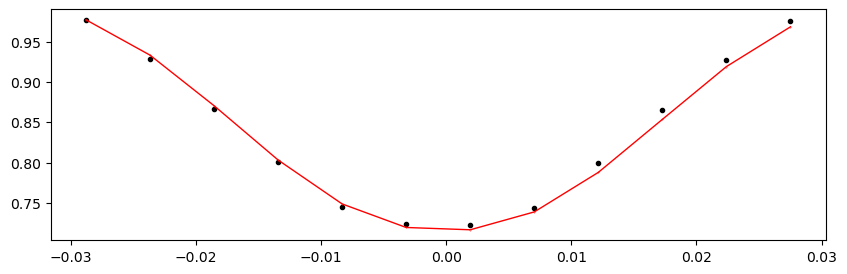

55783.584942 1.0072524836970236 -0.29206612180435276 0.17562742655042518


100%|██████████████████████████████████████████████████████| 10000/10000 [00:07<00:00, 1360.62it/s]


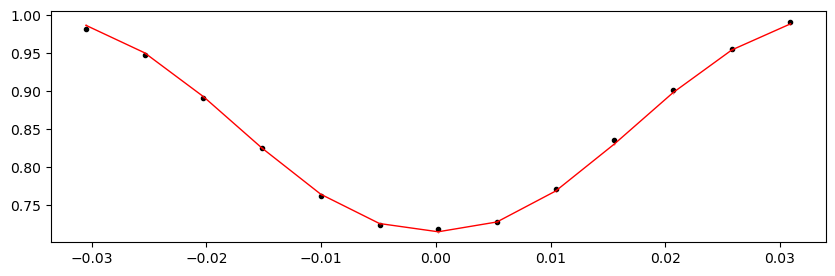

55787.576402 1.0072524836970236 -0.29206612180435276 0.17562742655042518


100%|██████████████████████████████████████████████████████| 10000/10000 [00:07<00:00, 1345.01it/s]


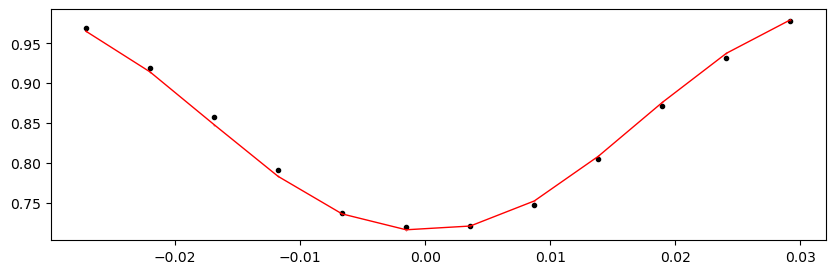

55791.567861999996 1.0072524836970236 -0.29206612180435276 0.17562742655042518


100%|██████████████████████████████████████████████████████| 10000/10000 [00:07<00:00, 1348.55it/s]


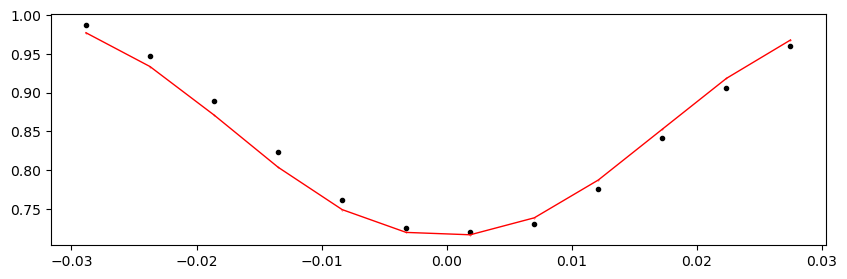

55795.559322 1.0072524836970236 -0.29206612180435276 0.17562742655042518


100%|██████████████████████████████████████████████████████| 10000/10000 [00:07<00:00, 1346.75it/s]


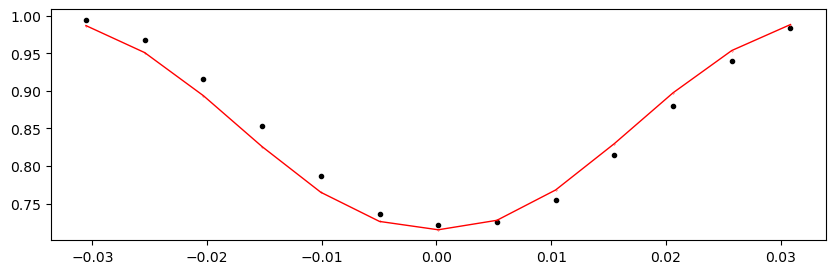

Fitting individual secondary eclipses...
Creating new manifest file
54967.336560897995 1.006183528031924 -0.22784046100458272 -0.322614588540863


  0%|                                                                    | 0/10000 [00:00<?, ?it/s]C:\pkg\_winNonPortables\miniforge3\envs\my_lk_plus\lib\site-packages\emcee\moves\red_blue.py:99: RuntimeWarning: invalid value encountered in scalar subtract
  lnpdiff = f + nlp - state.log_prob[j]
100%|██████████████████████████████████████████████████████| 10000/10000 [00:07<00:00, 1329.74it/s]


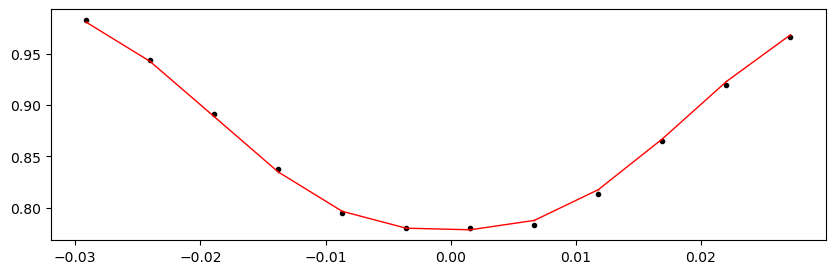

54971.32802089799 1.006183528031924 -0.22784046100458272 -0.322614588540863


100%|██████████████████████████████████████████████████████| 10000/10000 [00:07<00:00, 1349.56it/s]


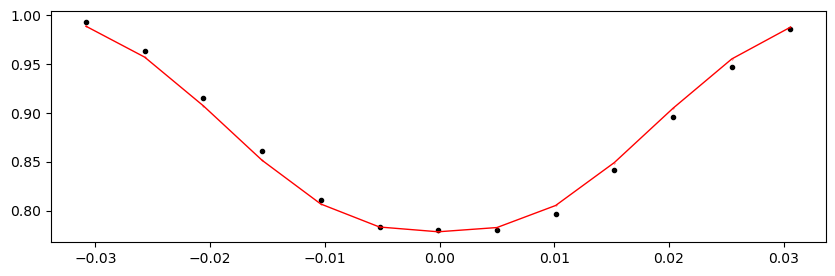

54975.319480898 1.006183528031924 -0.22784046100458272 -0.322614588540863


100%|██████████████████████████████████████████████████████| 10000/10000 [00:07<00:00, 1353.20it/s]


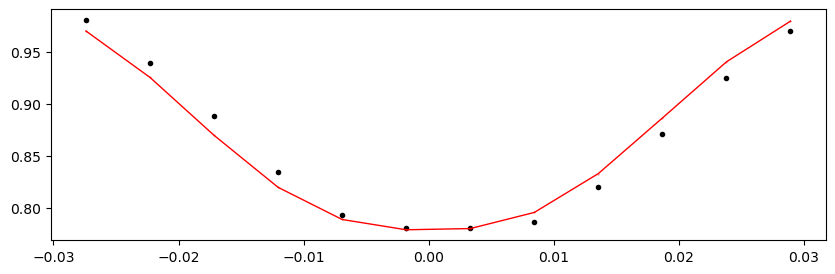

54979.310940897994 1.006183528031924 -0.22784046100458272 -0.322614588540863


100%|██████████████████████████████████████████████████████| 10000/10000 [00:07<00:00, 1355.97it/s]


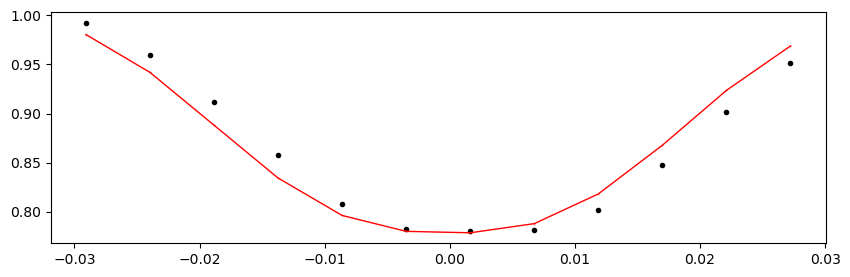

54983.30240089799 1.006183528031924 -0.22784046100458272 -0.322614588540863


100%|██████████████████████████████████████████████████████| 10000/10000 [00:07<00:00, 1357.80it/s]


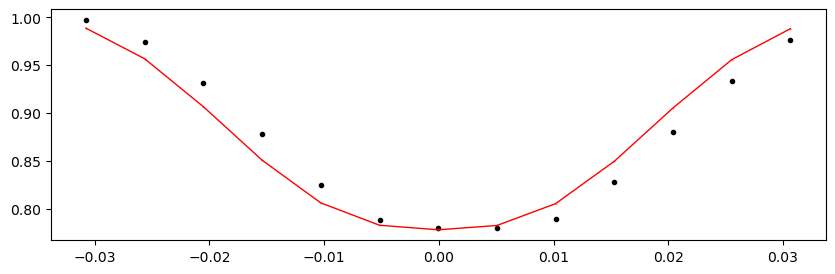

54987.293860898 1.006183528031924 -0.22784046100458272 -0.322614588540863


100%|██████████████████████████████████████████████████████| 10000/10000 [00:07<00:00, 1331.33it/s]


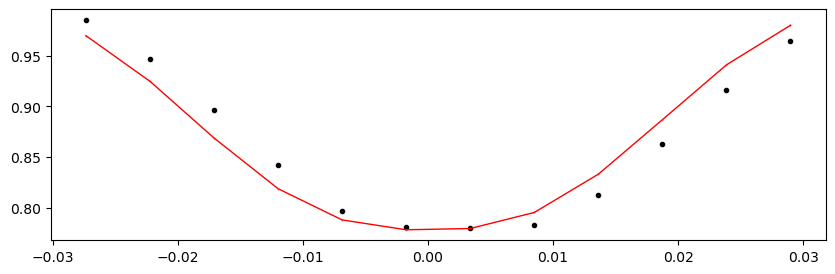

54991.285320897994 1.006183528031924 -0.22784046100458272 -0.322614588540863


100%|██████████████████████████████████████████████████████| 10000/10000 [00:07<00:00, 1341.09it/s]


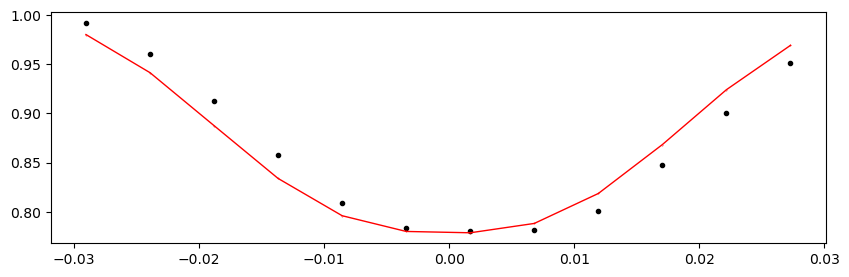

54995.27678089799 1.006183528031924 -0.22784046100458272 -0.322614588540863


100%|██████████████████████████████████████████████████████| 10000/10000 [00:07<00:00, 1348.44it/s]


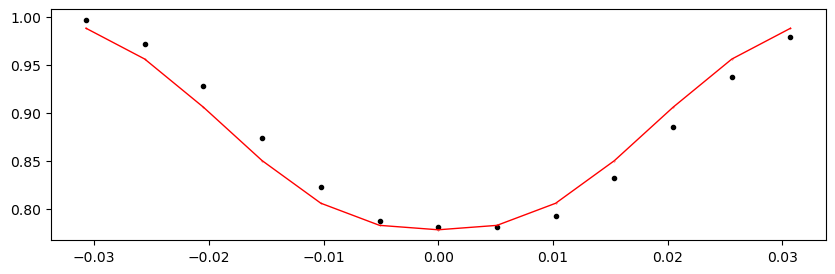

55003.259700897994 1.006183528031924 -0.22784046100458272 -0.322614588540863


100%|██████████████████████████████████████████████████████| 10000/10000 [00:07<00:00, 1331.56it/s]


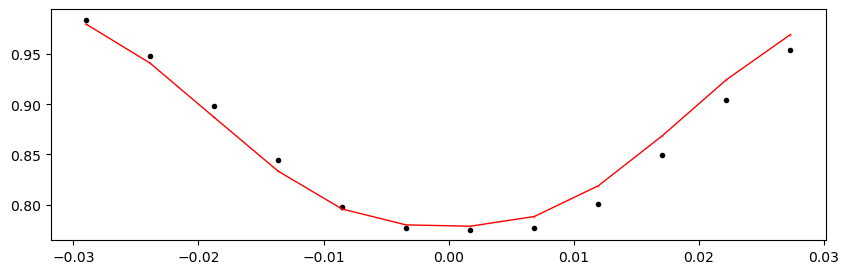

55007.25116089799 1.006183528031924 -0.22784046100458272 -0.322614588540863


100%|██████████████████████████████████████████████████████| 10000/10000 [00:07<00:00, 1349.42it/s]


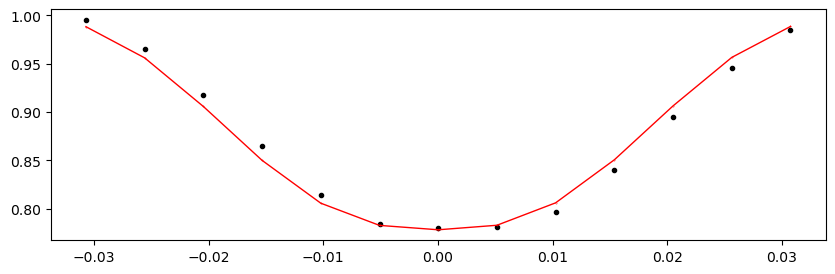

55011.242620897996 1.006183528031924 -0.22784046100458272 -0.322614588540863


100%|██████████████████████████████████████████████████████| 10000/10000 [00:07<00:00, 1345.99it/s]


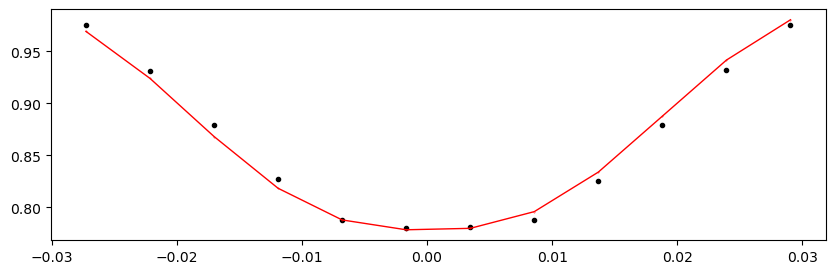

55019.225540898 1.006183528031924 -0.22784046100458272 -0.322614588540863


100%|██████████████████████████████████████████████████████| 10000/10000 [00:07<00:00, 1348.63it/s]


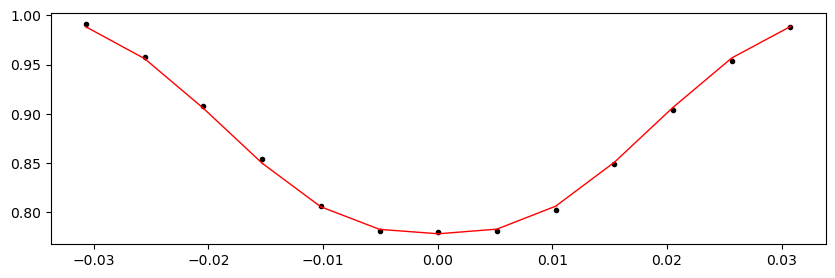

55023.217000897996 1.006183528031924 -0.22784046100458272 -0.322614588540863


100%|██████████████████████████████████████████████████████| 10000/10000 [00:07<00:00, 1351.19it/s]


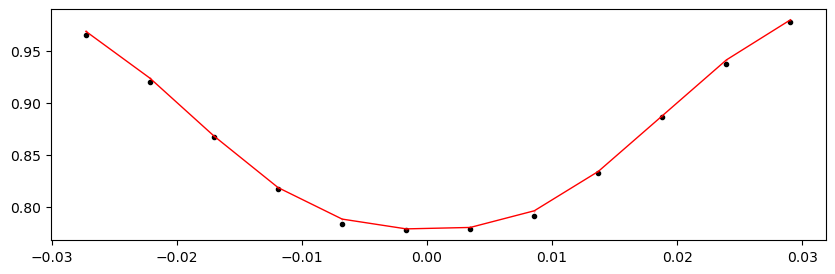

55027.20846089799 1.006183528031924 -0.22784046100458272 -0.322614588540863


100%|██████████████████████████████████████████████████████| 10000/10000 [00:07<00:00, 1349.83it/s]


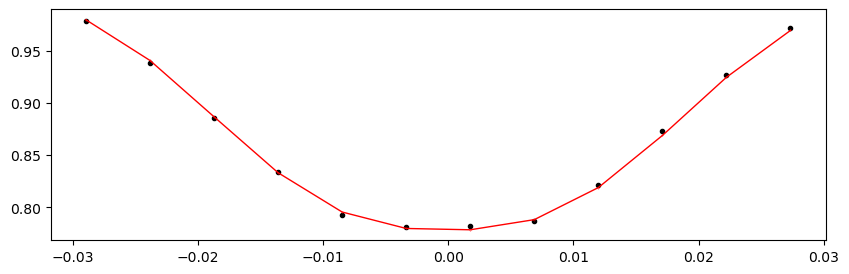

55031.199920898 1.006183528031924 -0.22784046100458272 -0.322614588540863


100%|██████████████████████████████████████████████████████| 10000/10000 [00:07<00:00, 1325.36it/s]


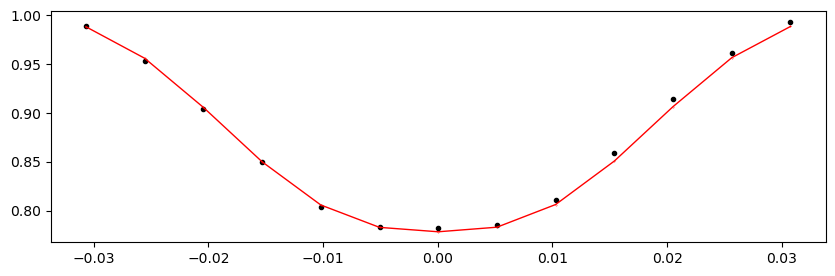

55035.191380897995 1.006183528031924 -0.22784046100458272 -0.322614588540863


100%|██████████████████████████████████████████████████████| 10000/10000 [00:07<00:00, 1343.18it/s]


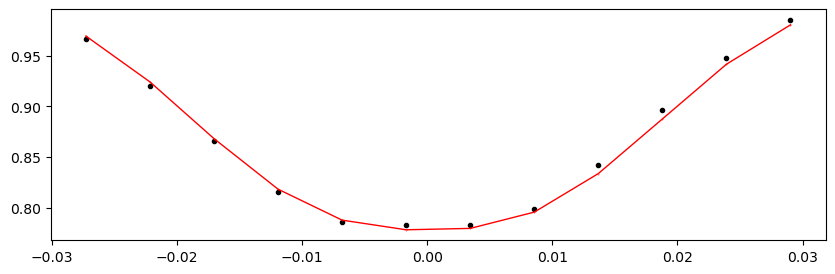

55039.18284089799 1.006183528031924 -0.22784046100458272 -0.322614588540863


100%|██████████████████████████████████████████████████████| 10000/10000 [00:07<00:00, 1340.42it/s]


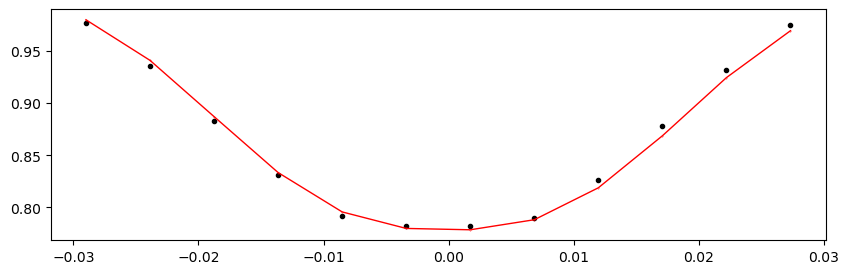

55043.174300898 1.006183528031924 -0.22784046100458272 -0.322614588540863


100%|██████████████████████████████████████████████████████| 10000/10000 [00:07<00:00, 1324.64it/s]


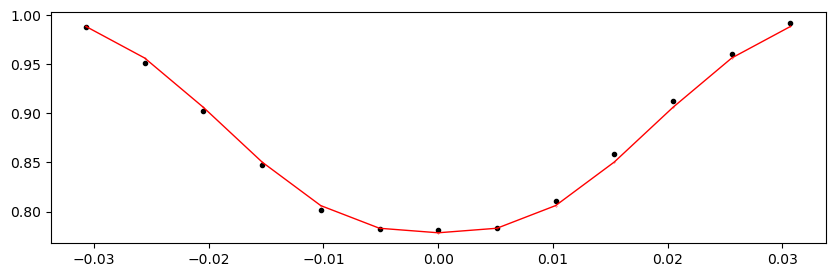

55047.165760897995 1.006183528031924 -0.22784046100458272 -0.322614588540863


100%|██████████████████████████████████████████████████████| 10000/10000 [00:07<00:00, 1359.60it/s]


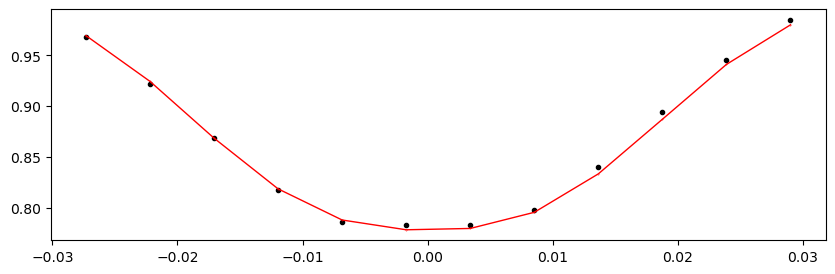

55051.15722089799 1.006183528031924 -0.22784046100458272 -0.322614588540863


100%|██████████████████████████████████████████████████████| 10000/10000 [00:07<00:00, 1351.16it/s]


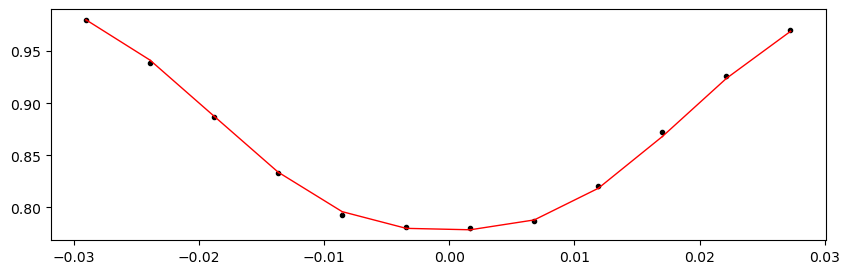

55055.148680898 1.006183528031924 -0.22784046100458272 -0.322614588540863


100%|██████████████████████████████████████████████████████| 10000/10000 [00:07<00:00, 1353.56it/s]


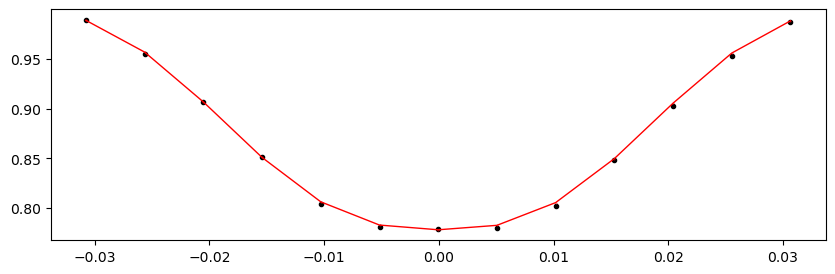

55059.140140897995 1.006183528031924 -0.22784046100458272 -0.322614588540863


100%|██████████████████████████████████████████████████████| 10000/10000 [00:07<00:00, 1366.13it/s]


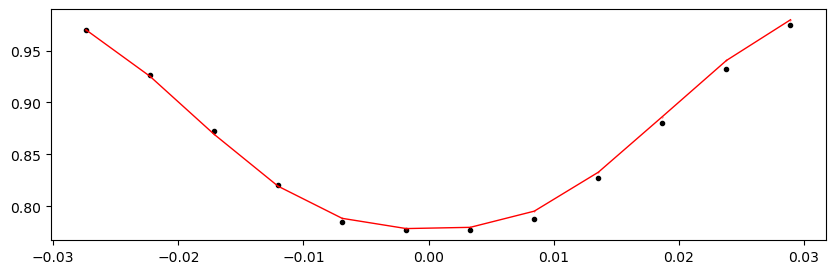

55067.123060898 1.006183528031924 -0.22784046100458272 -0.322614588540863


100%|██████████████████████████████████████████████████████| 10000/10000 [00:07<00:00, 1340.15it/s]


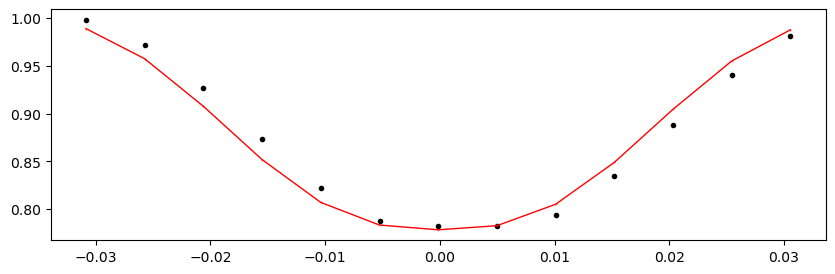

55071.114520897994 1.006183528031924 -0.22784046100458272 -0.322614588540863


100%|██████████████████████████████████████████████████████| 10000/10000 [00:07<00:00, 1295.19it/s]


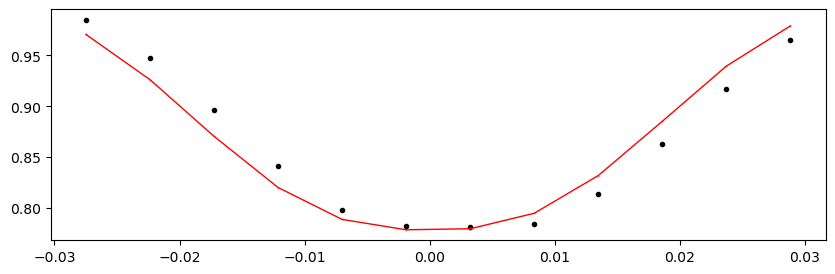

55075.10598089799 1.006183528031924 -0.22784046100458272 -0.322614588540863


100%|██████████████████████████████████████████████████████| 10000/10000 [00:07<00:00, 1342.76it/s]


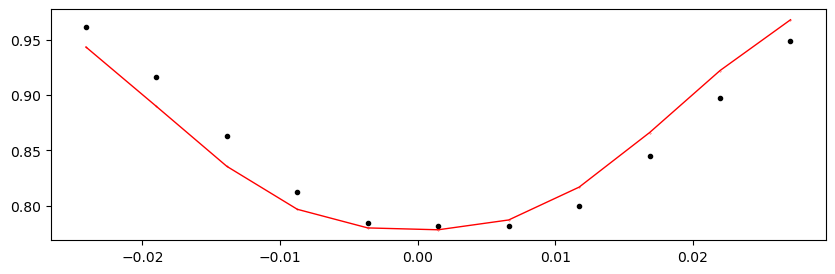

55079.097440898 1.006183528031924 -0.22784046100458272 -0.322614588540863


100%|██████████████████████████████████████████████████████| 10000/10000 [00:07<00:00, 1350.44it/s]


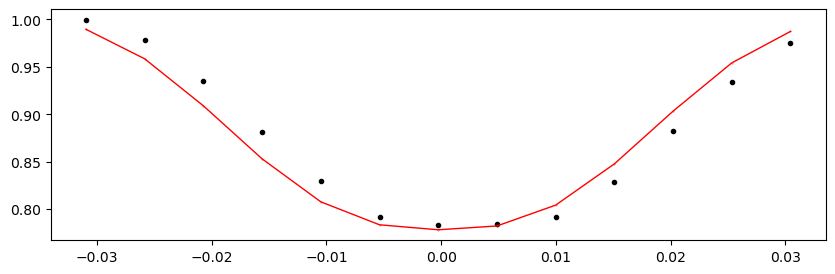

55083.088900897994 1.006183528031924 -0.22784046100458272 -0.322614588540863


100%|██████████████████████████████████████████████████████| 10000/10000 [00:07<00:00, 1274.65it/s]


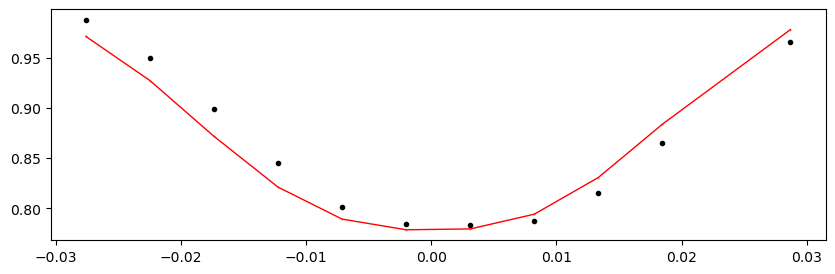

55087.08036089799 1.006183528031924 -0.22784046100458272 -0.322614588540863


100%|██████████████████████████████████████████████████████| 10000/10000 [00:07<00:00, 1345.94it/s]


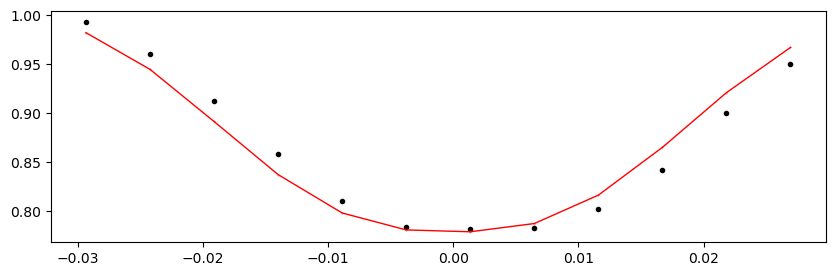

Time 55091.071820897996 does not have enough data points: 2
55095.06328089799 1.006183528031924 -0.22784046100458272 -0.322614588540863


100%|██████████████████████████████████████████████████████| 10000/10000 [00:07<00:00, 1367.94it/s]


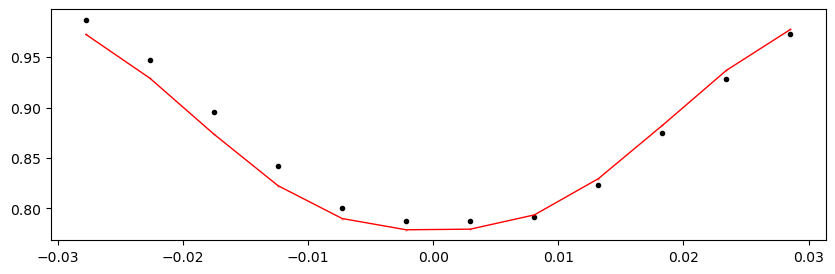

55099.054740898 1.006183528031924 -0.22784046100458272 -0.322614588540863


100%|██████████████████████████████████████████████████████| 10000/10000 [00:07<00:00, 1338.96it/s]


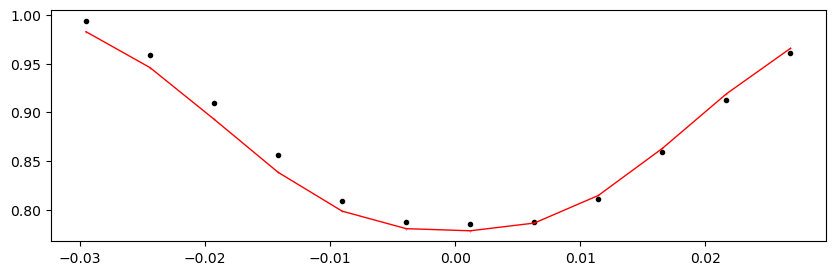

55103.046200897996 1.006183528031924 -0.22784046100458272 -0.322614588540863


100%|██████████████████████████████████████████████████████| 10000/10000 [00:07<00:00, 1346.33it/s]


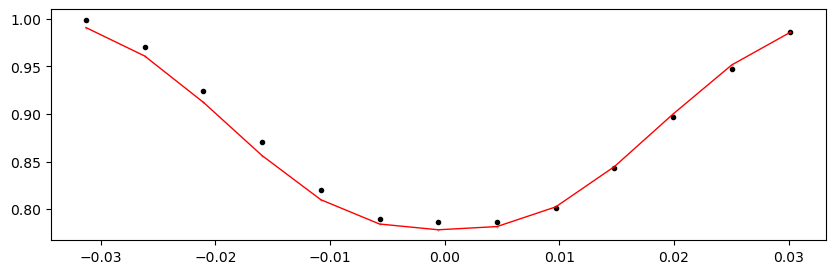

55107.03766089799 1.006183528031924 -0.22784046100458272 -0.322614588540863


100%|██████████████████████████████████████████████████████| 10000/10000 [00:07<00:00, 1355.67it/s]


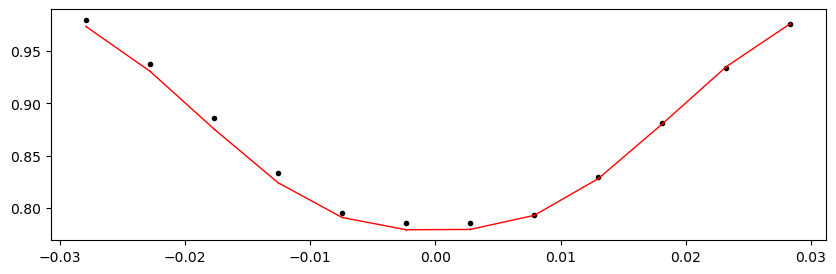

55111.029120898 1.006183528031924 -0.22784046100458272 -0.322614588540863


100%|██████████████████████████████████████████████████████| 10000/10000 [00:07<00:00, 1353.76it/s]


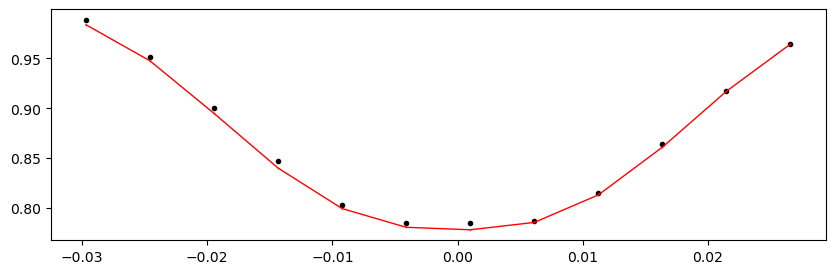

55115.020580897995 1.006183528031924 -0.22784046100458272 -0.322614588540863


100%|██████████████████████████████████████████████████████| 10000/10000 [00:07<00:00, 1355.91it/s]


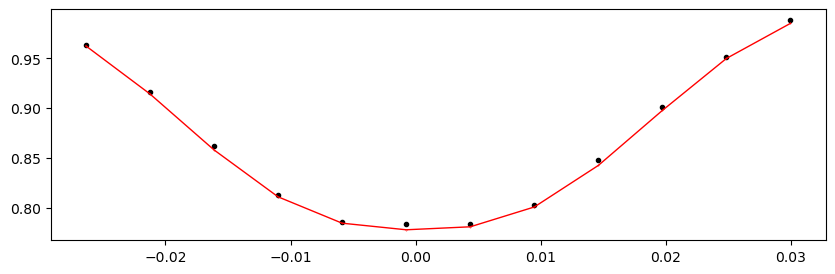

55119.01204089799 1.006183528031924 -0.22784046100458272 -0.322614588540863


100%|██████████████████████████████████████████████████████| 10000/10000 [00:07<00:00, 1360.97it/s]


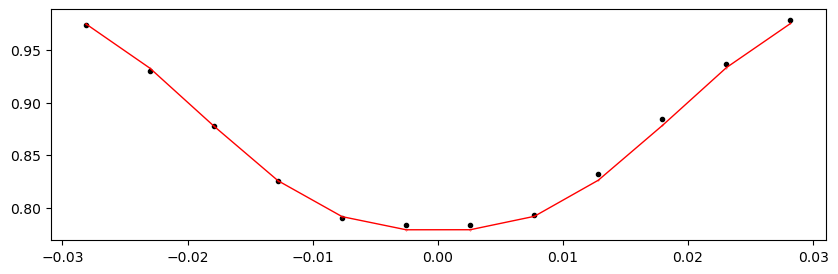

Time 55123.003500898 does not have enough data points: 8
55126.994960897995 1.006183528031924 -0.22784046100458272 -0.322614588540863


100%|██████████████████████████████████████████████████████| 10000/10000 [00:07<00:00, 1359.32it/s]


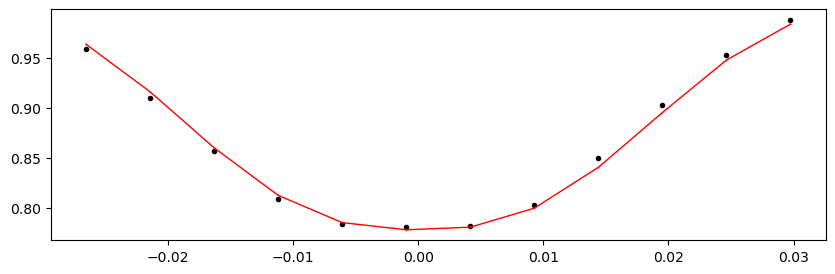

55130.98642089799 1.006183528031924 -0.22784046100458272 -0.322614588540863


100%|██████████████████████████████████████████████████████| 10000/10000 [00:07<00:00, 1363.98it/s]


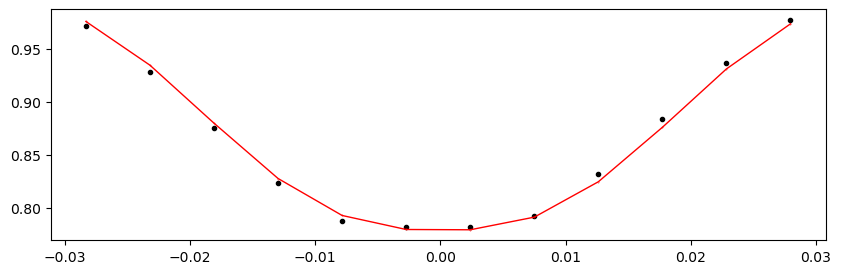

55134.977880898 1.006183528031924 -0.22784046100458272 -0.322614588540863


100%|██████████████████████████████████████████████████████| 10000/10000 [00:07<00:00, 1354.60it/s]


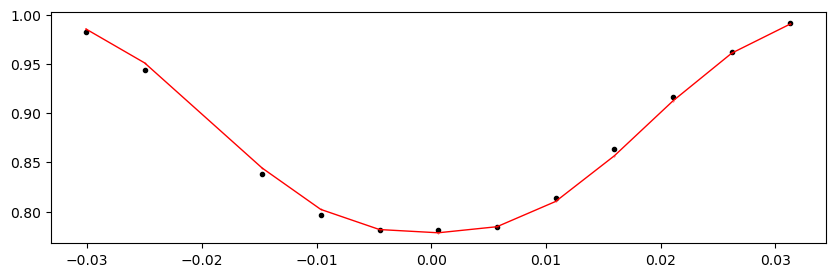

55138.969340897995 1.006183528031924 -0.22784046100458272 -0.322614588540863


100%|██████████████████████████████████████████████████████| 10000/10000 [00:07<00:00, 1351.04it/s]


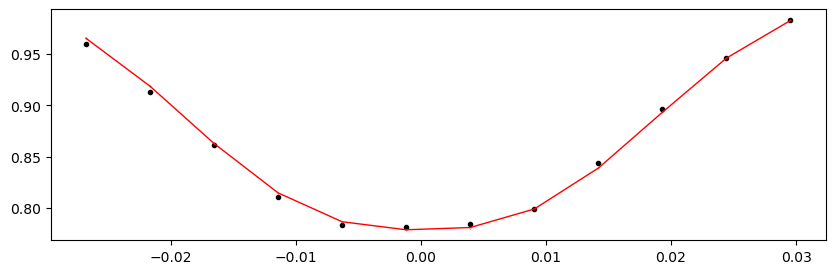

55142.96080089799 1.006183528031924 -0.22784046100458272 -0.322614588540863


100%|██████████████████████████████████████████████████████| 10000/10000 [00:07<00:00, 1351.08it/s]


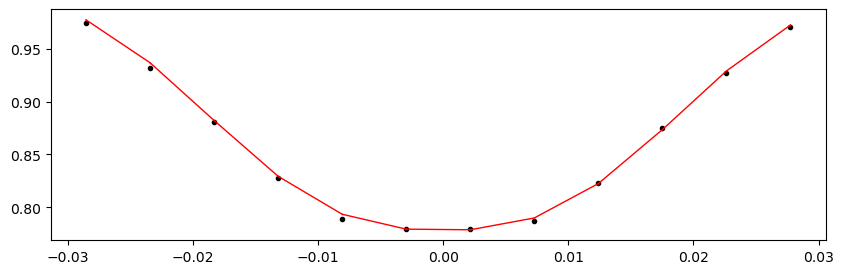

55146.952260898 1.006183528031924 -0.22784046100458272 -0.322614588540863


100%|██████████████████████████████████████████████████████| 10000/10000 [00:07<00:00, 1350.01it/s]


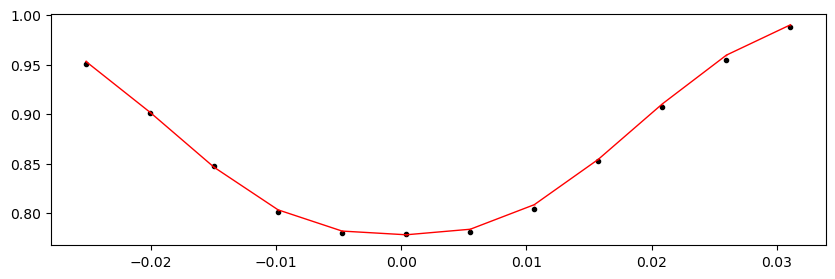

55150.943720897994 1.006183528031924 -0.22784046100458272 -0.322614588540863


100%|██████████████████████████████████████████████████████| 10000/10000 [00:07<00:00, 1359.15it/s]


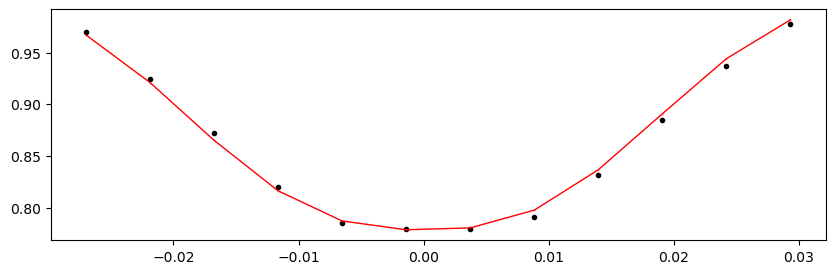

55158.926640898 1.006183528031924 -0.22784046100458272 -0.322614588540863


100%|██████████████████████████████████████████████████████| 10000/10000 [00:07<00:00, 1336.61it/s]


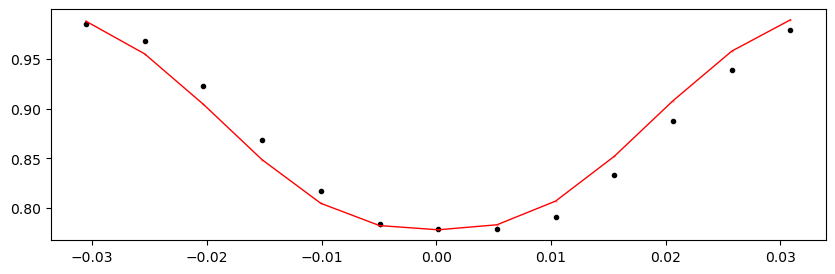

55162.918100897994 1.006183528031924 -0.22784046100458272 -0.322614588540863


100%|██████████████████████████████████████████████████████| 10000/10000 [00:07<00:00, 1340.83it/s]


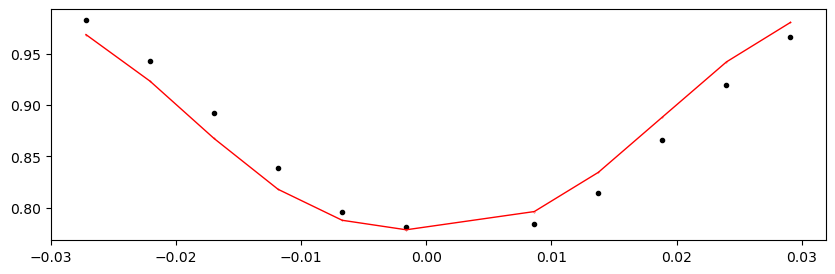

55166.90956089799 1.006183528031924 -0.22784046100458272 -0.322614588540863


100%|██████████████████████████████████████████████████████| 10000/10000 [00:07<00:00, 1366.93it/s]


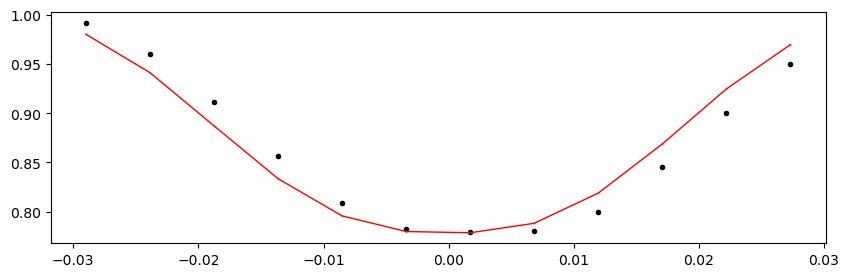

55170.901020897996 1.006183528031924 -0.22784046100458272 -0.322614588540863


100%|██████████████████████████████████████████████████████| 10000/10000 [00:07<00:00, 1350.25it/s]


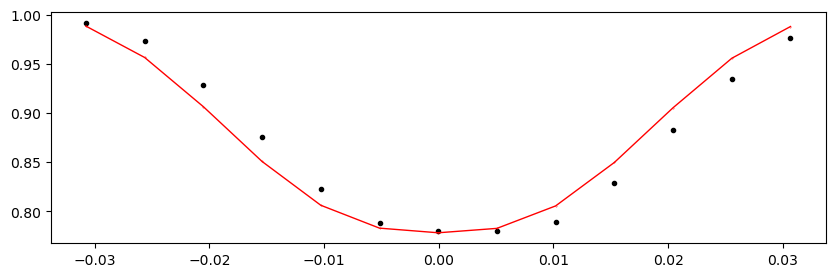

55174.892480897994 1.006183528031924 -0.22784046100458272 -0.322614588540863


100%|██████████████████████████████████████████████████████| 10000/10000 [00:07<00:00, 1353.04it/s]


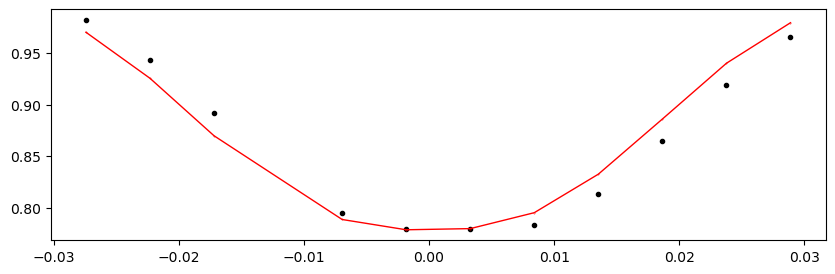

55178.883940898 1.006183528031924 -0.22784046100458272 -0.322614588540863


100%|██████████████████████████████████████████████████████| 10000/10000 [00:07<00:00, 1380.39it/s]


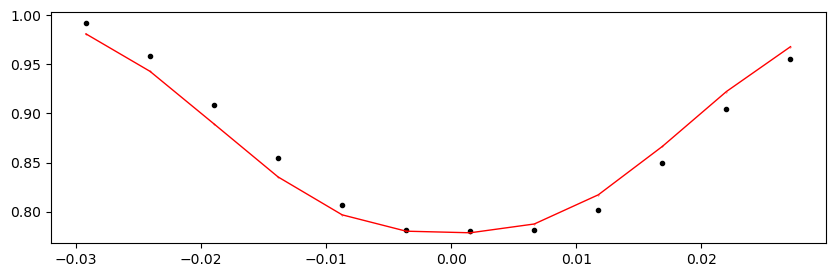

55186.86686089799 1.006183528031924 -0.22784046100458272 -0.322614588540863


100%|██████████████████████████████████████████████████████| 10000/10000 [00:07<00:00, 1358.81it/s]


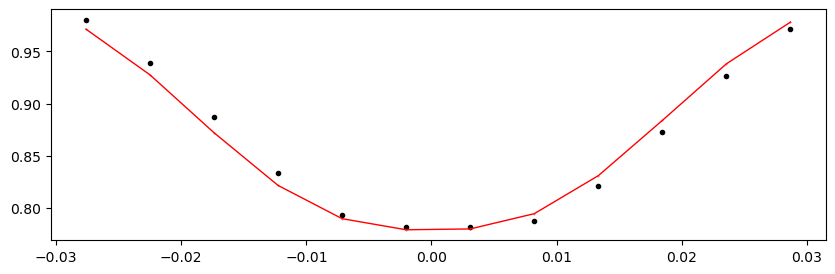

55190.858320898 1.006183528031924 -0.22784046100458272 -0.322614588540863


100%|██████████████████████████████████████████████████████| 10000/10000 [00:07<00:00, 1373.73it/s]


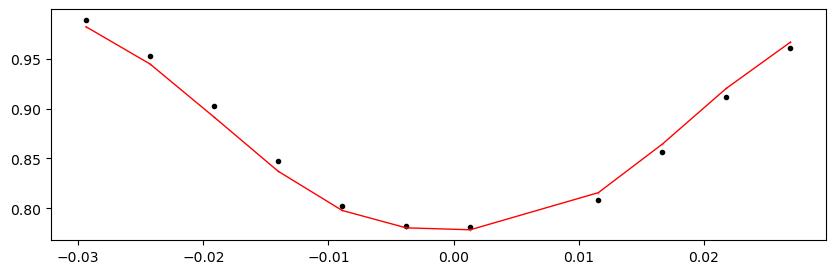

55194.849780897996 1.006183528031924 -0.22784046100458272 -0.322614588540863


100%|██████████████████████████████████████████████████████| 10000/10000 [00:07<00:00, 1352.59it/s]


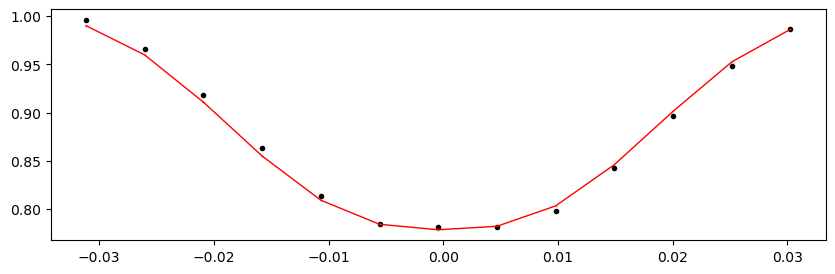

55198.84124089799 1.006183528031924 -0.22784046100458272 -0.322614588540863


100%|██████████████████████████████████████████████████████| 10000/10000 [00:07<00:00, 1365.65it/s]


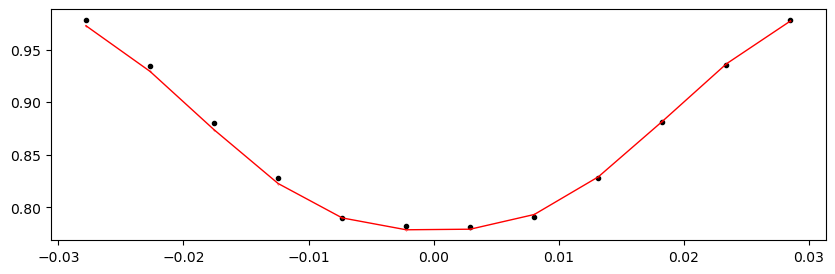

55202.832700898 1.006183528031924 -0.22784046100458272 -0.322614588540863


100%|██████████████████████████████████████████████████████| 10000/10000 [00:07<00:00, 1363.06it/s]


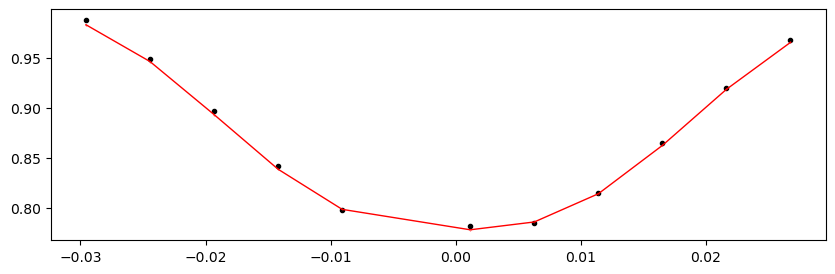

55206.824160897995 1.006183528031924 -0.22784046100458272 -0.322614588540863


100%|██████████████████████████████████████████████████████| 10000/10000 [00:07<00:00, 1356.63it/s]


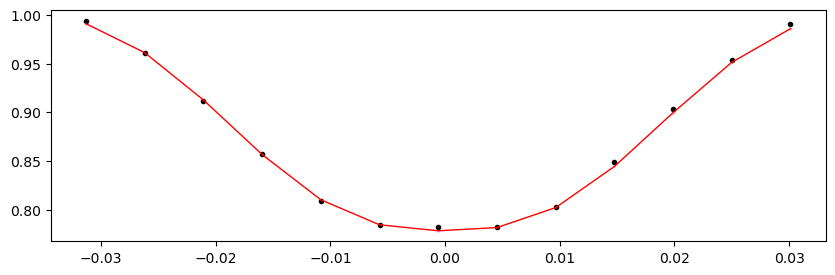

55210.81562089799 1.006183528031924 -0.22784046100458272 -0.322614588540863


100%|██████████████████████████████████████████████████████| 10000/10000 [00:07<00:00, 1334.00it/s]


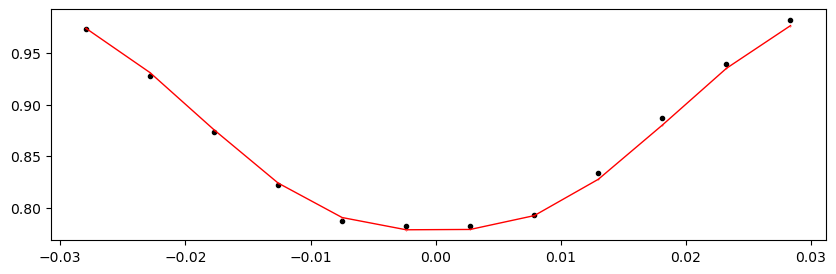

55214.807080898 1.006183528031924 -0.22784046100458272 -0.322614588540863


100%|██████████████████████████████████████████████████████| 10000/10000 [00:07<00:00, 1343.75it/s]


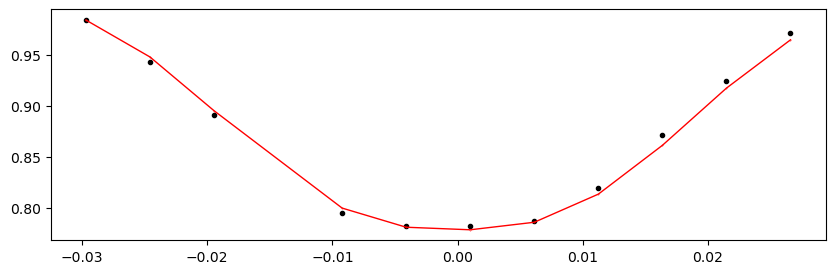

55218.798540897995 1.006183528031924 -0.22784046100458272 -0.322614588540863


100%|██████████████████████████████████████████████████████| 10000/10000 [00:07<00:00, 1346.84it/s]


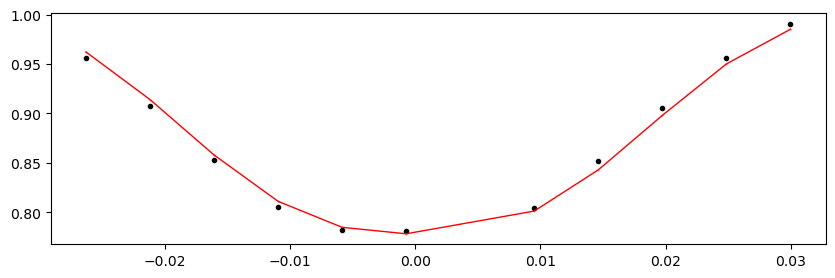

55222.79000089799 1.006183528031924 -0.22784046100458272 -0.322614588540863


100%|██████████████████████████████████████████████████████| 10000/10000 [00:07<00:00, 1354.86it/s]


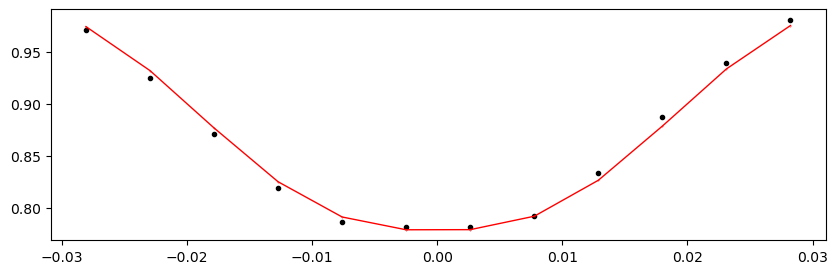

55226.781460898 1.006183528031924 -0.22784046100458272 -0.322614588540863


100%|██████████████████████████████████████████████████████| 10000/10000 [00:07<00:00, 1351.37it/s]


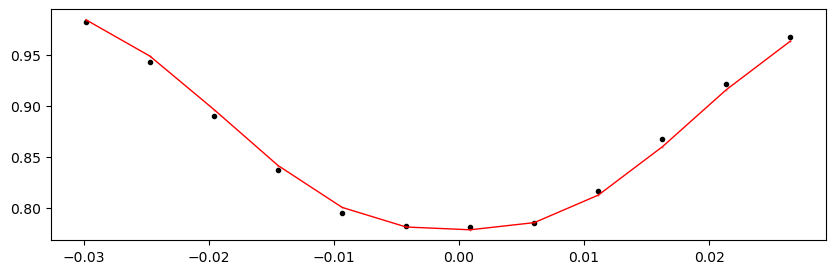

55234.76438089799 1.006183528031924 -0.22784046100458272 -0.322614588540863


100%|██████████████████████████████████████████████████████| 10000/10000 [00:07<00:00, 1326.30it/s]


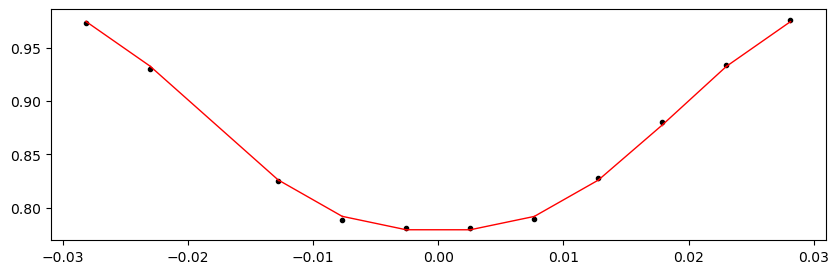

55238.755840898 1.006183528031924 -0.22784046100458272 -0.322614588540863


100%|██████████████████████████████████████████████████████| 10000/10000 [00:07<00:00, 1361.37it/s]


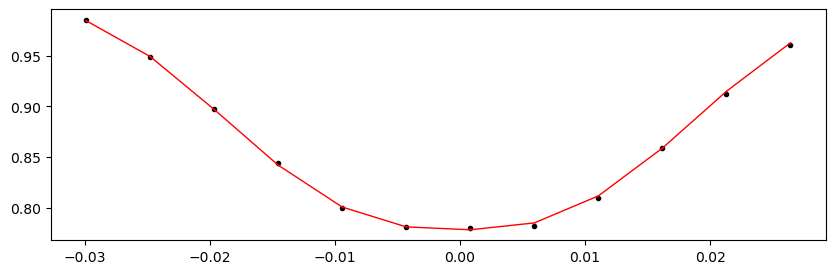

55242.747300897994 1.006183528031924 -0.22784046100458272 -0.322614588540863


100%|██████████████████████████████████████████████████████| 10000/10000 [00:07<00:00, 1346.18it/s]


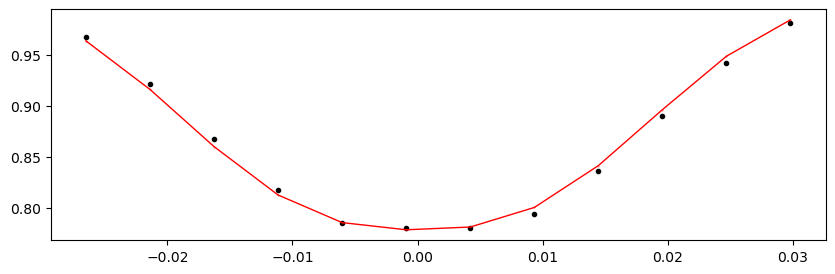

55246.73876089799 1.006183528031924 -0.22784046100458272 -0.322614588540863


100%|██████████████████████████████████████████████████████| 10000/10000 [00:07<00:00, 1358.64it/s]


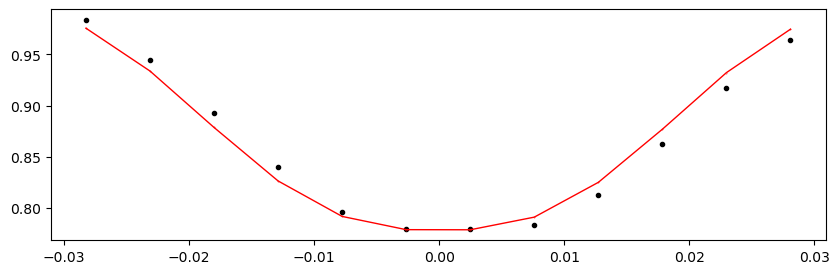

55250.730220897996 1.006183528031924 -0.22784046100458272 -0.322614588540863


100%|██████████████████████████████████████████████████████| 10000/10000 [00:07<00:00, 1342.07it/s]


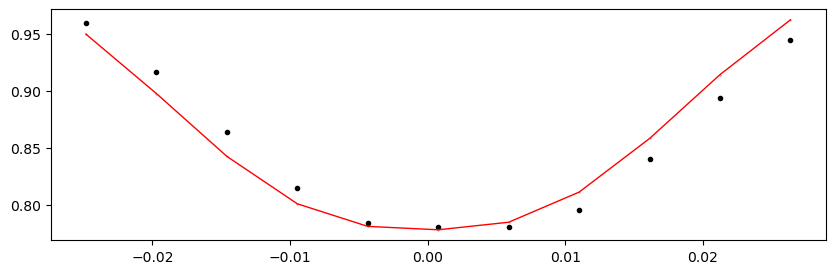

55254.721680897994 1.006183528031924 -0.22784046100458272 -0.322614588540863


100%|██████████████████████████████████████████████████████| 10000/10000 [00:07<00:00, 1330.84it/s]


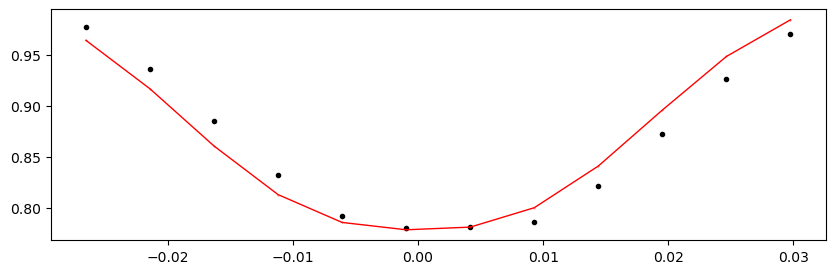

55258.71314089799 1.006183528031924 -0.22784046100458272 -0.322614588540863


100%|██████████████████████████████████████████████████████| 10000/10000 [00:07<00:00, 1358.55it/s]


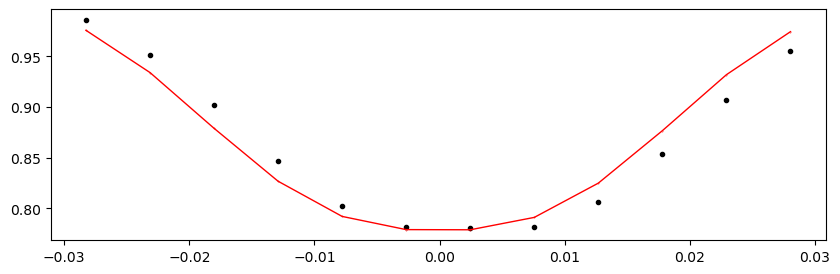

55262.704600897996 1.006183528031924 -0.22784046100458272 -0.322614588540863


100%|██████████████████████████████████████████████████████| 10000/10000 [00:07<00:00, 1354.63it/s]


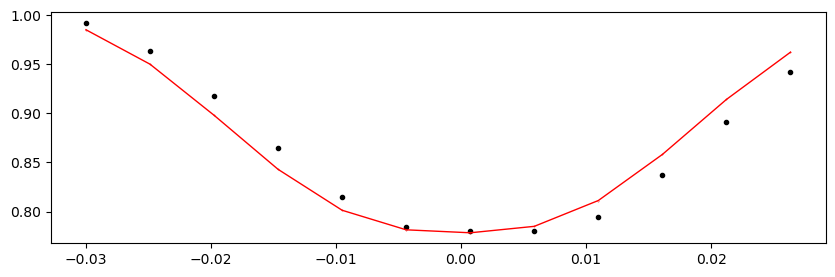

55266.69606089799 1.006183528031924 -0.22784046100458272 -0.322614588540863


100%|██████████████████████████████████████████████████████| 10000/10000 [00:07<00:00, 1346.21it/s]


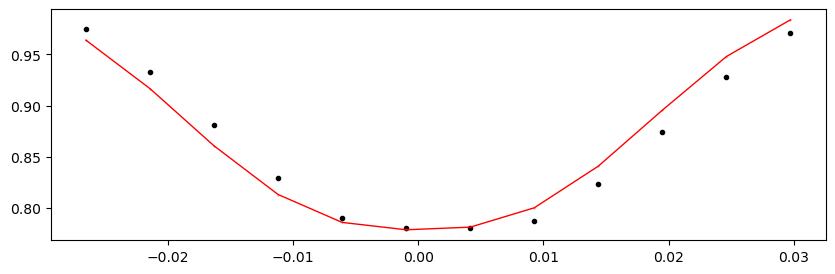

55270.687520898 1.006183528031924 -0.22784046100458272 -0.322614588540863


100%|██████████████████████████████████████████████████████| 10000/10000 [00:07<00:00, 1359.17it/s]


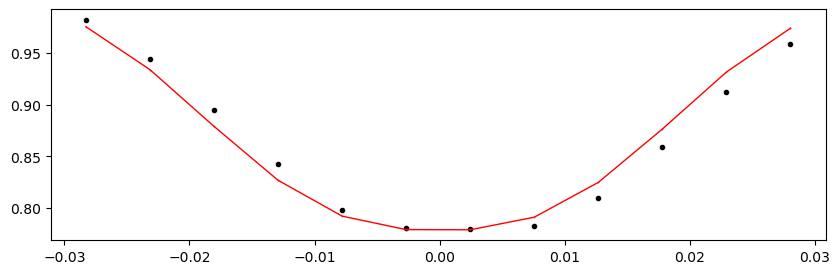

Time 55274.678980897996 does not have enough data points: 8
55278.67044089799 1.006183528031924 -0.22784046100458272 -0.322614588540863


100%|██████████████████████████████████████████████████████| 10000/10000 [00:07<00:00, 1352.56it/s]


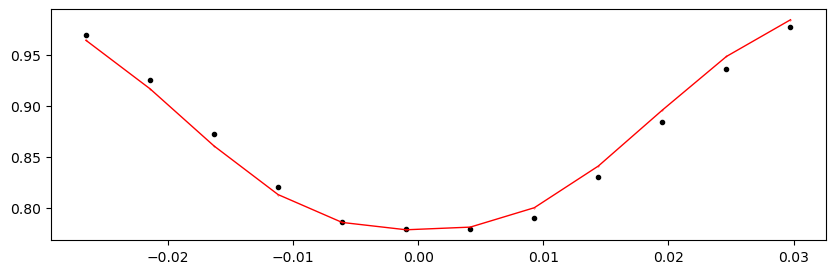

55282.661900898 1.006183528031924 -0.22784046100458272 -0.322614588540863


100%|██████████████████████████████████████████████████████| 10000/10000 [00:07<00:00, 1358.40it/s]


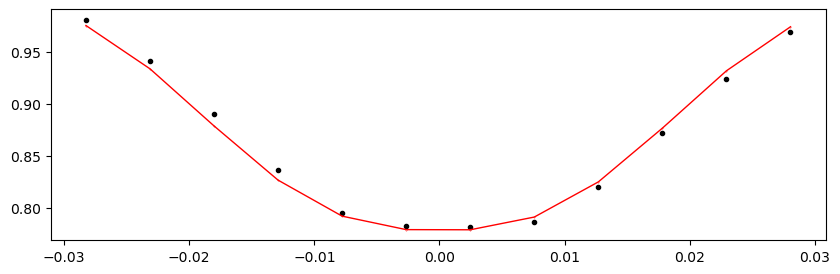

55286.653360897995 1.006183528031924 -0.22784046100458272 -0.322614588540863


100%|██████████████████████████████████████████████████████| 10000/10000 [00:07<00:00, 1356.80it/s]


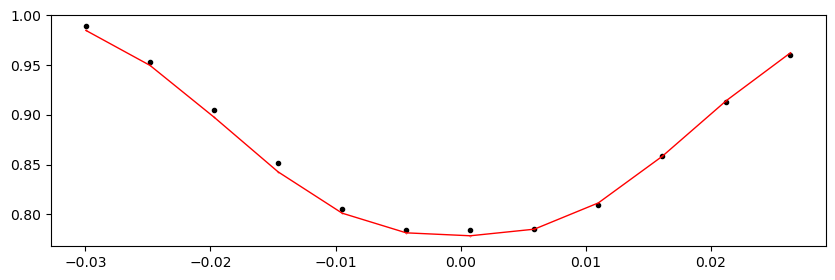

55290.64482089799 1.006183528031924 -0.22784046100458272 -0.322614588540863


100%|██████████████████████████████████████████████████████| 10000/10000 [00:07<00:00, 1358.45it/s]


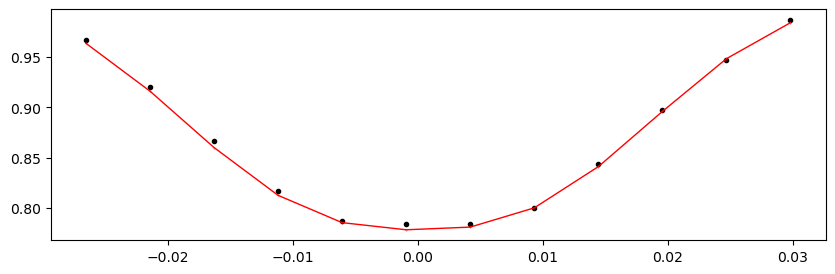

55294.636280898 1.006183528031924 -0.22784046100458272 -0.322614588540863


100%|██████████████████████████████████████████████████████| 10000/10000 [00:07<00:00, 1352.84it/s]


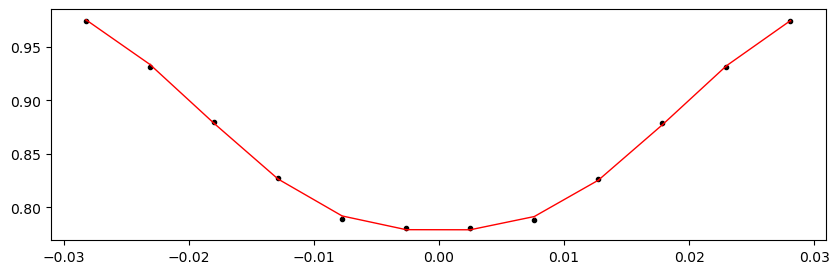

55298.627740897995 1.006183528031924 -0.22784046100458272 -0.322614588540863


100%|██████████████████████████████████████████████████████| 10000/10000 [00:07<00:00, 1366.13it/s]


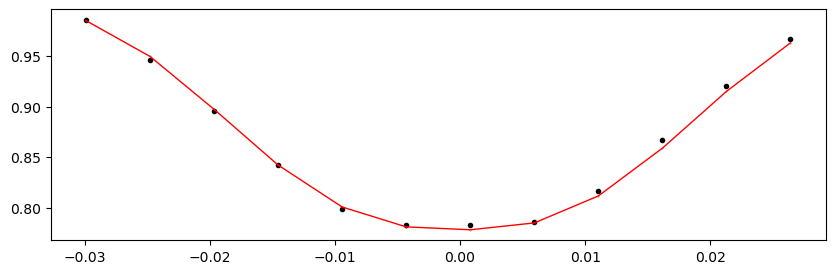

55302.61920089799 1.006183528031924 -0.22784046100458272 -0.322614588540863


100%|██████████████████████████████████████████████████████| 10000/10000 [00:07<00:00, 1350.73it/s]


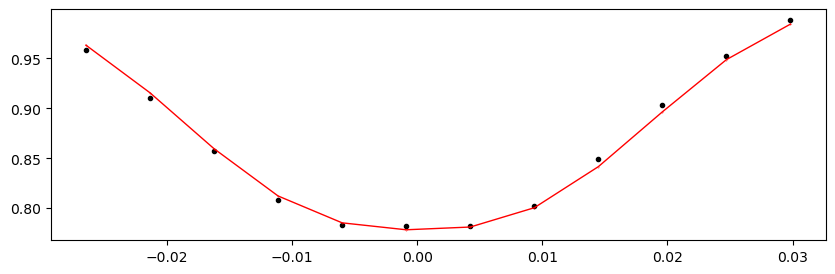

55306.610660898 1.006183528031924 -0.22784046100458272 -0.322614588540863


100%|██████████████████████████████████████████████████████| 10000/10000 [00:07<00:00, 1347.92it/s]


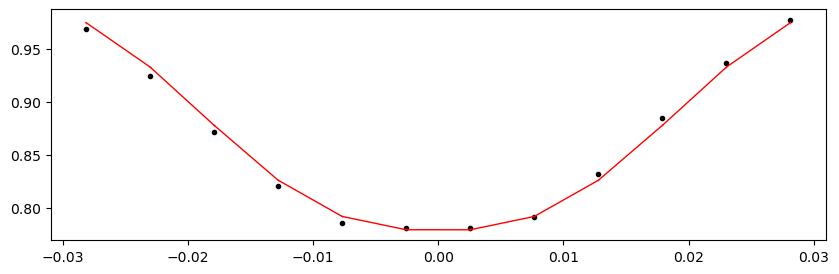

55310.602120897995 1.006183528031924 -0.22784046100458272 -0.322614588540863


100%|██████████████████████████████████████████████████████| 10000/10000 [00:07<00:00, 1353.10it/s]


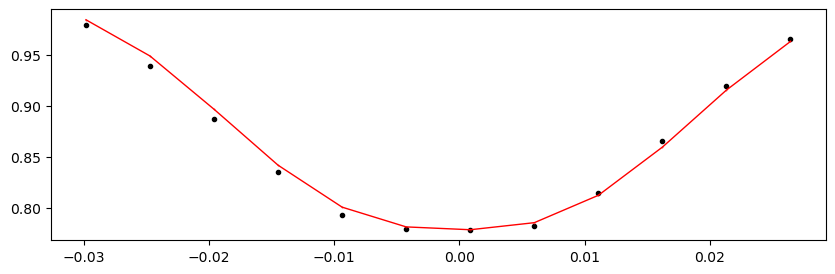

55314.59358089799 1.006183528031924 -0.22784046100458272 -0.322614588540863


100%|██████████████████████████████████████████████████████| 10000/10000 [00:07<00:00, 1355.93it/s]


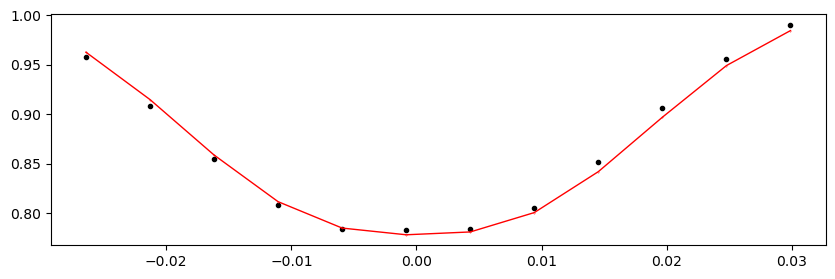

55318.585040898 1.006183528031924 -0.22784046100458272 -0.322614588540863


100%|██████████████████████████████████████████████████████| 10000/10000 [00:07<00:00, 1364.72it/s]


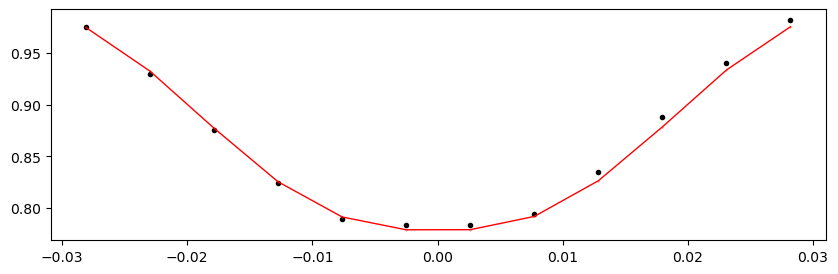

55322.576500897994 1.006183528031924 -0.22784046100458272 -0.322614588540863


100%|██████████████████████████████████████████████████████| 10000/10000 [00:07<00:00, 1367.13it/s]


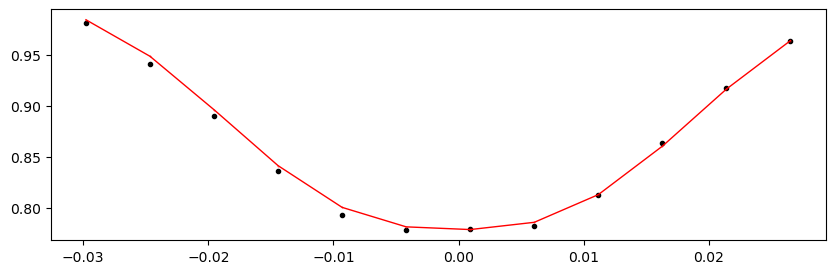

55326.56796089799 1.006183528031924 -0.22784046100458272 -0.322614588540863


100%|██████████████████████████████████████████████████████| 10000/10000 [00:07<00:00, 1360.27it/s]


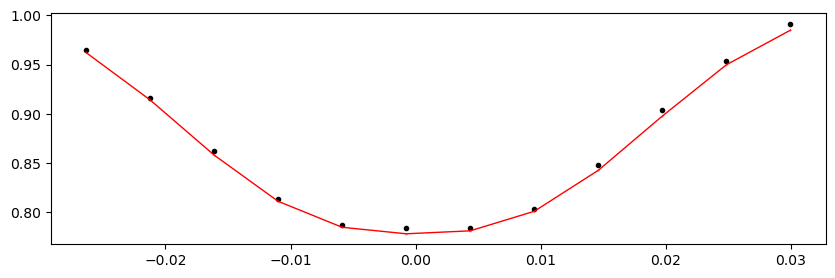

55330.559420898 1.006183528031924 -0.22784046100458272 -0.322614588540863


100%|██████████████████████████████████████████████████████| 10000/10000 [00:07<00:00, 1359.68it/s]


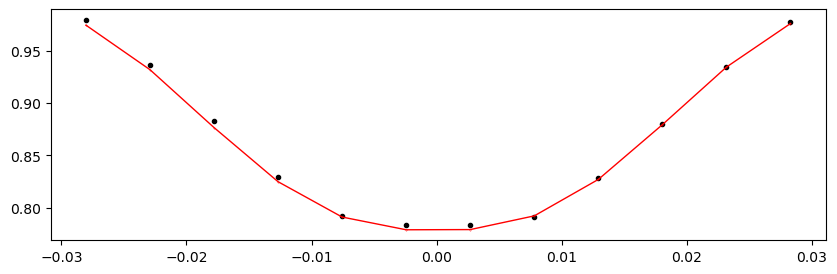

55334.550880897994 1.006183528031924 -0.22784046100458272 -0.322614588540863


100%|██████████████████████████████████████████████████████| 10000/10000 [00:07<00:00, 1358.52it/s]


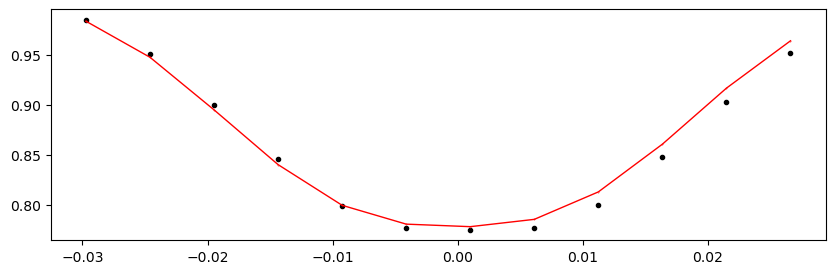

55338.54234089799 1.006183528031924 -0.22784046100458272 -0.322614588540863


100%|██████████████████████████████████████████████████████| 10000/10000 [00:09<00:00, 1075.67it/s]


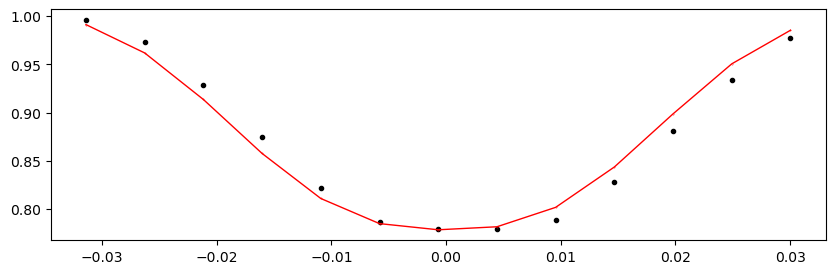

55342.533800897996 1.006183528031924 -0.22784046100458272 -0.322614588540863


100%|██████████████████████████████████████████████████████| 10000/10000 [00:08<00:00, 1114.26it/s]


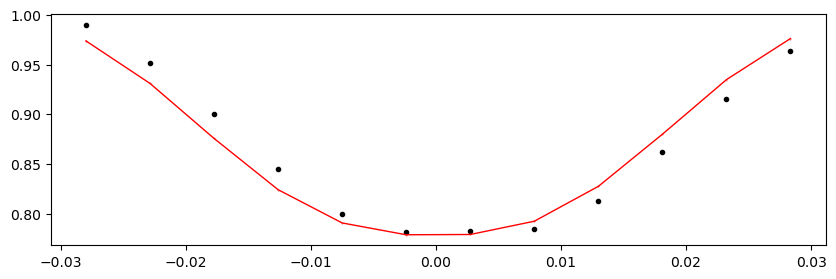

55346.52526089799 1.006183528031924 -0.22784046100458272 -0.322614588540863


100%|██████████████████████████████████████████████████████| 10000/10000 [00:07<00:00, 1346.01it/s]


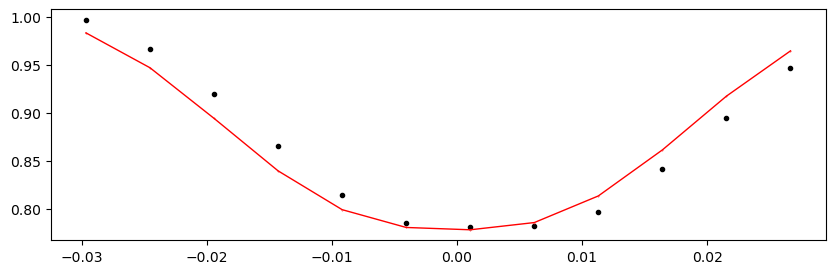

55350.516720898 1.006183528031924 -0.22784046100458272 -0.322614588540863


100%|██████████████████████████████████████████████████████| 10000/10000 [00:07<00:00, 1334.25it/s]


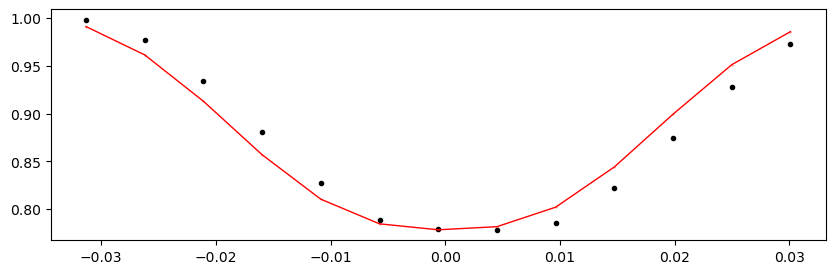

55354.508180897996 1.006183528031924 -0.22784046100458272 -0.322614588540863


100%|██████████████████████████████████████████████████████| 10000/10000 [00:07<00:00, 1339.74it/s]


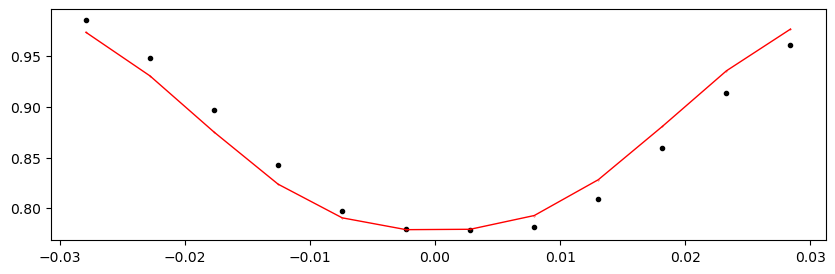

55358.49964089799 1.006183528031924 -0.22784046100458272 -0.322614588540863


100%|██████████████████████████████████████████████████████| 10000/10000 [00:07<00:00, 1344.05it/s]


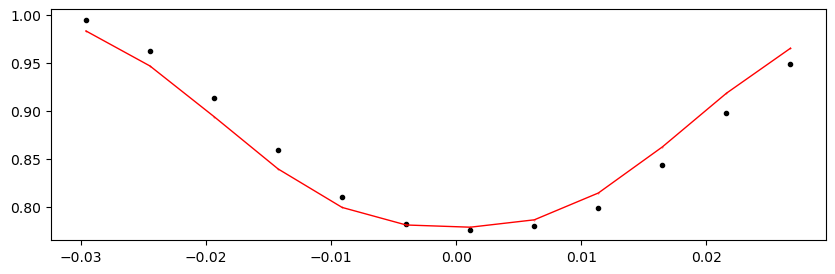

55362.491100898 1.006183528031924 -0.22784046100458272 -0.322614588540863


100%|██████████████████████████████████████████████████████| 10000/10000 [00:07<00:00, 1334.94it/s]


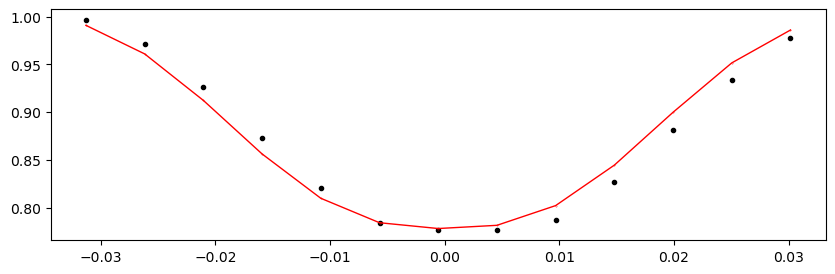

55366.482560897995 1.006183528031924 -0.22784046100458272 -0.322614588540863


100%|██████████████████████████████████████████████████████| 10000/10000 [00:07<00:00, 1342.41it/s]


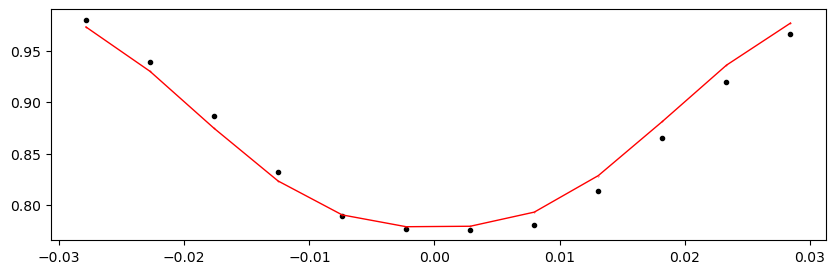

55370.47402089799 1.006183528031924 -0.22784046100458272 -0.322614588540863


100%|██████████████████████████████████████████████████████| 10000/10000 [00:07<00:00, 1344.23it/s]


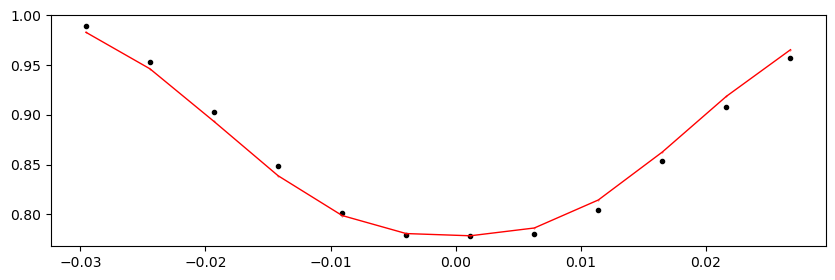

55374.465480898 1.006183528031924 -0.22784046100458272 -0.322614588540863


100%|██████████████████████████████████████████████████████| 10000/10000 [00:07<00:00, 1309.85it/s]


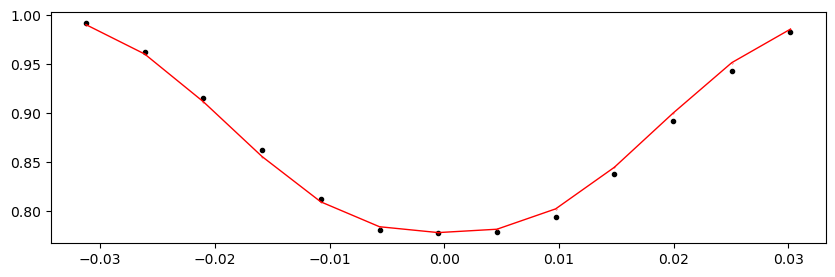

55378.456940897995 1.006183528031924 -0.22784046100458272 -0.322614588540863


100%|██████████████████████████████████████████████████████| 10000/10000 [00:07<00:00, 1326.22it/s]


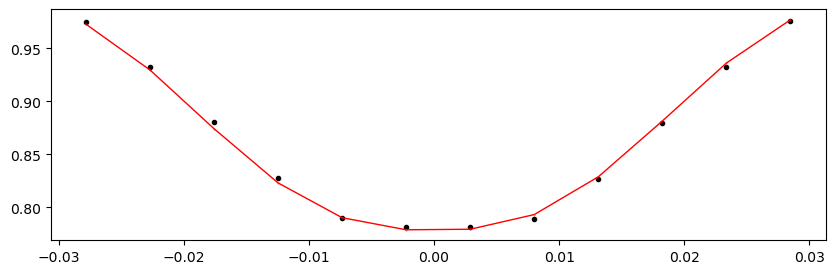

55382.44840089799 1.006183528031924 -0.22784046100458272 -0.322614588540863


100%|██████████████████████████████████████████████████████| 10000/10000 [00:07<00:00, 1344.88it/s]


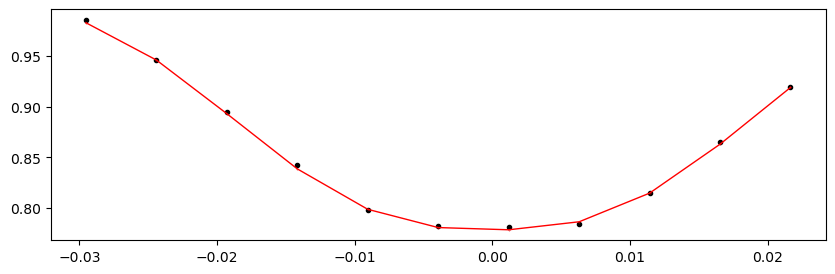

55386.439860898 1.006183528031924 -0.22784046100458272 -0.322614588540863


100%|██████████████████████████████████████████████████████| 10000/10000 [00:07<00:00, 1347.76it/s]


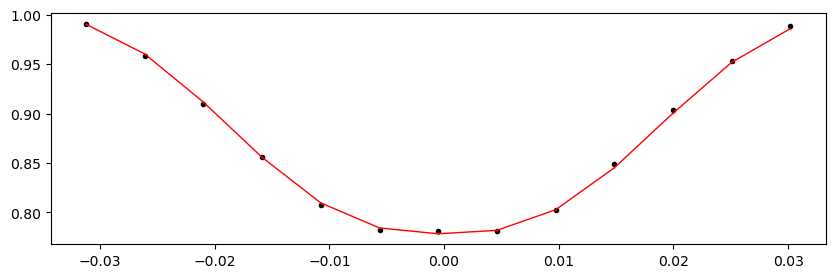

55390.431320897995 1.006183528031924 -0.22784046100458272 -0.322614588540863


100%|██████████████████████████████████████████████████████| 10000/10000 [00:07<00:00, 1356.95it/s]


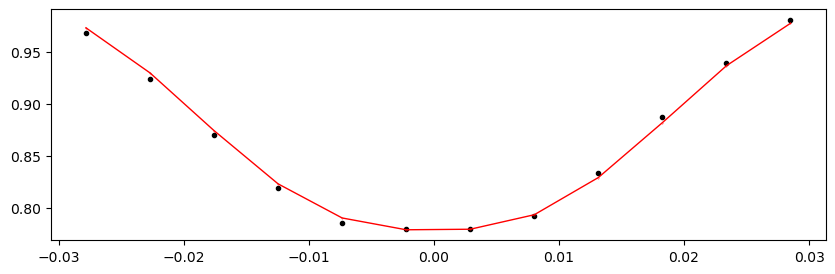

55394.42278089799 1.006183528031924 -0.22784046100458272 -0.322614588540863


100%|██████████████████████████████████████████████████████| 10000/10000 [00:07<00:00, 1349.50it/s]


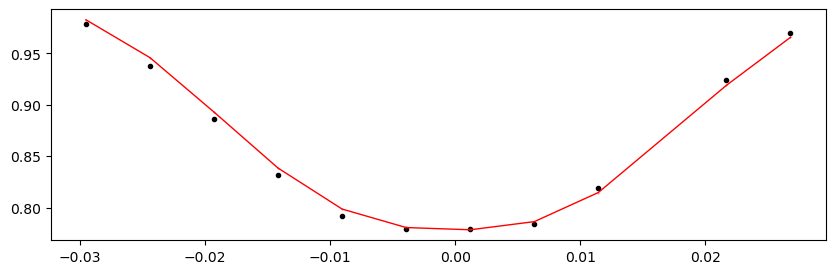

55398.414240898 1.006183528031924 -0.22784046100458272 -0.322614588540863


100%|██████████████████████████████████████████████████████| 10000/10000 [00:07<00:00, 1342.32it/s]


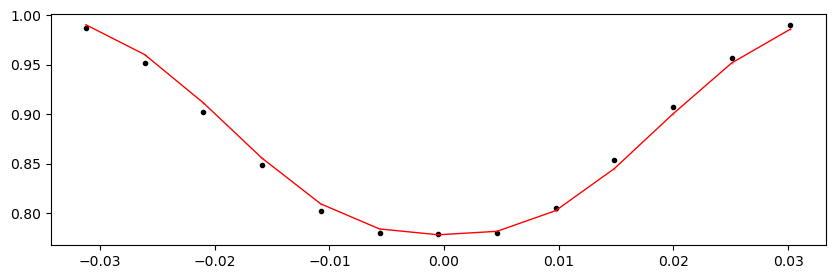

55402.405700897994 1.006183528031924 -0.22784046100458272 -0.322614588540863


100%|██████████████████████████████████████████████████████| 10000/10000 [00:07<00:00, 1344.05it/s]


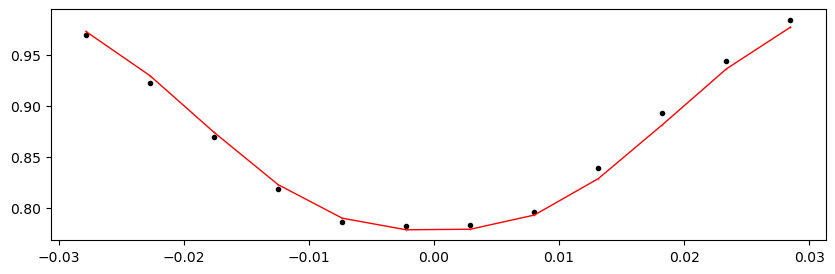

55406.39716089799 1.006183528031924 -0.22784046100458272 -0.322614588540863


100%|██████████████████████████████████████████████████████| 10000/10000 [00:07<00:00, 1346.80it/s]


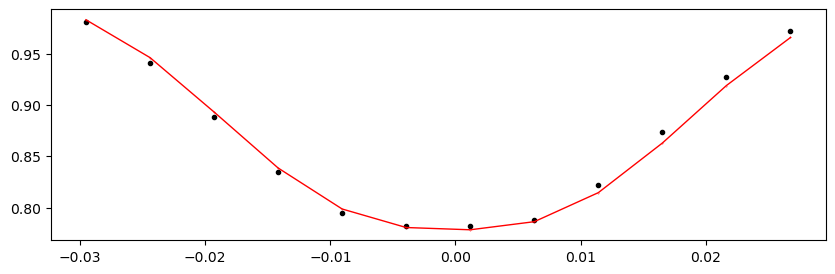

55410.388620898 1.006183528031924 -0.22784046100458272 -0.322614588540863


100%|██████████████████████████████████████████████████████| 10000/10000 [00:07<00:00, 1326.27it/s]


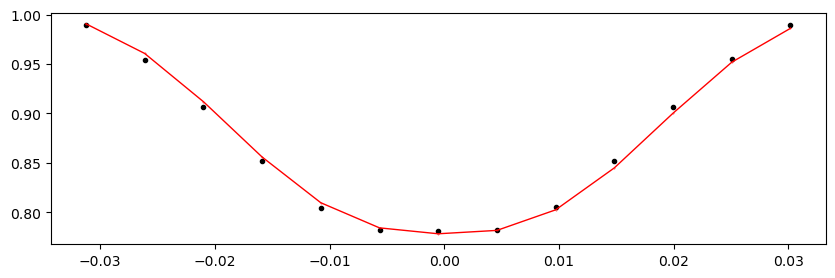

55414.380080897994 1.006183528031924 -0.22784046100458272 -0.322614588540863


100%|██████████████████████████████████████████████████████| 10000/10000 [00:07<00:00, 1337.82it/s]


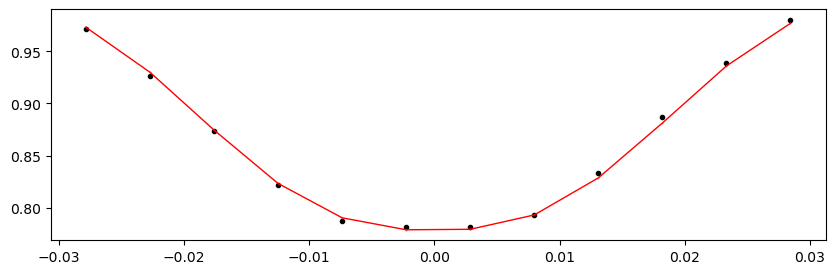

55418.37154089799 1.006183528031924 -0.22784046100458272 -0.322614588540863


100%|██████████████████████████████████████████████████████| 10000/10000 [00:07<00:00, 1285.38it/s]


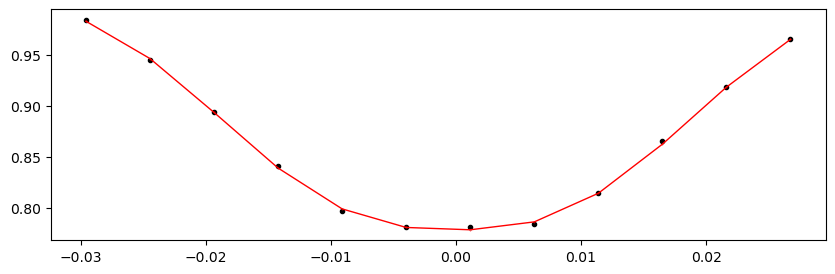

55422.363000897996 1.006183528031924 -0.22784046100458272 -0.322614588540863


100%|██████████████████████████████████████████████████████| 10000/10000 [00:07<00:00, 1360.76it/s]


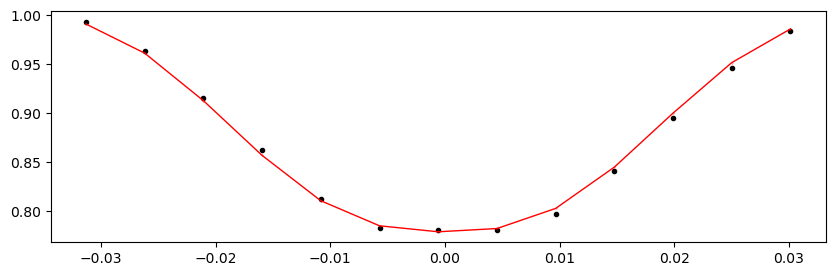

55426.354460897994 1.006183528031924 -0.22784046100458272 -0.322614588540863


100%|██████████████████████████████████████████████████████| 10000/10000 [00:07<00:00, 1355.03it/s]


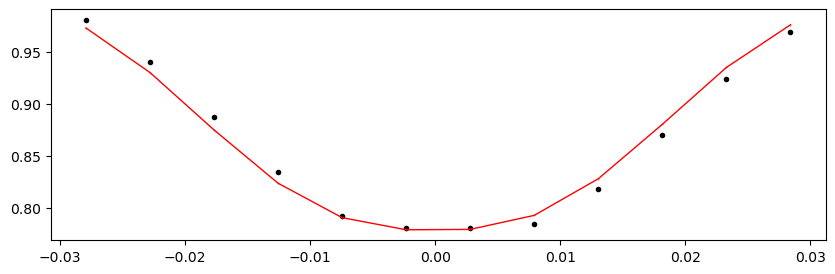

55430.34592089799 1.006183528031924 -0.22784046100458272 -0.322614588540863


100%|██████████████████████████████████████████████████████| 10000/10000 [00:07<00:00, 1327.13it/s]


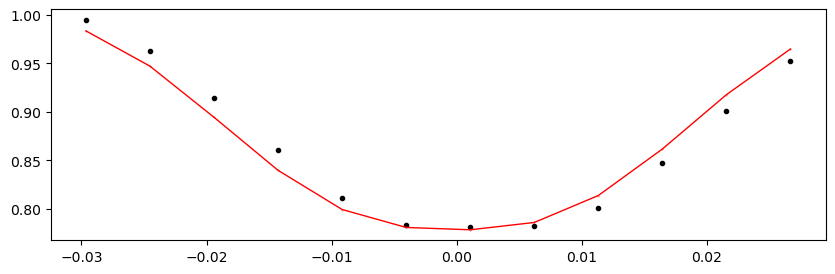

55434.337380897996 1.006183528031924 -0.22784046100458272 -0.322614588540863


100%|██████████████████████████████████████████████████████| 10000/10000 [00:07<00:00, 1341.37it/s]


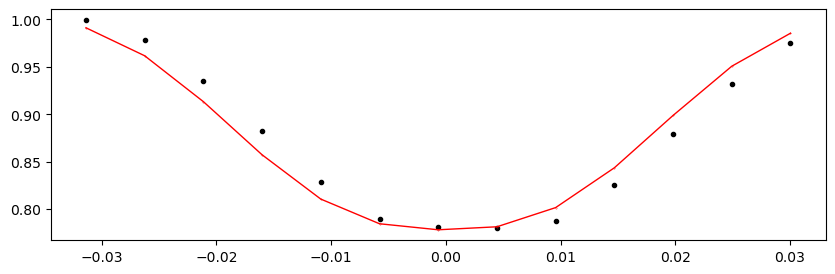

55438.32884089799 1.006183528031924 -0.22784046100458272 -0.322614588540863


100%|██████████████████████████████████████████████████████| 10000/10000 [00:07<00:00, 1339.76it/s]


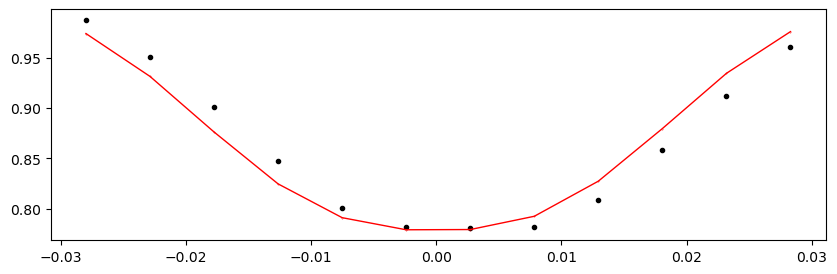

55442.320300898 1.006183528031924 -0.22784046100458272 -0.322614588540863


100%|██████████████████████████████████████████████████████| 10000/10000 [00:07<00:00, 1345.90it/s]


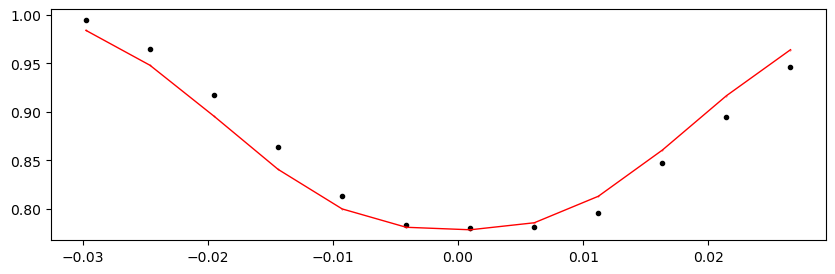

55446.311760897996 1.006183528031924 -0.22784046100458272 -0.322614588540863


100%|██████████████████████████████████████████████████████| 10000/10000 [00:07<00:00, 1341.39it/s]


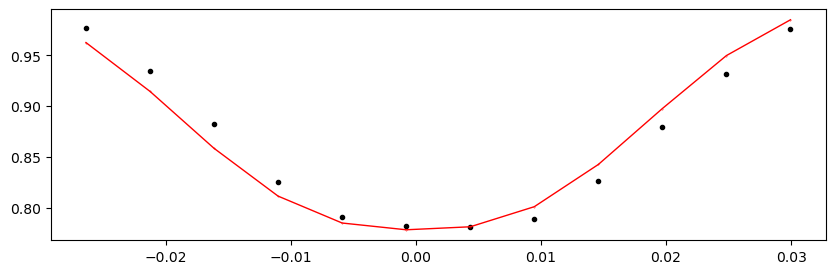

55450.30322089799 1.006183528031924 -0.22784046100458272 -0.322614588540863


100%|██████████████████████████████████████████████████████| 10000/10000 [00:07<00:00, 1348.56it/s]


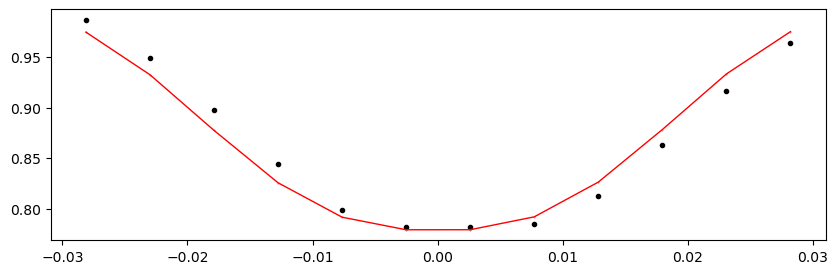

55454.294680898 1.006183528031924 -0.22784046100458272 -0.322614588540863


100%|██████████████████████████████████████████████████████| 10000/10000 [00:07<00:00, 1347.72it/s]


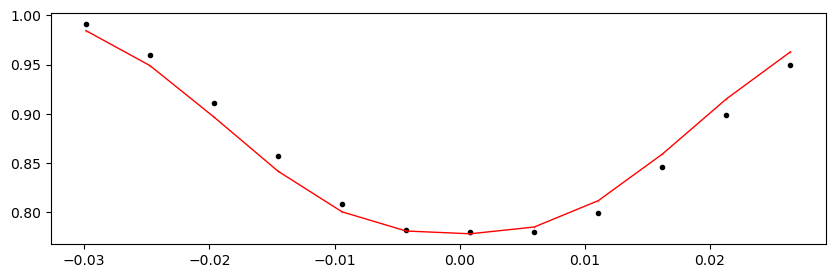

55458.286140897995 1.006183528031924 -0.22784046100458272 -0.322614588540863


100%|██████████████████████████████████████████████████████| 10000/10000 [00:07<00:00, 1339.69it/s]


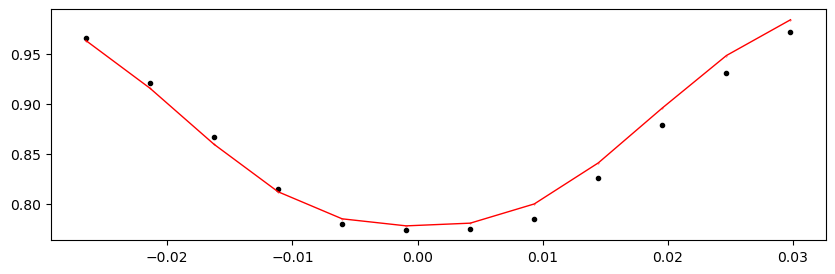

55466.269060898 1.006183528031924 -0.22784046100458272 -0.322614588540863


100%|██████████████████████████████████████████████████████| 10000/10000 [00:07<00:00, 1336.00it/s]


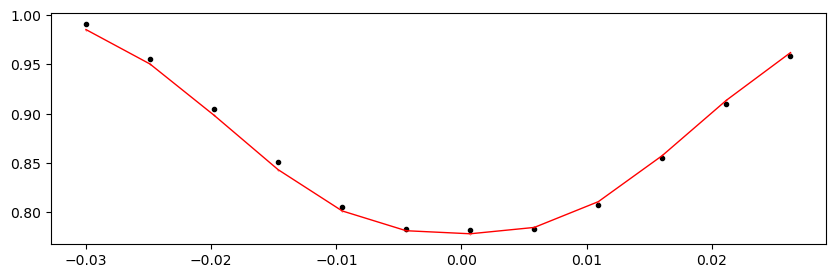

55470.260520897995 1.006183528031924 -0.22784046100458272 -0.322614588540863


100%|██████████████████████████████████████████████████████| 10000/10000 [00:07<00:00, 1333.30it/s]


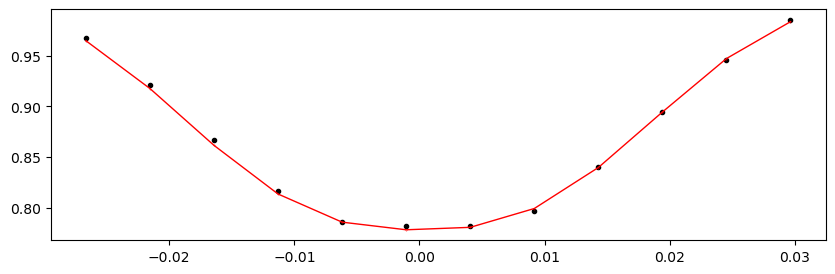

55474.25198089799 1.006183528031924 -0.22784046100458272 -0.322614588540863


100%|██████████████████████████████████████████████████████| 10000/10000 [00:07<00:00, 1304.67it/s]


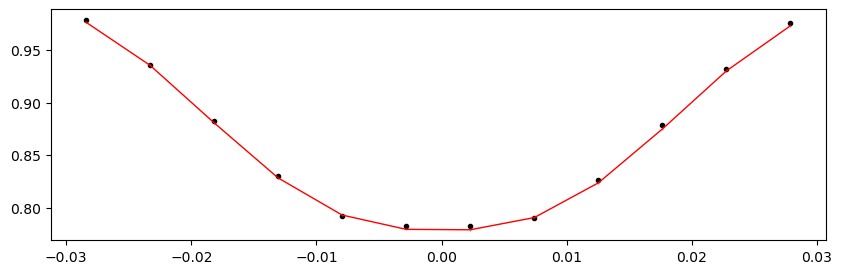

55478.243440898 1.006183528031924 -0.22784046100458272 -0.322614588540863


100%|██████████████████████████████████████████████████████| 10000/10000 [00:08<00:00, 1218.00it/s]


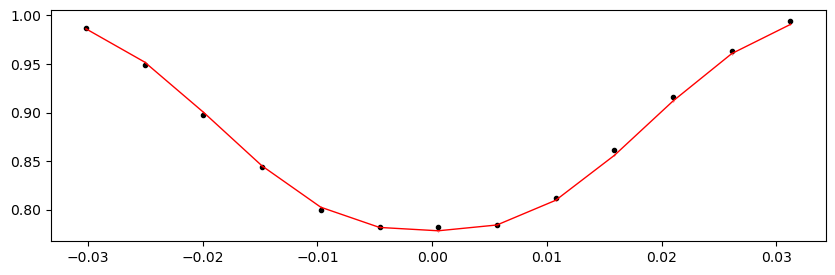

55482.234900897995 1.006183528031924 -0.22784046100458272 -0.322614588540863


100%|██████████████████████████████████████████████████████| 10000/10000 [00:07<00:00, 1319.31it/s]


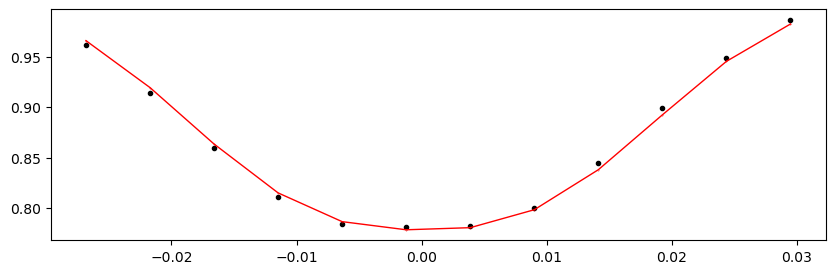

55486.22636089799 1.006183528031924 -0.22784046100458272 -0.322614588540863


100%|██████████████████████████████████████████████████████| 10000/10000 [00:07<00:00, 1345.95it/s]


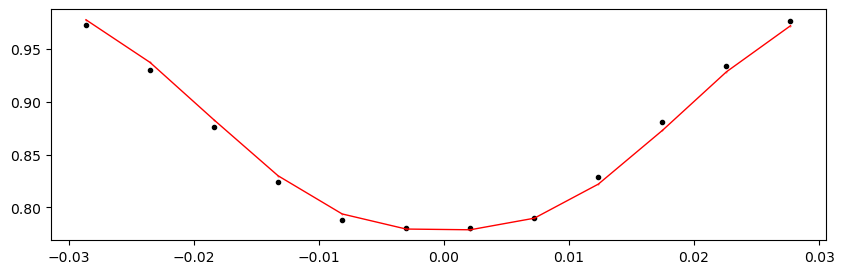

55490.217820898 1.006183528031924 -0.22784046100458272 -0.322614588540863


100%|██████████████████████████████████████████████████████| 10000/10000 [00:07<00:00, 1345.90it/s]


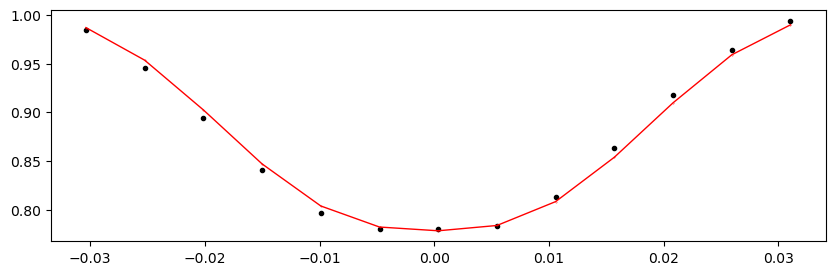

55494.209280897994 1.006183528031924 -0.22784046100458272 -0.322614588540863


100%|██████████████████████████████████████████████████████| 10000/10000 [00:07<00:00, 1339.65it/s]


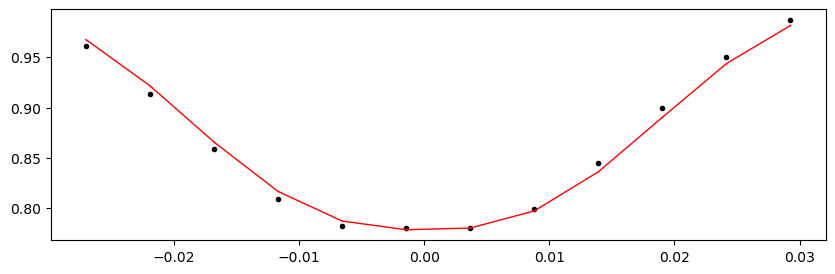

55498.20074089799 1.006183528031924 -0.22784046100458272 -0.322614588540863


100%|██████████████████████████████████████████████████████| 10000/10000 [00:07<00:00, 1338.67it/s]


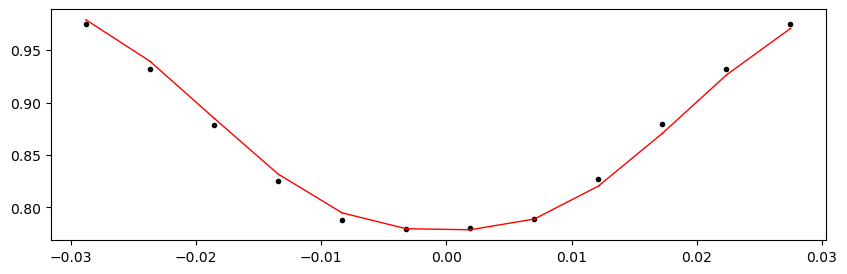

55502.192200898 1.006183528031924 -0.22784046100458272 -0.322614588540863


100%|██████████████████████████████████████████████████████| 10000/10000 [00:07<00:00, 1341.42it/s]


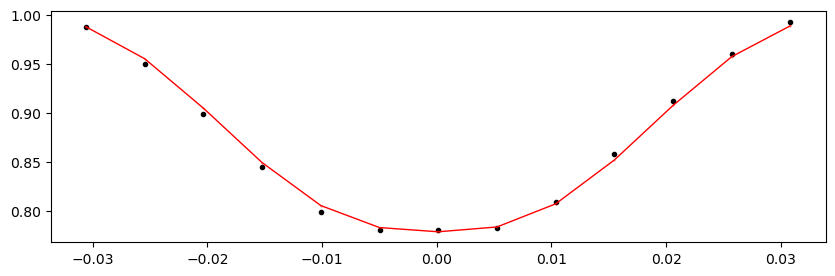

55506.183660897994 1.006183528031924 -0.22784046100458272 -0.322614588540863


100%|██████████████████████████████████████████████████████| 10000/10000 [00:07<00:00, 1339.57it/s]


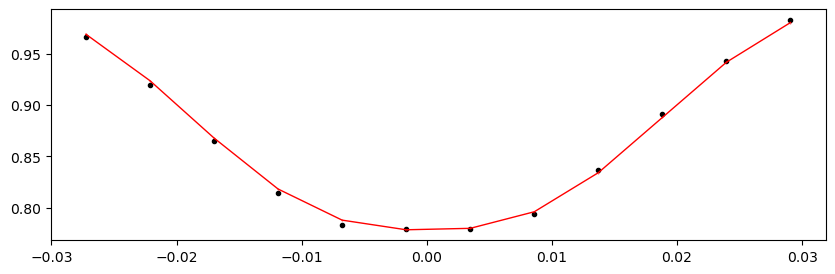

55510.17512089799 1.006183528031924 -0.22784046100458272 -0.322614588540863


100%|██████████████████████████████████████████████████████| 10000/10000 [00:07<00:00, 1342.28it/s]


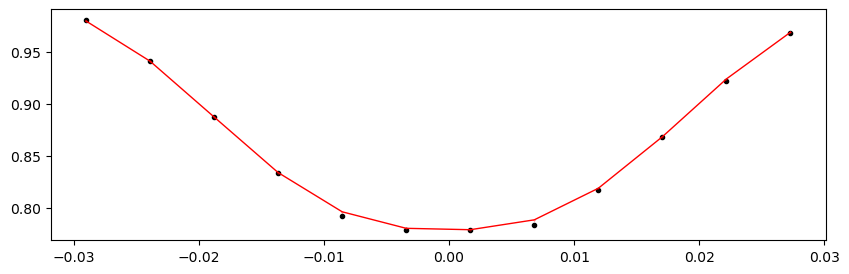

55514.166580897996 1.006183528031924 -0.22784046100458272 -0.322614588540863


100%|██████████████████████████████████████████████████████| 10000/10000 [00:07<00:00, 1307.25it/s]


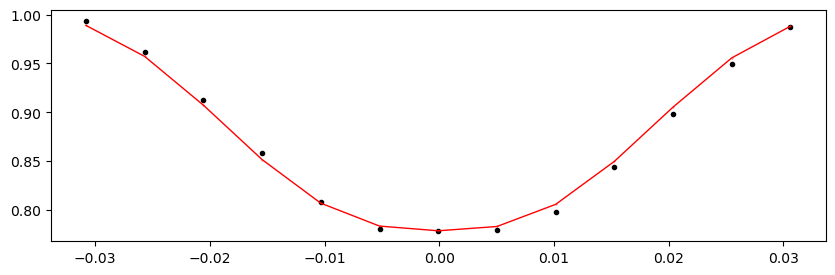

55518.15804089799 1.006183528031924 -0.22784046100458272 -0.322614588540863


100%|██████████████████████████████████████████████████████| 10000/10000 [00:07<00:00, 1344.10it/s]


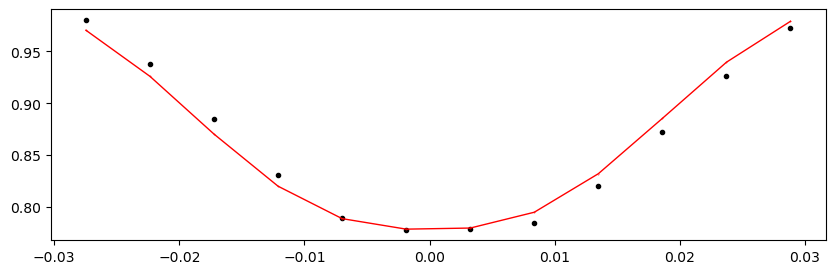

55522.149500898 1.006183528031924 -0.22784046100458272 -0.322614588540863


100%|██████████████████████████████████████████████████████| 10000/10000 [00:07<00:00, 1348.53it/s]


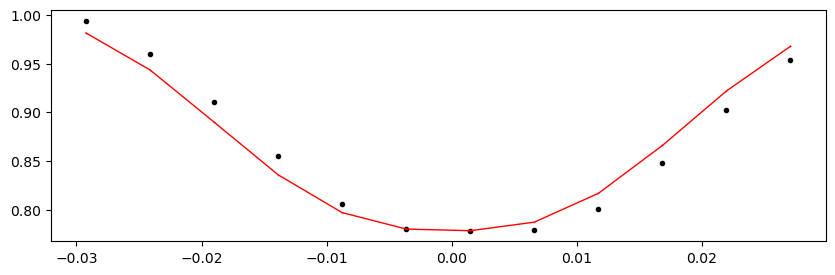

55526.140960897996 1.006183528031924 -0.22784046100458272 -0.322614588540863


100%|██████████████████████████████████████████████████████| 10000/10000 [00:07<00:00, 1354.04it/s]


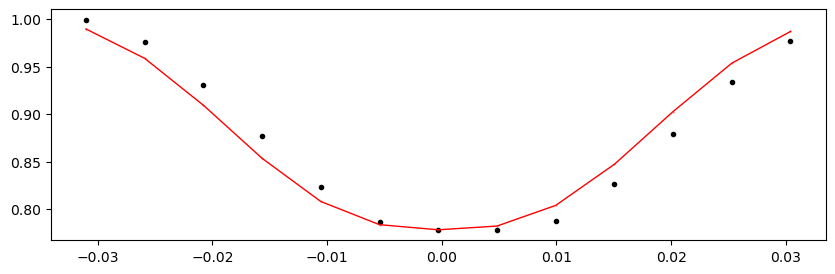

55530.13242089799 1.006183528031924 -0.22784046100458272 -0.322614588540863


100%|██████████████████████████████████████████████████████| 10000/10000 [00:07<00:00, 1350.44it/s]


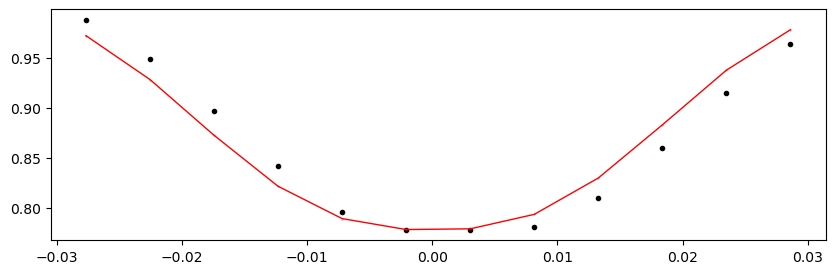

55534.123880898 1.006183528031924 -0.22784046100458272 -0.322614588540863


100%|██████████████████████████████████████████████████████| 10000/10000 [00:07<00:00, 1333.79it/s]


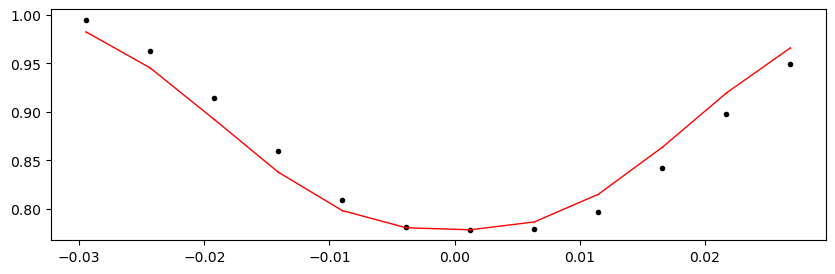

55538.115340897995 1.006183528031924 -0.22784046100458272 -0.322614588540863


100%|██████████████████████████████████████████████████████| 10000/10000 [00:07<00:00, 1342.24it/s]


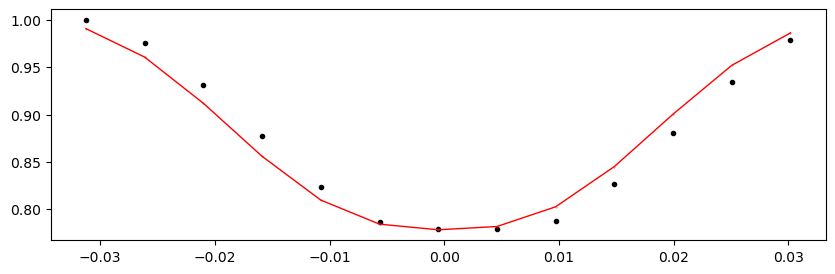

55542.10680089799 1.006183528031924 -0.22784046100458272 -0.322614588540863


100%|██████████████████████████████████████████████████████| 10000/10000 [00:07<00:00, 1352.21it/s]


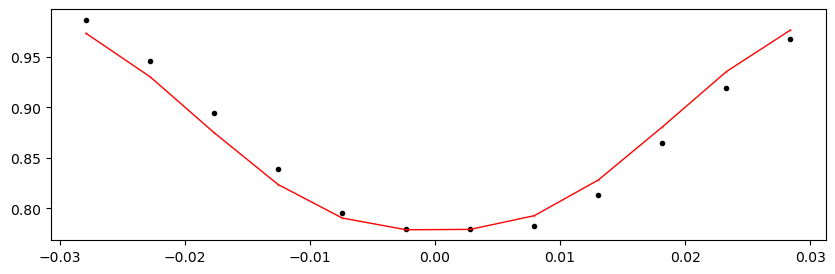

55546.098260898 1.006183528031924 -0.22784046100458272 -0.322614588540863


100%|██████████████████████████████████████████████████████| 10000/10000 [00:07<00:00, 1327.56it/s]


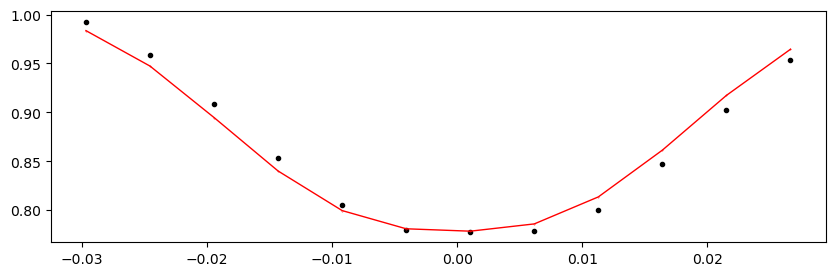

55550.089720897995 1.006183528031924 -0.22784046100458272 -0.322614588540863


100%|██████████████████████████████████████████████████████| 10000/10000 [00:08<00:00, 1228.38it/s]


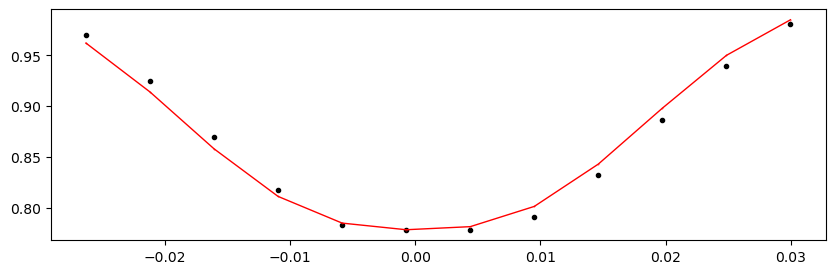

55570.047020898 1.006183528031924 -0.22784046100458272 -0.322614588540863


100%|██████████████████████████████████████████████████████| 10000/10000 [00:07<00:00, 1349.54it/s]


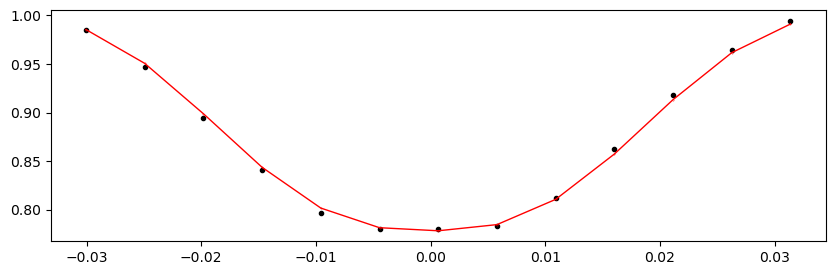

55574.038480897994 1.006183528031924 -0.22784046100458272 -0.322614588540863


100%|██████████████████████████████████████████████████████| 10000/10000 [00:07<00:00, 1354.17it/s]


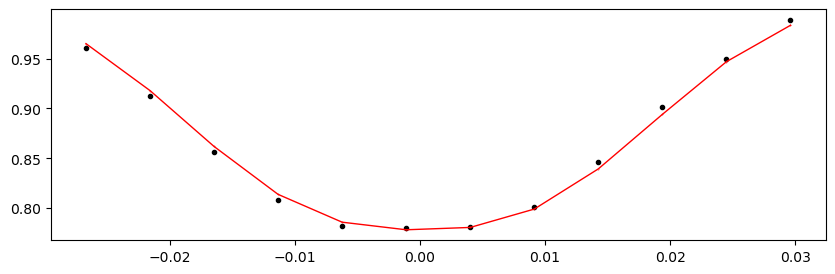

55578.02994089799 1.006183528031924 -0.22784046100458272 -0.322614588540863


100%|██████████████████████████████████████████████████████| 10000/10000 [00:07<00:00, 1346.76it/s]


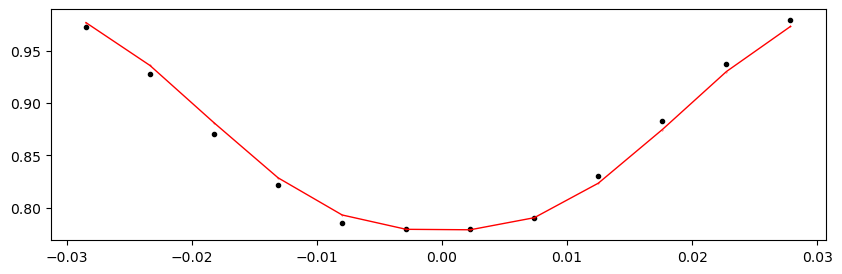

55582.021400898 1.006183528031924 -0.22784046100458272 -0.322614588540863


100%|██████████████████████████████████████████████████████| 10000/10000 [00:07<00:00, 1339.57it/s]


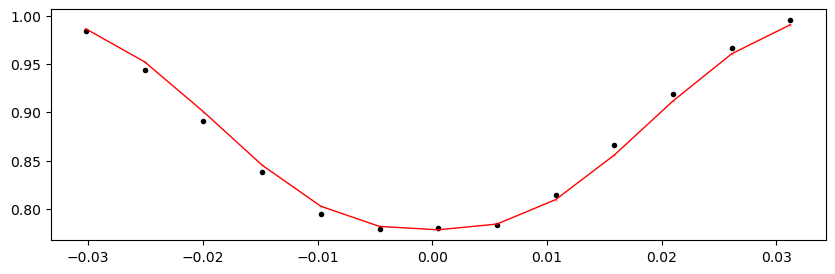

55586.012860897994 1.006183528031924 -0.22784046100458272 -0.322614588540863


100%|██████████████████████████████████████████████████████| 10000/10000 [00:07<00:00, 1341.36it/s]


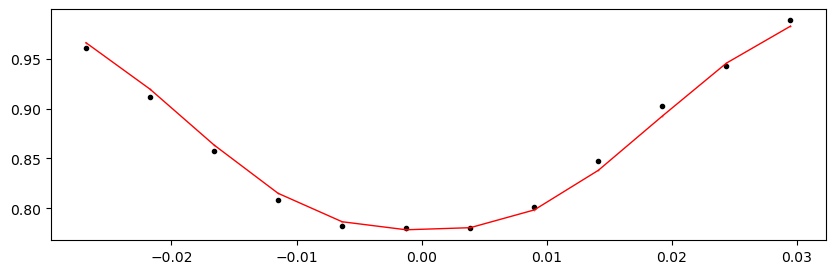

55590.00432089799 1.006183528031924 -0.22784046100458272 -0.322614588540863


100%|██████████████████████████████████████████████████████| 10000/10000 [00:07<00:00, 1341.01it/s]


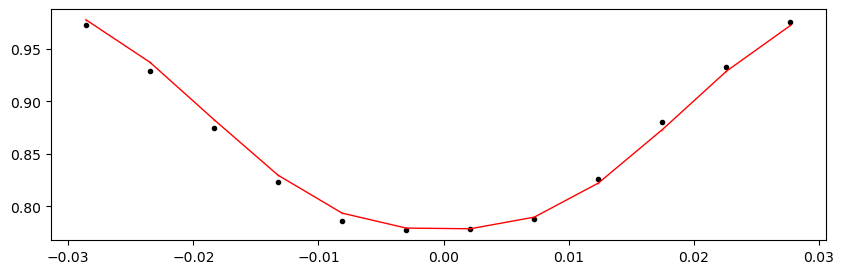

55597.98724089799 1.006183528031924 -0.22784046100458272 -0.322614588540863


100%|██████████████████████████████████████████████████████| 10000/10000 [00:07<00:00, 1329.79it/s]


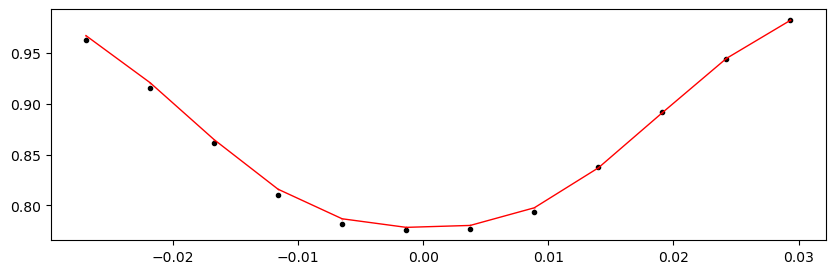

55601.978700898 1.006183528031924 -0.22784046100458272 -0.322614588540863


100%|██████████████████████████████████████████████████████| 10000/10000 [00:07<00:00, 1342.75it/s]


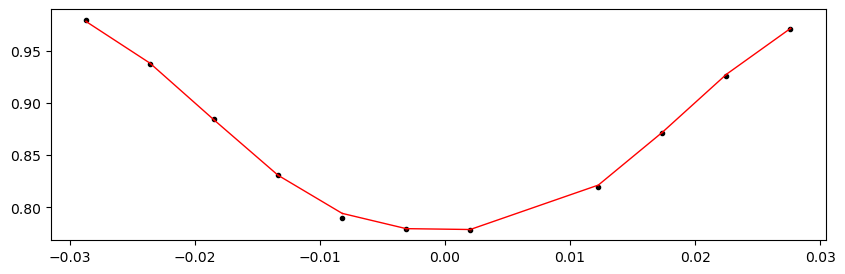

55605.970160897996 1.006183528031924 -0.22784046100458272 -0.322614588540863


100%|██████████████████████████████████████████████████████| 10000/10000 [00:07<00:00, 1347.55it/s]


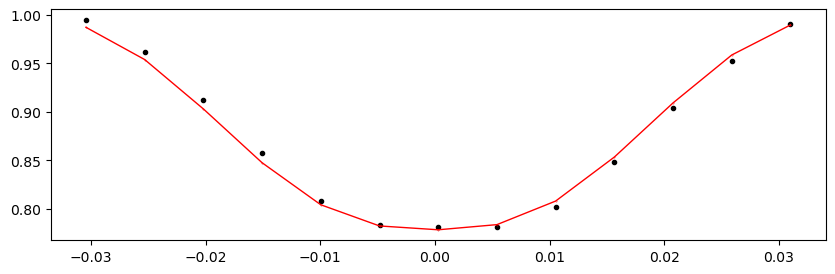

55609.96162089799 1.006183528031924 -0.22784046100458272 -0.322614588540863


100%|██████████████████████████████████████████████████████| 10000/10000 [00:07<00:00, 1345.12it/s]


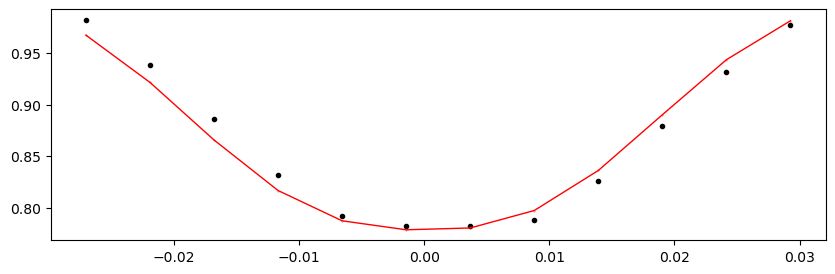

55613.953080898 1.006183528031924 -0.22784046100458272 -0.322614588540863


100%|██████████████████████████████████████████████████████| 10000/10000 [00:07<00:00, 1360.55it/s]


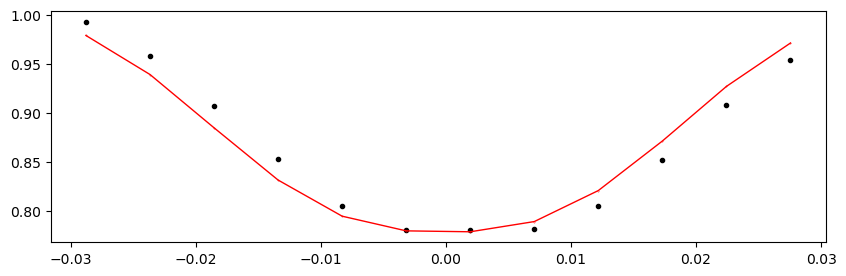

55617.944540897995 1.006183528031924 -0.22784046100458272 -0.322614588540863


100%|██████████████████████████████████████████████████████| 10000/10000 [00:07<00:00, 1349.78it/s]


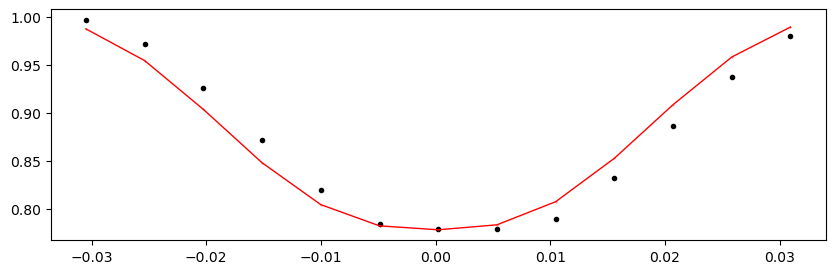

55621.93600089799 1.006183528031924 -0.22784046100458272 -0.322614588540863


100%|██████████████████████████████████████████████████████| 10000/10000 [00:07<00:00, 1360.09it/s]


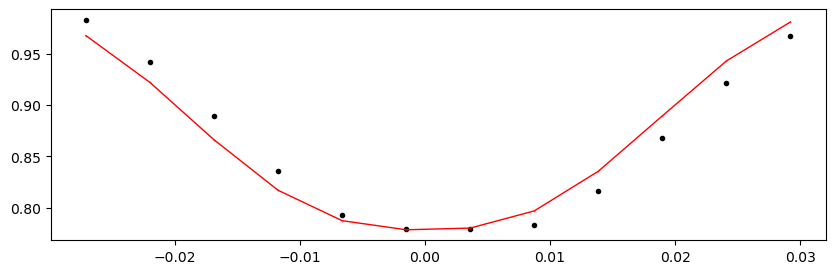

55625.927460898 1.006183528031924 -0.22784046100458272 -0.322614588540863


100%|██████████████████████████████████████████████████████| 10000/10000 [00:07<00:00, 1349.51it/s]


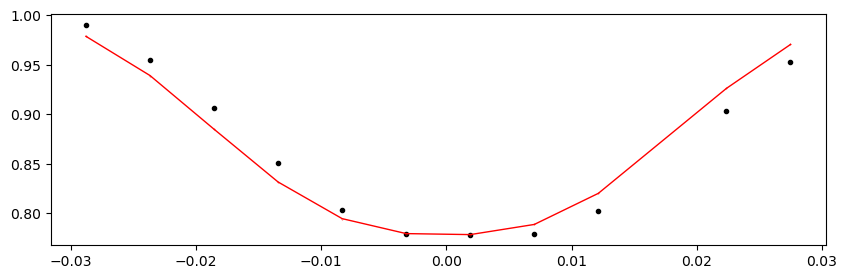

55629.918920897995 1.006183528031924 -0.22784046100458272 -0.322614588540863


100%|██████████████████████████████████████████████████████| 10000/10000 [00:07<00:00, 1360.34it/s]


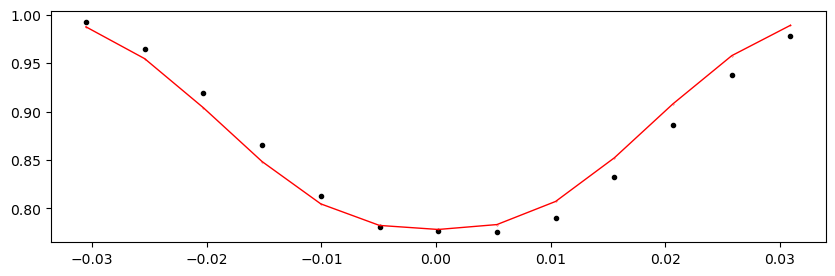

55633.91038089799 1.006183528031924 -0.22784046100458272 -0.322614588540863


100%|██████████████████████████████████████████████████████| 10000/10000 [00:07<00:00, 1342.88it/s]


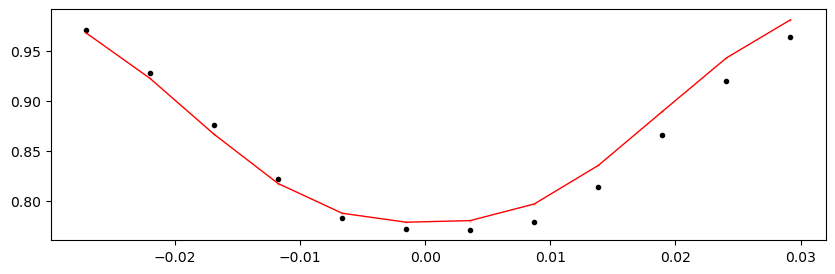

55641.893300897995 1.006183528031924 -0.22784046100458272 -0.322614588540863


100%|██████████████████████████████████████████████████████| 10000/10000 [00:07<00:00, 1348.01it/s]


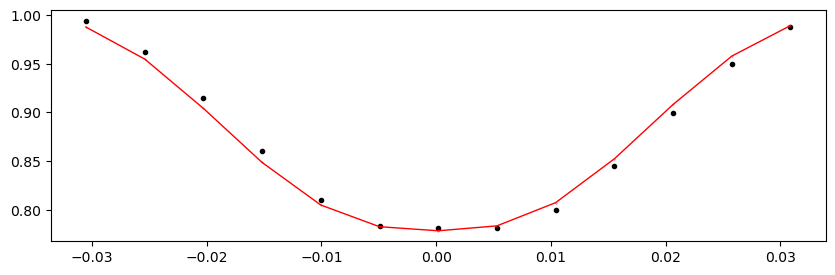

55645.88476089799 1.006183528031924 -0.22784046100458272 -0.322614588540863


100%|██████████████████████████████████████████████████████| 10000/10000 [00:07<00:00, 1350.42it/s]


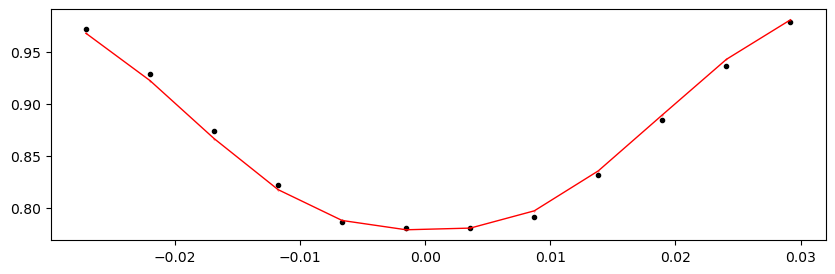

55649.876220898 1.006183528031924 -0.22784046100458272 -0.322614588540863


100%|██████████████████████████████████████████████████████| 10000/10000 [00:07<00:00, 1340.53it/s]


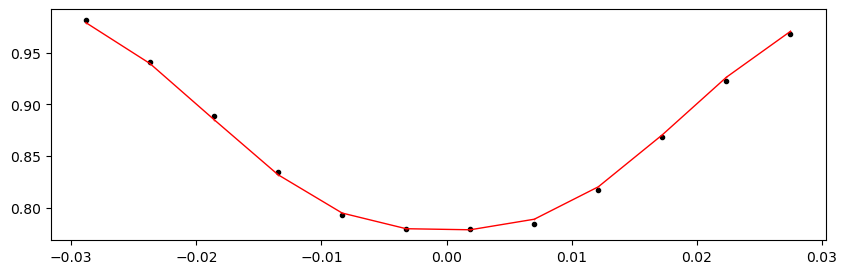

55653.867680897994 1.006183528031924 -0.22784046100458272 -0.322614588540863


100%|██████████████████████████████████████████████████████| 10000/10000 [00:07<00:00, 1321.91it/s]


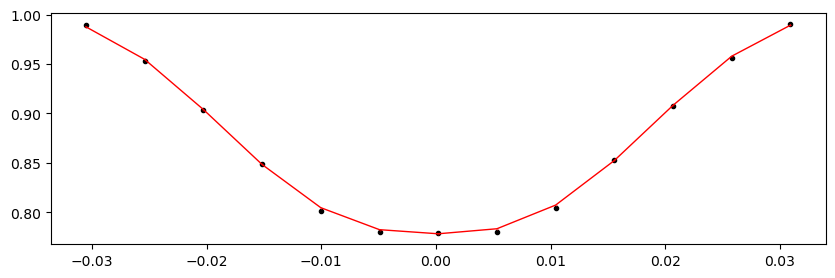

55657.85914089799 1.006183528031924 -0.22784046100458272 -0.322614588540863


100%|██████████████████████████████████████████████████████| 10000/10000 [00:07<00:00, 1352.14it/s]


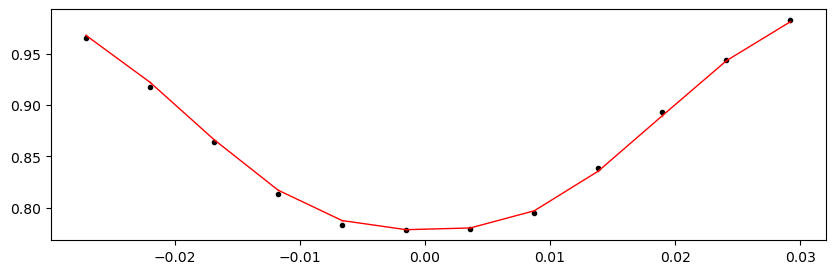

55661.850600898 1.006183528031924 -0.22784046100458272 -0.322614588540863


100%|██████████████████████████████████████████████████████| 10000/10000 [00:07<00:00, 1355.90it/s]


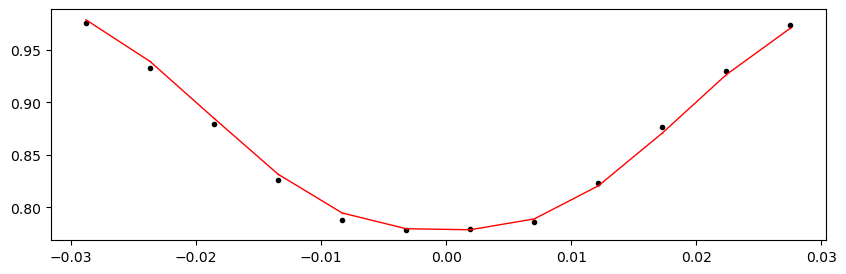

55665.842060897994 1.006183528031924 -0.22784046100458272 -0.322614588540863


100%|██████████████████████████████████████████████████████| 10000/10000 [00:07<00:00, 1351.37it/s]


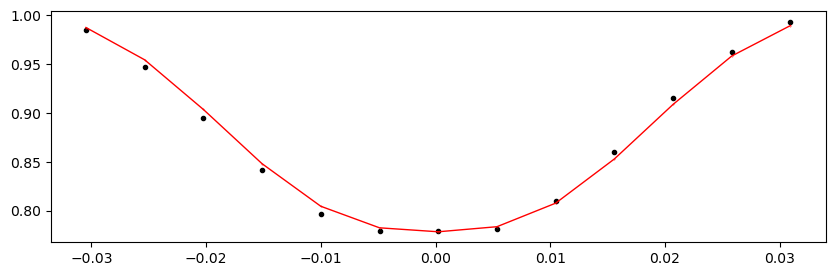

55669.83352089799 1.006183528031924 -0.22784046100458272 -0.322614588540863


100%|██████████████████████████████████████████████████████| 10000/10000 [00:07<00:00, 1347.67it/s]


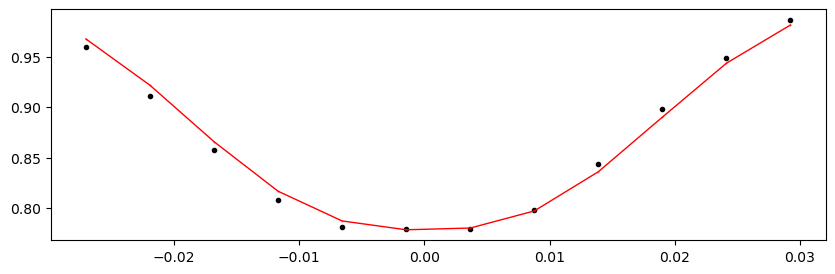

55673.824980897996 1.006183528031924 -0.22784046100458272 -0.322614588540863


100%|██████████████████████████████████████████████████████| 10000/10000 [00:07<00:00, 1344.92it/s]


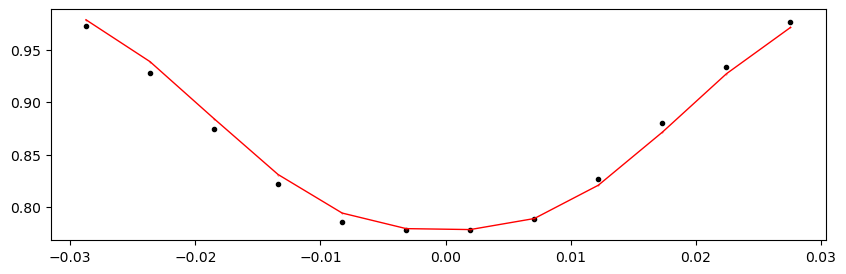

55681.807900898 1.006183528031924 -0.22784046100458272 -0.322614588540863


100%|██████████████████████████████████████████████████████| 10000/10000 [00:07<00:00, 1351.39it/s]


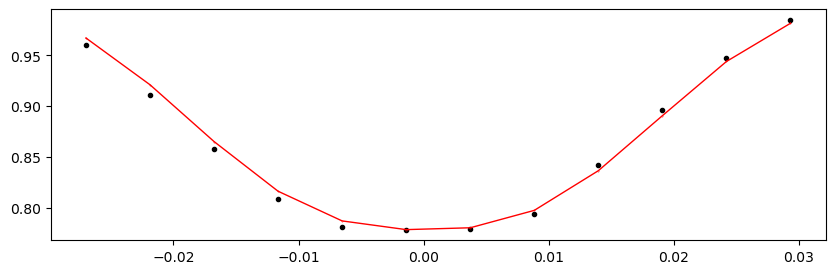

55685.799360897996 1.006183528031924 -0.22784046100458272 -0.322614588540863


100%|██████████████████████████████████████████████████████| 10000/10000 [00:07<00:00, 1350.49it/s]


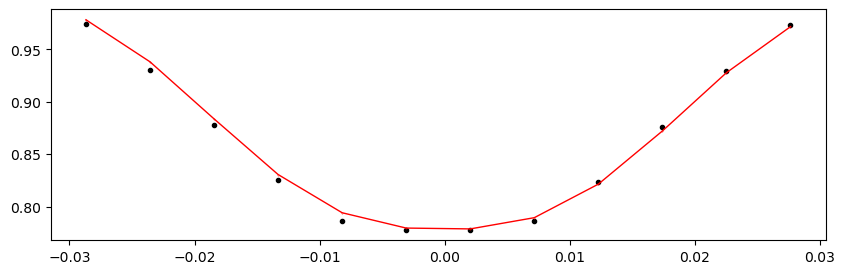

55689.79082089799 1.006183528031924 -0.22784046100458272 -0.322614588540863


100%|██████████████████████████████████████████████████████| 10000/10000 [00:07<00:00, 1334.10it/s]


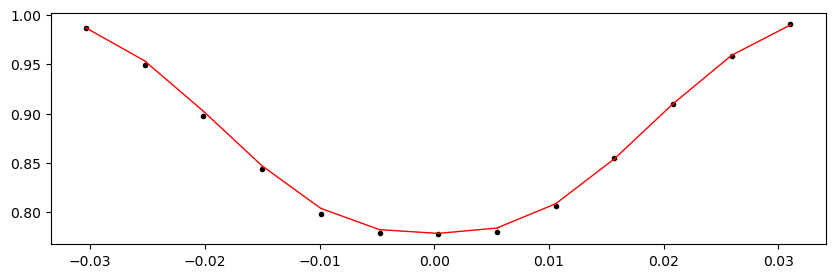

55693.782280898 1.006183528031924 -0.22784046100458272 -0.322614588540863


100%|██████████████████████████████████████████████████████| 10000/10000 [00:07<00:00, 1353.71it/s]


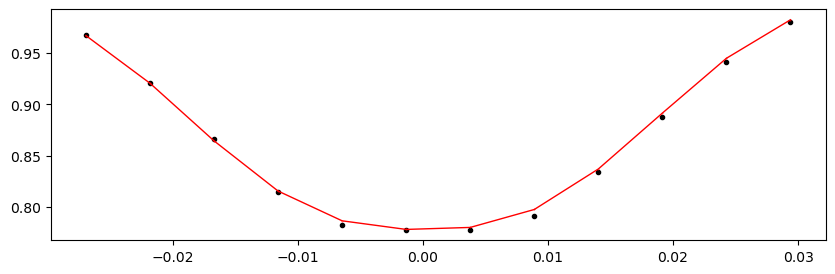

55697.773740897996 1.006183528031924 -0.22784046100458272 -0.322614588540863


100%|██████████████████████████████████████████████████████| 10000/10000 [00:07<00:00, 1350.80it/s]


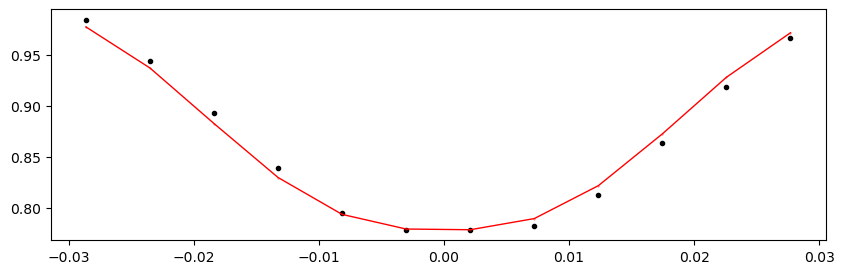

55701.76520089799 1.006183528031924 -0.22784046100458272 -0.322614588540863


100%|██████████████████████████████████████████████████████| 10000/10000 [00:07<00:00, 1355.93it/s]


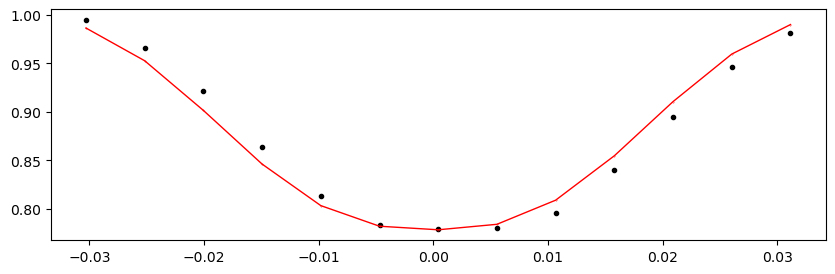

55705.756660898 1.006183528031924 -0.22784046100458272 -0.322614588540863


100%|██████████████████████████████████████████████████████| 10000/10000 [00:07<00:00, 1345.60it/s]


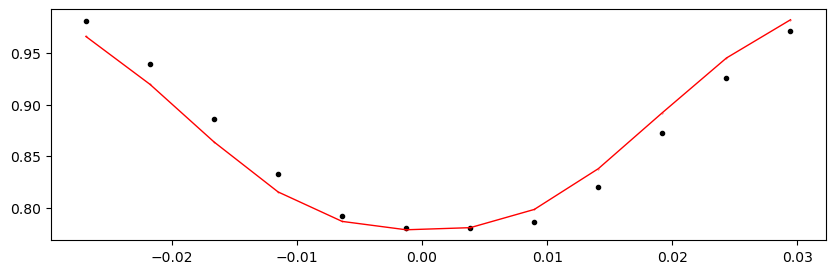

55709.748120897995 1.006183528031924 -0.22784046100458272 -0.322614588540863


100%|██████████████████████████████████████████████████████| 10000/10000 [00:07<00:00, 1348.46it/s]


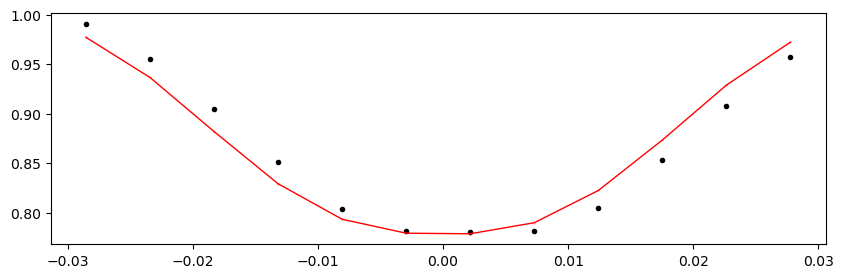

55713.73958089799 1.006183528031924 -0.22784046100458272 -0.322614588540863


100%|██████████████████████████████████████████████████████| 10000/10000 [00:07<00:00, 1351.74it/s]


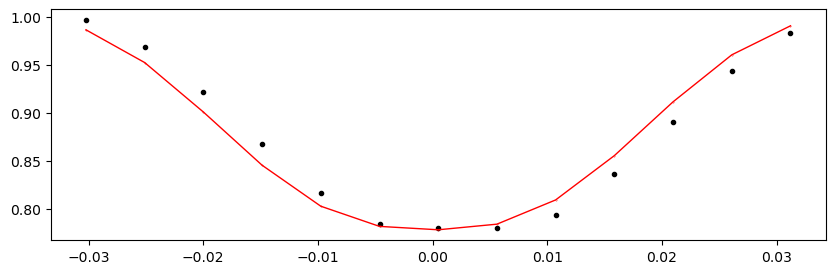

55717.731040898 1.006183528031924 -0.22784046100458272 -0.322614588540863


100%|██████████████████████████████████████████████████████| 10000/10000 [00:07<00:00, 1366.06it/s]


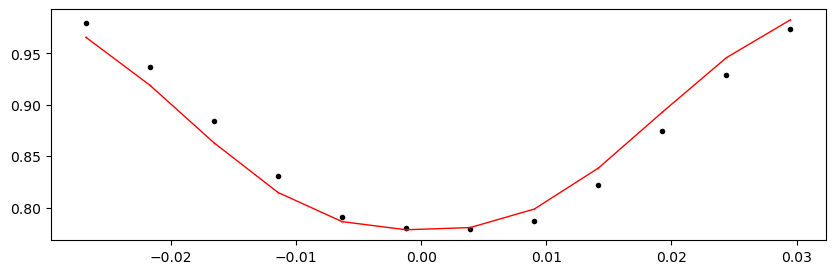

55721.722500897995 1.006183528031924 -0.22784046100458272 -0.322614588540863


100%|██████████████████████████████████████████████████████| 10000/10000 [00:07<00:00, 1337.99it/s]


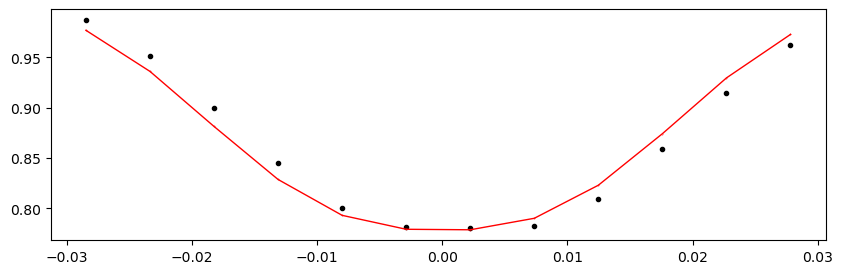

55725.71396089799 1.006183528031924 -0.22784046100458272 -0.322614588540863


100%|██████████████████████████████████████████████████████| 10000/10000 [00:07<00:00, 1346.77it/s]


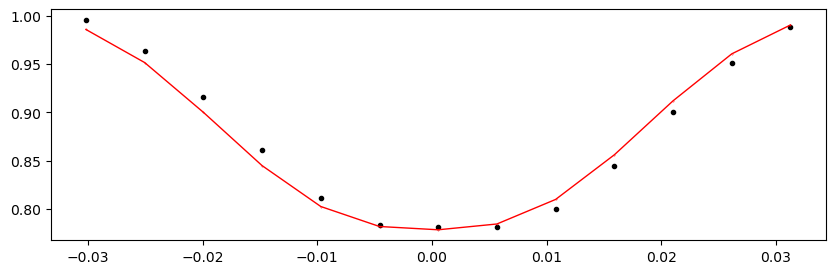

55729.705420898 1.006183528031924 -0.22784046100458272 -0.322614588540863


100%|██████████████████████████████████████████████████████| 10000/10000 [00:07<00:00, 1344.98it/s]


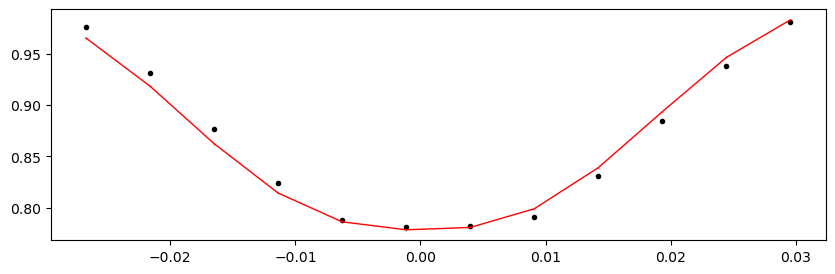

55733.696880897995 1.006183528031924 -0.22784046100458272 -0.322614588540863


100%|██████████████████████████████████████████████████████| 10000/10000 [00:07<00:00, 1348.66it/s]


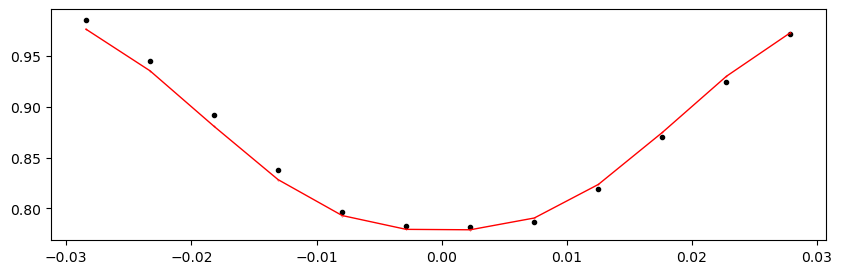

55737.68834089799 1.006183528031924 -0.22784046100458272 -0.322614588540863


100%|██████████████████████████████████████████████████████| 10000/10000 [00:07<00:00, 1349.72it/s]


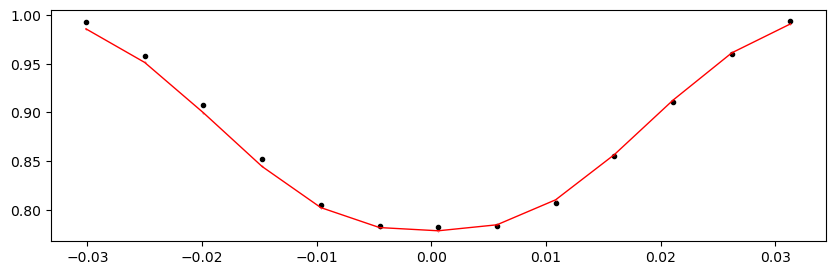

55741.679800898 1.006183528031924 -0.22784046100458272 -0.322614588540863


100%|██████████████████████████████████████████████████████| 10000/10000 [00:07<00:00, 1345.61it/s]


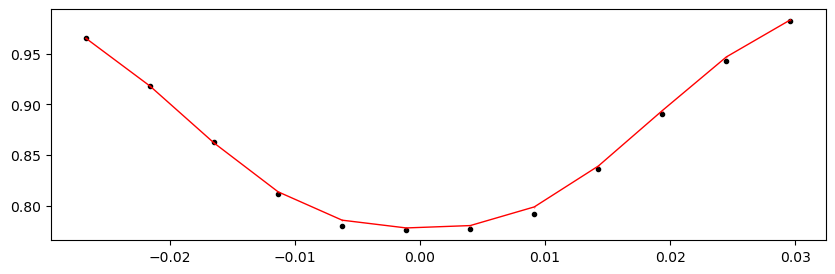

55745.671260897994 1.006183528031924 -0.22784046100458272 -0.322614588540863


100%|██████████████████████████████████████████████████████| 10000/10000 [00:07<00:00, 1343.13it/s]


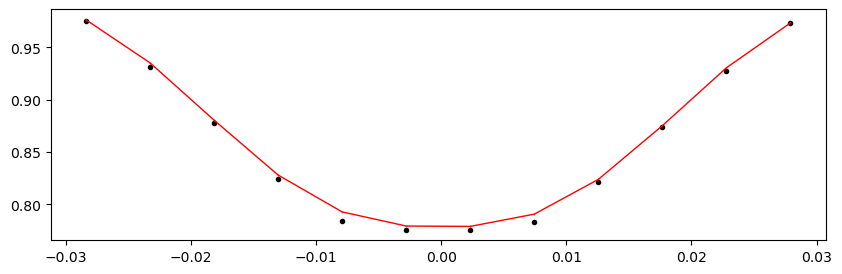

55749.66272089799 1.006183528031924 -0.22784046100458272 -0.322614588540863


100%|██████████████████████████████████████████████████████| 10000/10000 [00:07<00:00, 1350.43it/s]


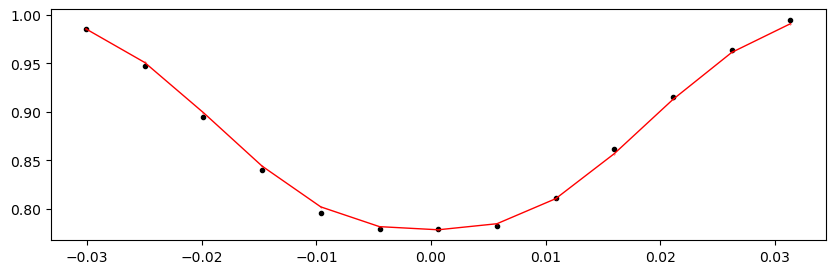

55753.654180898 1.006183528031924 -0.22784046100458272 -0.322614588540863


100%|██████████████████████████████████████████████████████| 10000/10000 [00:07<00:00, 1355.89it/s]


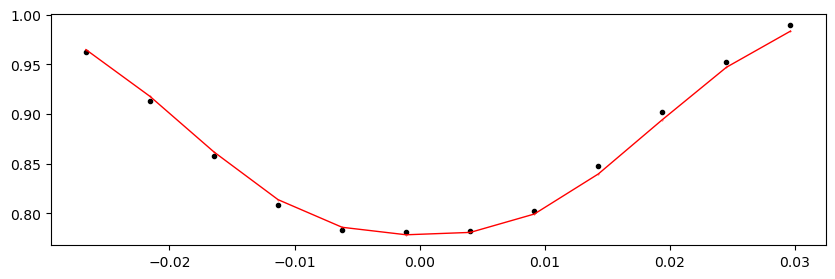

55757.645640897994 1.006183528031924 -0.22784046100458272 -0.322614588540863


100%|██████████████████████████████████████████████████████| 10000/10000 [00:07<00:00, 1336.93it/s]


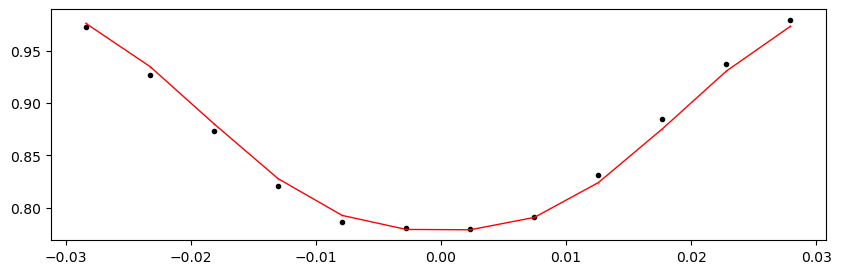

55761.63710089799 1.006183528031924 -0.22784046100458272 -0.322614588540863


100%|██████████████████████████████████████████████████████| 10000/10000 [00:07<00:00, 1349.48it/s]


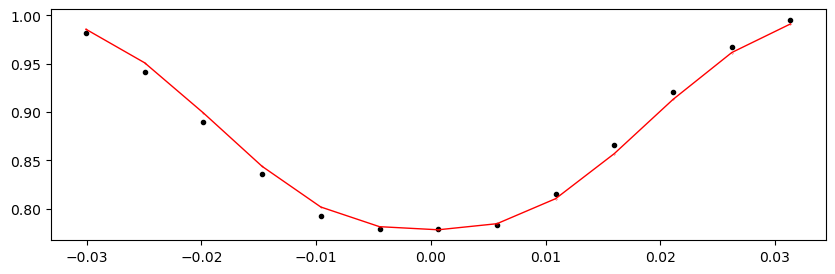

55765.628560897996 1.006183528031924 -0.22784046100458272 -0.322614588540863


100%|██████████████████████████████████████████████████████| 10000/10000 [00:07<00:00, 1316.77it/s]


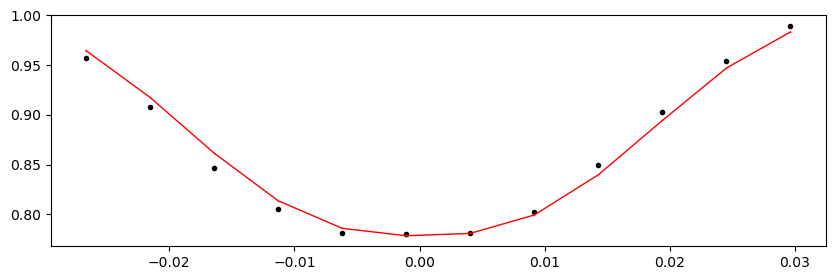

55773.611480898 1.006183528031924 -0.22784046100458272 -0.322614588540863


100%|██████████████████████████████████████████████████████| 10000/10000 [00:07<00:00, 1336.91it/s]


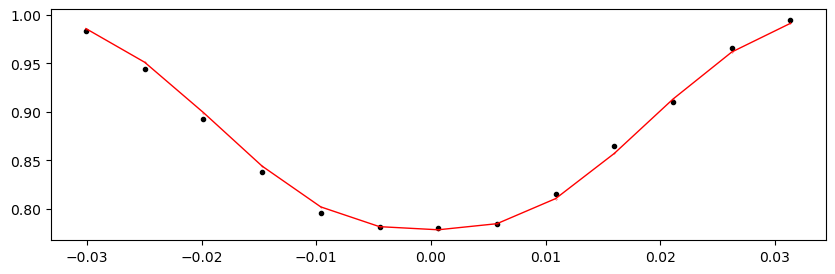

55777.602940897996 1.006183528031924 -0.22784046100458272 -0.322614588540863


100%|██████████████████████████████████████████████████████| 10000/10000 [00:07<00:00, 1335.10it/s]


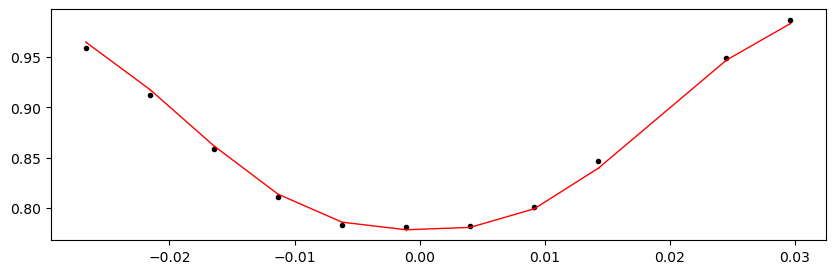

55781.59440089799 1.006183528031924 -0.22784046100458272 -0.322614588540863


100%|██████████████████████████████████████████████████████| 10000/10000 [00:07<00:00, 1350.42it/s]


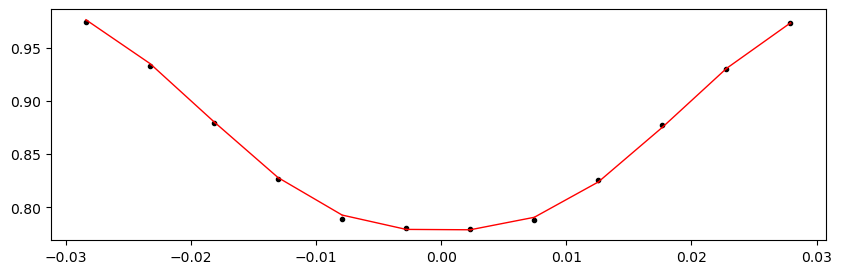

55785.585860898 1.006183528031924 -0.22784046100458272 -0.322614588540863


100%|██████████████████████████████████████████████████████| 10000/10000 [00:07<00:00, 1342.33it/s]


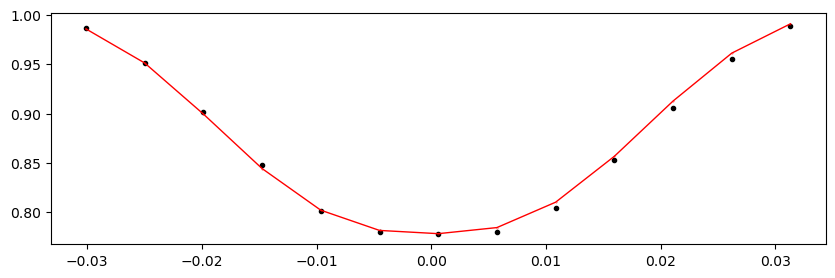

55789.577320897995 1.006183528031924 -0.22784046100458272 -0.322614588540863


100%|██████████████████████████████████████████████████████| 10000/10000 [00:07<00:00, 1340.45it/s]


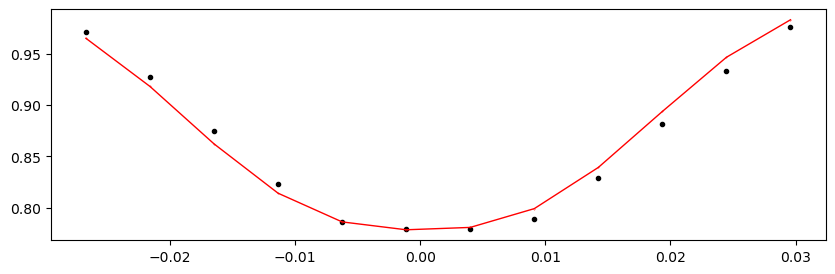

55793.56878089799 1.006183528031924 -0.22784046100458272 -0.322614588540863


100%|██████████████████████████████████████████████████████| 10000/10000 [00:07<00:00, 1344.49it/s]


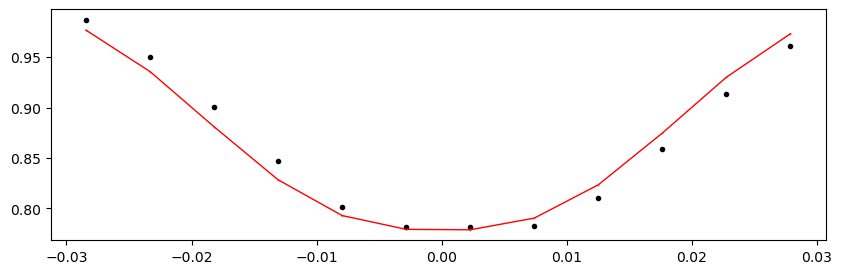

55797.560240898 1.006183528031924 -0.22784046100458272 -0.322614588540863


100%|██████████████████████████████████████████████████████| 10000/10000 [00:07<00:00, 1347.72it/s]


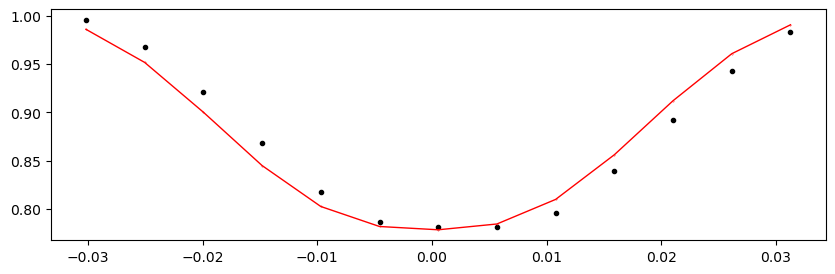

In [28]:
%matplotlib inline

from importlib import reload
reload(etv_functions)

print("Fitting individual primary eclipses...")
etv_functions.fit_each_eclipse(data_primary, n_transits, t0_primary, period, mean_alpha0, mean_alpha1, mean_t0, mean_d, mean_Tau, outfile_path,
                               min_number_data=9,  # Kepler 30-min cadene data requires a lower min_number_data
                              )
!$NOTIFY_CMD "Individual primary eclipses fit done"

# -----

%matplotlib inline

if t0_secondary is not None:
    print("Fitting individual secondary eclipses...")
    etv_functions.fit_each_eclipse(data_secondary, n_transits, t0_secondary, period, mean_alpha0_s, mean_alpha1_s, mean_t0_s, mean_d_s, mean_Tau_s, outfile_path_s,
                                   min_number_data=9,  # Kepler 30-min cadene data requires a lower min_number_data
                                  )
    !$NOTIFY_CMD "Individual secondary eclipses fit done"
else:
    print("No secondary eclipses defined. No-Op.")

## ETV O-C plot

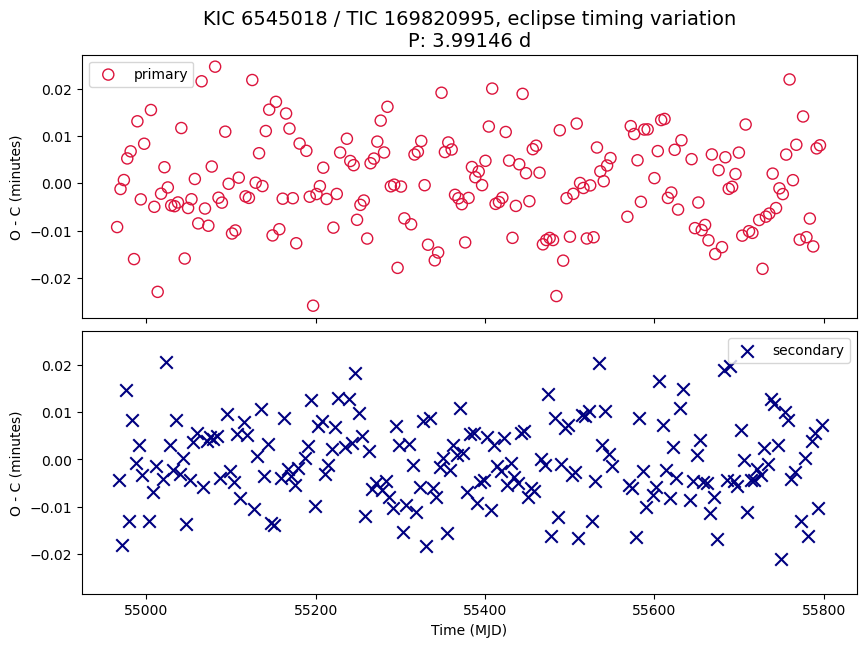

In [29]:
%matplotlib inline
# %matplotlib widget

#plot the extracted transit times to check for ETVs

num_rows = 2 if t0_secondary is not None else 1
figsize_y = 3.3 if num_rows == 1 else num_rows * 3.5
# num_rows = 1  # force to plot primary only
# figsize_y = 3.3

fig, axs = plt.subplots(num_rows, 1, figsize=(10, figsize_y), sharex=True, sharey=True)
if isinstance(axs, plt.Axes):  # handle edge case that num_rows == 1, returned axs is not a list
    axs = [axs]

in_df_primary = pd.read_csv(outfile_path)
in_df_primary['midpoint'] = in_df_primary['epoch'] + (in_df_primary['t0']*period)
in_df_primary['shift_mins'] = in_df_primary['t0']*period*24*60
in_df_primary['std_mins'] = in_df_primary['stdv_t0']*period*24*60


axs[0].scatter(in_df_primary['epoch'], in_df_primary['shift_mins'], 
             marker = 'o', s=8**2, color = 'None', edgecolor = 'crimson', label="primary")
# axs[0].errorbar(in_df_primary['epoch'], in_df_primary['shift_mins'], yerr = in_df_primary['std_mins'], 
#              lw = 0, marker = 'o', elinewidth = 1, markersize = 8, color = 'None', ecolor='crimson', markeredgecolor = 'crimson', label="primary")

# if False:
if t0_secondary is not None:
    in_df_secondary = pd.read_csv(outfile_path_s)
    in_df_secondary['midpoint'] = in_df_secondary['epoch'] + (in_df_secondary['t0']*period)
    in_df_secondary['shift_mins'] = in_df_secondary['t0']*period*24*60
    in_df_secondary['std_mins'] = in_df_secondary['stdv_t0']*period*24*60
    axs[1].scatter(in_df_secondary['epoch'], in_df_secondary['shift_mins'],
                 marker = 'x',  s=9**2, color = 'navy', zorder = -2, label="secondary" );
    # axs[1].errorbar(in_df_secondary['epoch'], in_df_secondary['shift_mins'], yerr = in_df_secondary['std_mins'], 
    #              lw = 0, marker = 'x', elinewidth = 1, markersize = 9, color = 'navy', zorder = -2, label="secondary" );

for ax in axs:
    ax.set_ylabel("O - C (minutes)")
    ax.legend();

axs[-1].set_xlabel(f"Time ({search_result.time.format.upper()})")
axs[0].set_title(f"KIC {kicid} / TIC {ticid}, eclipse timing variation\nP: {period} d", fontsize=14)

plt.subplots_adjust(hspace=0.05)
plt.show()

### O-C Plot, Zoom In

In [ ]:
%matplotlib inline
# %matplotlib widget

#plot the extracted transit times to check for ETVs

num_rows = 2 if t0_secondary is not None else 1
figsize_y = 3.3 if num_rows == 1 else num_rows * 3.5

fig, axs = plt.subplots(num_rows, 1, figsize=(10, figsize_y), sharex=True)
if isinstance(axs, plt.Axes):  # handle edge case that num_rows == 1, returned axs is not a list
    axs = [axs]

in_df_primary = pd.read_csv(outfile_path)
in_df_primary['midpoint'] = in_df_primary['epoch'] + (in_df_primary['t0']*period)
in_df_primary['shift_mins'] = in_df_primary['t0']*period*24*60
in_df_primary['std_mins'] = in_df_primary['stdv_t0']*period*24*60
in_df_primary = in_df_primary[in_df_primary['epoch'] < 55800]

axs[0].scatter(in_df_primary['epoch'], in_df_primary['shift_mins'], 
             marker = 'o', s=8**2, color = 'None', edgecolor = 'crimson', label="primary")

if t0_secondary is not None:
    in_df_secondary = pd.read_csv(outfile_path_s)
    in_df_secondary['midpoint'] = in_df_secondary['epoch'] + (in_df_secondary['t0']*period)
    in_df_secondary['shift_mins'] = in_df_secondary['t0']*period*24*60
    in_df_secondary['std_mins'] = in_df_secondary['stdv_t0']*period*24*60
    in_df_secondary = in_df_secondary[in_df_secondary['epoch'] < 55800]


    axs[1].scatter(in_df_secondary['epoch'], in_df_secondary['shift_mins'],
                 marker = 'x',  s=9**2, color = 'navy', zorder = -2, label="secondary" );

for ax in axs:
    ax.set_ylabel("O - C (minutes)")
    ax.legend();

axs[-1].set_xlabel(f"Time ({search_result.time.format.upper()})")
axs[0].set_title(f"KIC {kicid} / TIC {ticid}, eclipse timing variation\nP: {period} d", fontsize=14)

plt.subplots_adjust(hspace=0.05)
plt.show()

# ---

fig, axs = plt.subplots(num_rows, 1, figsize=(10, figsize_y), sharex=True)
if isinstance(axs, plt.Axes):  # handle edge case that num_rows == 1, returned axs is not a list
    axs = [axs]

in_df_primary = pd.read_csv(outfile_path)
in_df_primary['midpoint'] = in_df_primary['epoch'] + (in_df_primary['t0']*period)
in_df_primary['shift_mins'] = in_df_primary['t0']*period*24*60
in_df_primary['std_mins'] = in_df_primary['stdv_t0']*period*24*60
in_df_primary = in_df_primary[in_df_primary['epoch'] > 59000]

axs[0].scatter(in_df_primary['epoch'], in_df_primary['shift_mins'], 
             marker = 'o', s=8**2, color = 'None', edgecolor = 'crimson', label="primary")

if t0_secondary is not None:
    in_df_secondary = pd.read_csv(outfile_path_s)
    in_df_secondary['midpoint'] = in_df_secondary['epoch'] + (in_df_secondary['t0']*period)
    in_df_secondary['shift_mins'] = in_df_secondary['t0']*period*24*60
    in_df_secondary['std_mins'] = in_df_secondary['stdv_t0']*period*24*60
    in_df_secondary = in_df_secondary[in_df_secondary['epoch'] > 59000]
    in_df_secondary = in_df_secondary[in_df_secondary['shift_mins'] < 10]  # exclude a single outlier

    axs[1].scatter(in_df_secondary['epoch'], in_df_secondary['shift_mins'],
                 marker = 'x',  s=9**2, color = 'navy', zorder = -2, label="secondary" );

    axs[1].set_xlim(axs[1].get_xlim()[0], axs[1].get_xlim()[0] + (axs[0].get_xlim()[1] - axs[0].get_xlim()[0]))  # same X scale

for ax in axs:
    ax.set_ylabel("O - C (minutes)")
    ax.legend();

axs[-1].set_xlabel(f"Time ({search_result.time.format.upper()})")
axs[0].set_title(f"KIC {kicid} / TIC {ticid}, eclipse timing variation\nP: {period} d", fontsize=14)

plt.subplots_adjust(hspace=0.05)
plt.show()


## make a periodogram 

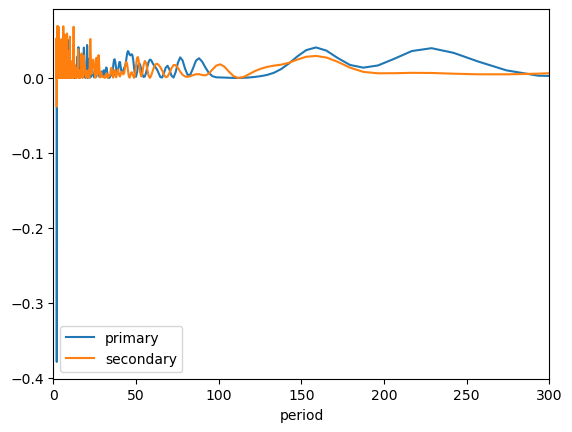

In [30]:
# TESS data roughly has a peak of ~500 days. The period found in Kepler data.
# it's understandably nosier

frequency, power = LombScargle(in_df_primary['epoch'], in_df_primary['shift_mins']).autopower(minimum_frequency=1 / 1000)  # ensure the max period exceeds ~500 d in the paper

fig, ax = plt.subplots()

plt.plot(1/frequency, power, label = 'primary')    

if t0_secondary is not None:
    frequency_s, power_s = LombScargle(in_df_secondary['epoch'], in_df_secondary['shift_mins']).autopower(minimum_frequency=1 / 1000)
    plt.plot(1/frequency_s, power_s, label = 'secondary')    

plt.xlabel("period")

plt.legend()
plt.xlim(0, 300)
plt.show()


## Results Summary

In [32]:
# FILL-IN the ETV results / comments
has_etv = "Practice"  # FP, not only it has no ETV, there is no evidence that the orbital period is significantly different from SB period
comments = "Reproducing Kepler ETV in 2013ApJ: failed for both primary and seconary. The smaller window for the eclipses do not make a difference"

# Eclipse depth from the model
depth_pct_p = round(-mean_alpha1 * 100, 2)
if t0_secondary is not None:
    depth_pct_s = round(-mean_alpha1_s * 100, 2)
else:
    depth_pct_s = None

summary = {
    "tic": ticid,
    "has_etv": has_etv,
    "comments": comments,
    "period": period,  # the period used in ETV analysis
    "depth_pct_p": depth_pct_p,
    "depth_pct_s": depth_pct_s,
    "epoch_p": t0_primary,
    "epoch_s": t0_secondary,
    "num_sectors": len(sr),  # counting TESS only
    "time_span": round(time[-1] - time[0], 2),
    "time_start": round(time[0], 2),
    "time_end": round(time[-1], 2),
}

summary = pd.DataFrame.from_dict(summary, orient="index")
with pd.option_context('display.max_colwidth', None, 'display.max_rows', 999, 'display.max_columns', 99):
    display(summary);

# Single line to be added to a CSV
print("")
print(summary.transpose().to_csv(
    index=False,
    header=True, 
))

,0
tic,169820995
has_etv,Practice
comments,Reproducing Kepler ETV in 2013ApJ: failed for both primary and seconary. The smaller window for the eclipses do not make a difference
period,3.99146
depth_pct_p,29.21
depth_pct_s,22.78
epoch_p,54965.335642
epoch_s,54967.336561
num_sectors,17
time_span,835.98



tic,has_etv,comments,period,depth_pct_p,depth_pct_s,epoch_p,epoch_s,num_sectors,time_span,time_start,time_end
169820995,Practice,Reproducing Kepler ETV in 2013ApJ: failed for both primary and seconary. The smaller window for the eclipses do not make a difference,3.99146,29.21,22.78,54965.335642,54967.336560897995,17,835.98,54964.01,55799.99

